# Analyse Exploratoire Approfondie des Données de Donneurs de Sang

Ce notebook présente une analyse détaillée et interactive des données de donneurs de sang. Les visualisations ont été jointes pour une meilleure compréhension et interprétation des données, et des tests statistiques ont été ajoutés pour renforcer les conclusions.

## Configuration de l'environnement

Importation des bibliothèques nécessaires et configuration des paramètres de visualisation.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import scipy.stats as stats
from statsmodels.stats.proportion import proportions_ztest
from statsmodels.graphics.mosaicplot import mosaic
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')
import calendar

# Configuration de l'affichage dans Jupyter (pour matplotlib)
%matplotlib inline



# Configuration pour de meilleures visualisations
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('viridis')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['legend.fontsize'] = 12
plt.rcParams['figure.titlesize'] = 20

# Définir les chemins des fichiers
data_2019_path = r"C:\Users\Ultra Tech\Desktop\data_2019_pretraite.csv"
data_2020_path = r"C:\Users\Ultra Tech\Desktop\data_2020_pretraite.csv"
data_volontaire_path = r"C:\Users\Ultra Tech\Desktop\data_Volontaire_pretraite.csv"


## Chargement et préparation des données

Chargement des différents jeux de données et affichage de leurs caractéristiques principales.

In [3]:
def load_data():
    """
    Charge les données à partir des fichiers CSV.
    """
    print("Chargement des données...")
    df_2019 = pd.read_csv(data_2019_path)
    df_2020 = pd.read_csv(data_2020_path)
    df_volontaire = pd.read_csv(data_volontaire_path)
    
    print(f"Données 2019: {df_2019.shape[0]} lignes, {df_2019.shape[1]} colonnes")
    print(f"Données 2020: {df_2020.shape[0]} lignes, {df_2020.shape[1]} colonnes")
    print(f"Données Volontaire: {df_volontaire.shape[0]} lignes, {df_volontaire.shape[1]} colonnes")
    
    return df_2019, df_2020, df_volontaire

df_2019, df_2020, df_volontaire = load_data()

Chargement des données...
Données 2019: 1915 lignes, 39 colonnes
Données 2020: 1900 lignes, 6 colonnes
Données Volontaire: 1847 lignes, 40 colonnes


### Exploration initiale des données

Examinons les premières lignes de chaque jeu de données pour comprendre leur structure.

In [4]:
print("Aperçu des données 2019:")
display(df_2019.head())

print("\nAperçu des données 2020:")
display(df_2020.head())

print("\nAperçu des données Volontaire:")
display(df_volontaire.head())

Aperçu des données 2019:


,Date_de_remplissage_de_la_fiche,Date_de_naissance,Niveau_d'etude,Genre,Taille,Poids,Situation_matrimoniale,Profession,Arrondissement_residence,Quartier_residence,...,Raison_de_non-eligibilité_totale_PorteurHIVhbshcv,Raison_de_non-eligibilité_totale_Opéré,Raison_de_non-eligibilité_totale_Drepanocytaire,Raison_de_non-eligibilité_totale_Diabétique,Raison_de_non-eligibilité_totale_Hypertendus,Raison_de_non-eligibilité_totale_Asthmatiques,Raison_de_non-eligibilité_totale_Cardiaque,Raison_de_non-eligibilité_totale_Tatoué,Raison_de_non-eligibilité_totale_Scarifié,Si_autres_raison_préciser
0,2019-11-03 00:00:00,1999-09-01 00:00:00,Pas Précisé,Homme,NaN,NaN,Célibataire,Chaudronnier,Douala 3,Logbaba,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3/21/2019,1978-02-04 00:00:00,Universitaire,Homme,NaN,NaN,Marié (e),Secrétaire comptable,Douala (Non précisé ),NDOGPASSI 2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1977-12-25 00:00:00,1977-12-25 00:00:00,Secondaire,Femme,NaN,NaN,Marié (e),Commerçant (e),Douala (Non précisé ),Dakar,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1986-02-06 00:00:00,1986-02-06 00:00:00,Secondaire,Homme,NaN,NaN,Célibataire,Homme d’affaire,Douala 5,NGANGUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1988-05-20 00:00:00,1988-05-20 00:00:00,Pas Précisé,Homme,NaN,NaN,Célibataire,Beat Maker,Douala (Non précisé ),Douala,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Aperçu des données 2020:


,Horodateur,Sexe,Age,Type de donation,Groupe Sanguin ABO / Rhesus,Phenotype
0,2020-07-16 19:02:33.994,M,26,F,B+,"RH-2, RH+4, RH-3, RH+5, -kell1"
1,2020-07-16 19:05:51.521,M,24,F,O+,"RH-2, RH+4, RH-3, RH+5, -kell1"
2,2020-07-17 04:52:09.054,M,41,F,A+,"RH+2, RH+4, RH-3, RH+5, -kell1"
3,2020-07-17 04:56:03.200,M,20,F,O+,"RH-2, RH+4, RH-3, RH+5, -kell1"
4,2020-07-17 05:49:40.730,M,34,F,O+,"RH-2, RH+4, RH+3, RH+5, -kell1"



Aperçu des données Volontaire:


,ID,Age,Horodateur,Niveau_d'etude,Genre,Taille_,Poids,Situation_matrimoniale,Profession,Arrondissement_residence,...,Raison_de_non-eligibilité_totale_PorteurHIVhbshcv,Raison_de_non-eligibilité_totale_Opéré,Raison_de_non-eligibilité_totale_Drepanocytaire,Raison_de_non-eligibilité_totale_Diabétique,Raison_de_non-eligibilité_totale_Hypertendus,Raison_de_non-eligibilité_totale_Asthmatiques,Raison_de_non-eligibilité_totale_Cardiaque,Raison_de_non-eligibilité_totale_Tatoué,Raison_de_non-eligibilité_totale_Scarifié,Si_autres_raison_préciser_
0,DONOR_1842,24.0,46:44.9,Universitaire,Homme,NaN,NaN,Célibataire,Etudiant (e),Douala 3,...,Non,Non,Non,Non,Non,Non,Non,Non,Non,NaN
1,DONOR_1843,23.0,44:19.0,Universitaire,Homme,NaN,NaN,Célibataire,Sans Emplois,R A S,...,Non,Oui,Non,Non,Non,Non,Non,Non,Non,NaN
2,DONOR_1844,41.0,46:54.3,Aucun,Homme,NaN,NaN,Marié (e),Tailleur,Douala 1,...,Non,Non,Non,Non,Non,Non,Non,Non,Non,Aucune information
3,DONOR_1845,24.0,29:29.7,Universitaire,Homme,NaN,NaN,Célibataire,Etudiant,Douala 5,...,Non,Non,Non,Non,Non,Non,Non,Non,Non,NaN
4,DONOR_1846,30.0,47:47.4,Secondaire,Homme,NaN,NaN,Célibataire,Militaire,Douala (Non précisé ),...,Non,Non,Non,Non,Non,Non,Non,Non,Non,NaN


### Analyse des valeurs manquantes

Visualisons les valeurs manquantes dans chaque jeu de données pour mieux comprendre la qualité des données.

Analyse des valeurs manquantes:


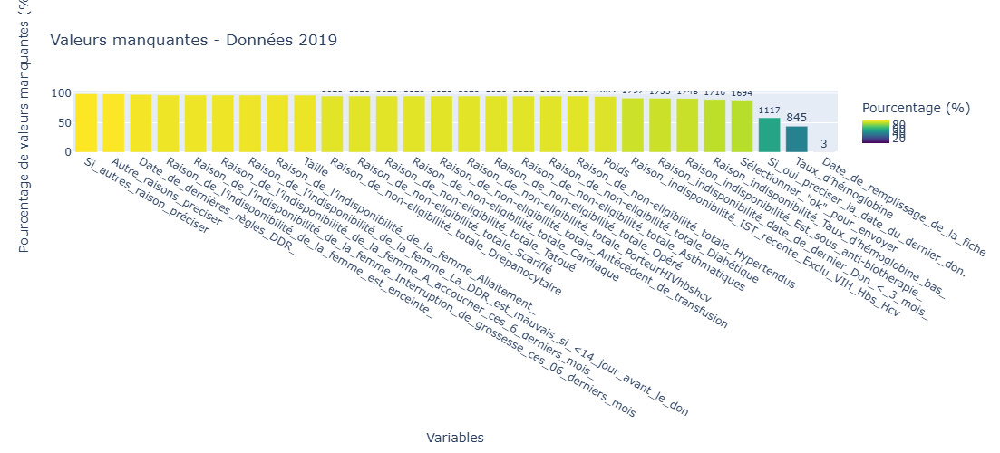

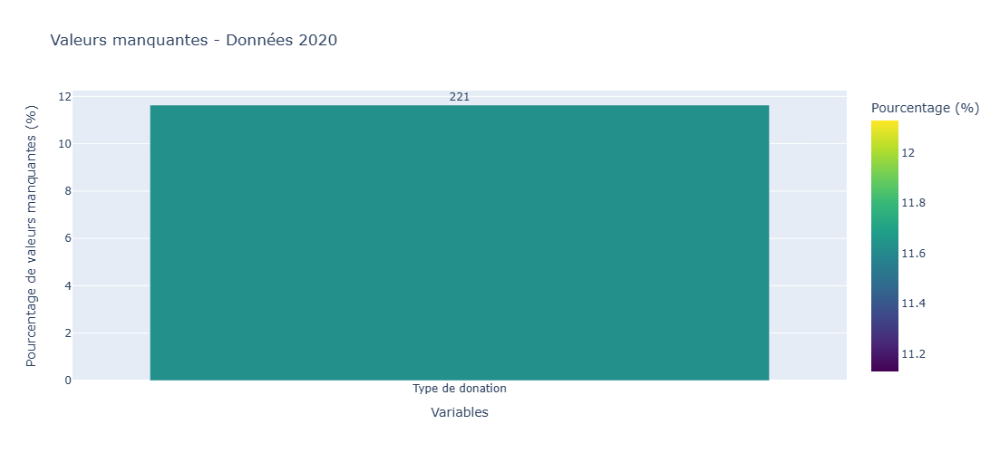

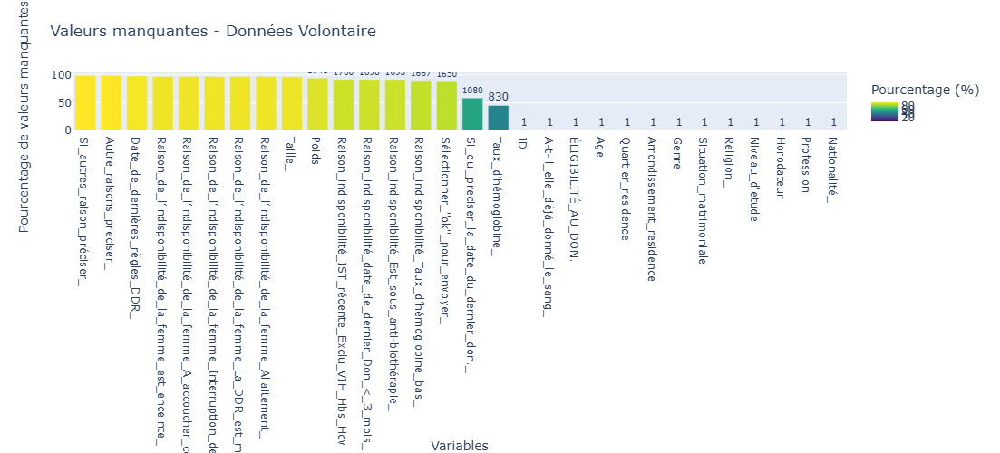

In [5]:
def visualize_missing_values(df, title):
    """
    Visualise les valeurs manquantes dans un DataFrame.
    """
    missing = df.isnull().sum().sort_values(ascending=False)
    missing = missing[missing > 0]
    missing_percent = (missing / len(df) * 100).round(2)
    missing_df = pd.DataFrame({'Nombre de valeurs manquantes': missing, 'Pourcentage (%)': missing_percent})
    
    if len(missing_df) > 0:
        fig = px.bar(missing_df, 
                     x=missing_df.index, 
                     y='Pourcentage (%)', 
                     title=f'Valeurs manquantes - {title}',
                     text='Nombre de valeurs manquantes',
                     color='Pourcentage (%)',
                     color_continuous_scale='Viridis')
        fig.update_layout(xaxis_title='Variables', 
                          yaxis_title='Pourcentage de valeurs manquantes (%)',
                          xaxis={'categoryorder':'total descending'},
                          height=500)
        fig.update_traces(texttemplate='%{text}', textposition='outside')
        fig.show()
    else:
        print(f"Aucune valeur manquante dans le jeu de données {title}")

print("Analyse des valeurs manquantes:")
visualize_missing_values(df_2019, "Données 2019")
visualize_missing_values(df_2020, "Données 2020")
visualize_missing_values(df_volontaire, "Données Volontaire")

## Analyse des distributions

Examinons la distribution des variables clés dans nos jeux de données.


### Analyse des distributions - Données 2019 ###

Variables numériques:

Taille:
  - Moyenne: 172.60
  - Médiane: 172.00
  - Écart-type: 7.02
  - Test de normalité (Shapiro-Wilk): p=0.7561 - Distribution normale

Poids:
  - Moyenne: 77.48
  - Médiane: 75.00
  - Écart-type: 12.47
  - Test de normalité (Shapiro-Wilk): p=0.0017 - Distribution non normale


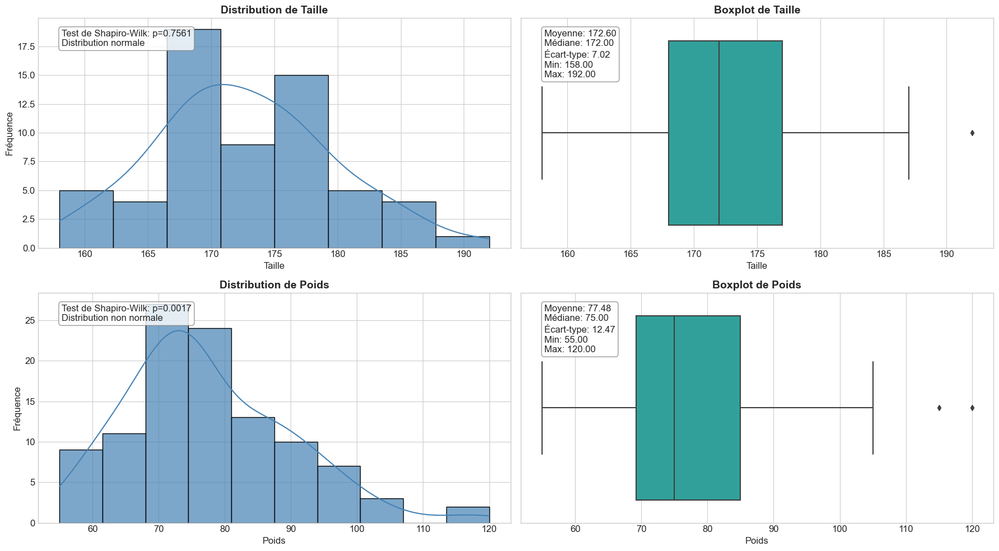

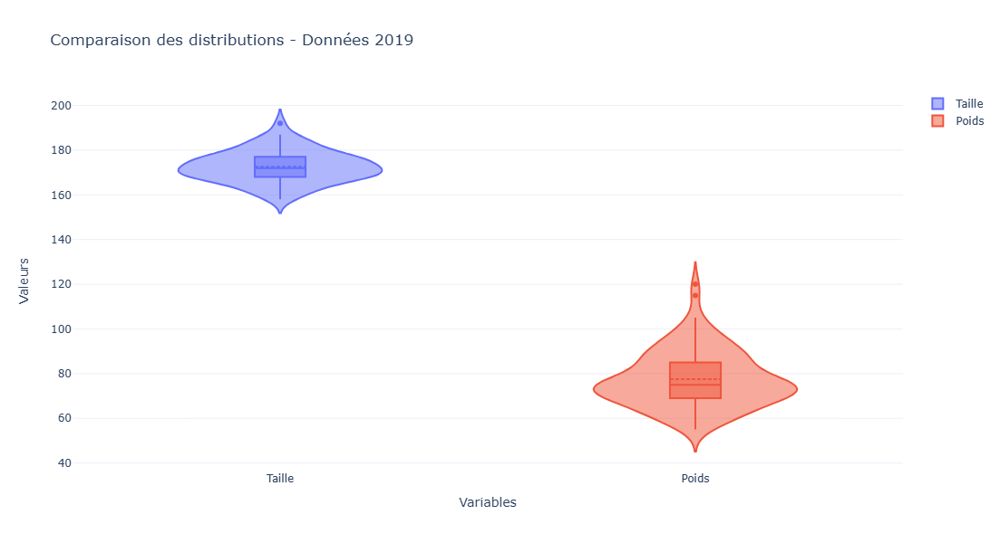


Variables catégorielles:


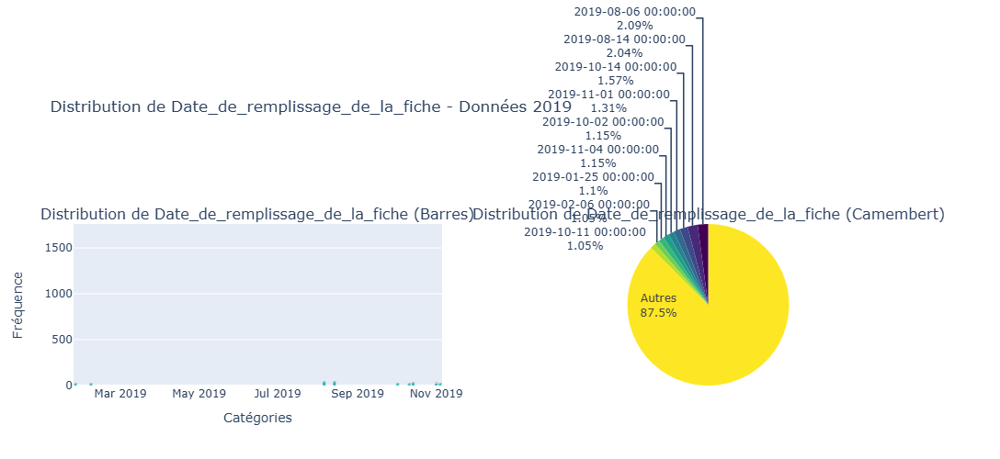


Date_de_remplissage_de_la_fiche:
  - 2019-08-06 00:00:00: 40 (2.1%)
  - 2019-08-14 00:00:00: 39 (2.0%)
  - 2019-10-14 00:00:00: 30 (1.6%)
  - 2019-11-01 00:00:00: 25 (1.3%)
  - 2019-10-02 00:00:00: 22 (1.2%)
  - 2019-11-04 00:00:00: 22 (1.2%)
  - 2019-01-25 00:00:00: 21 (1.1%)
  - 2019-02-06 00:00:00: 20 (1.0%)
  - 2019-10-11 00:00:00: 20 (1.0%)
  - Autres: 1673 (87.5%)


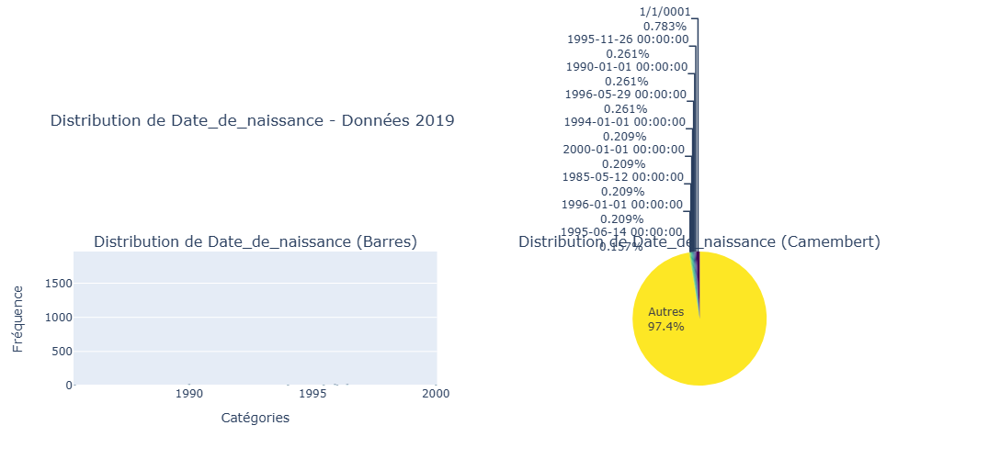


Date_de_naissance:
  - 1/1/0001: 15 (0.8%)
  - 1995-11-26 00:00:00: 5 (0.3%)
  - 1990-01-01 00:00:00: 5 (0.3%)
  - 1996-05-29 00:00:00: 5 (0.3%)
  - 1994-01-01 00:00:00: 4 (0.2%)
  - 2000-01-01 00:00:00: 4 (0.2%)
  - 1985-05-12 00:00:00: 4 (0.2%)
  - 1996-01-01 00:00:00: 4 (0.2%)
  - 1995-06-14 00:00:00: 3 (0.2%)
  - Autres: 1866 (97.4%)


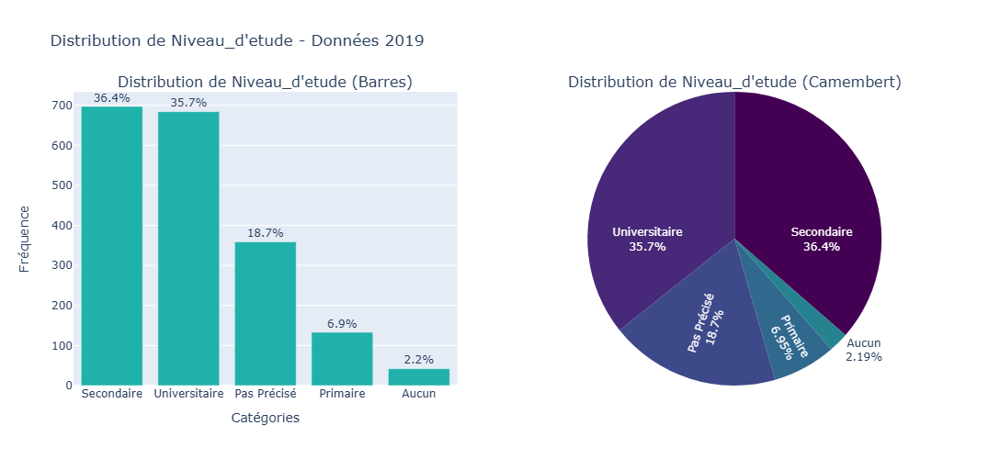


Niveau_d'etude:
  - Secondaire: 697 (36.4%)
  - Universitaire: 684 (35.7%)
  - Pas Précisé: 359 (18.7%)
  - Primaire: 133 (6.9%)
  - Aucun: 42 (2.2%)


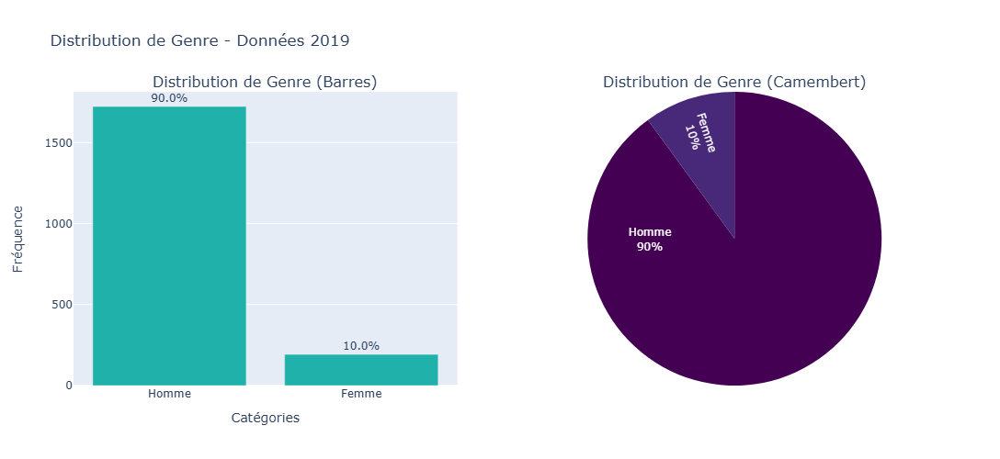


Genre:
  - Homme: 1723 (90.0%)
  - Femme: 192 (10.0%)


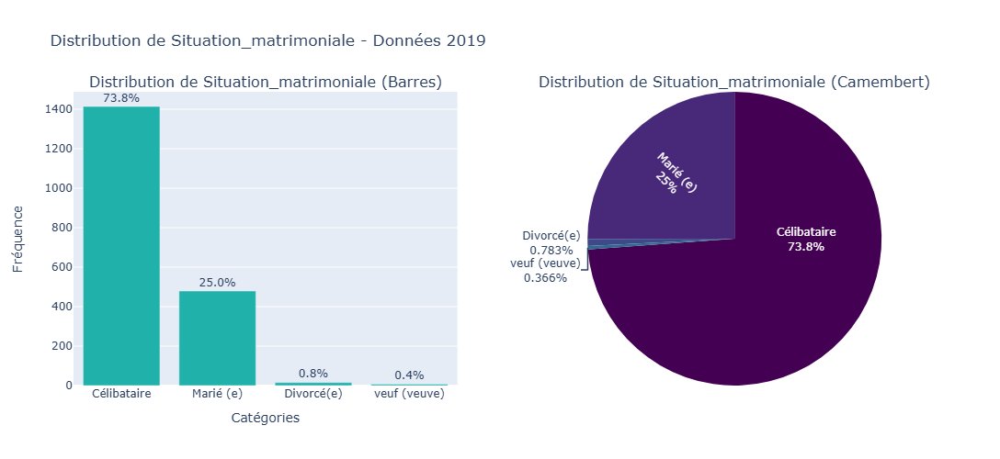


Situation_matrimoniale:
  - Célibataire: 1414 (73.8%)
  - Marié (e): 479 (25.0%)
  - Divorcé(e): 15 (0.8%)
  - veuf (veuve): 7 (0.4%)


In [6]:
def analyze_distributions(df, sheet_name):
    """
    Analyse la distribution des variables numériques et catégorielles avec des visualisations améliorées.
    """
    print(f"\n### Analyse des distributions - {sheet_name} ###")
    
    # Analyser les variables numériques
    numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns
    
    if len(numeric_columns) > 0:
        print("\nVariables numériques:")
        
        # Sélectionner jusqu'à 5 variables numériques pour l'analyse
        selected_numeric = list(numeric_columns)[:min(5, len(numeric_columns))]
        
        # Créer une figure avec plusieurs sous-graphiques pour les distributions
        fig, axes = plt.subplots(len(selected_numeric), 2, figsize=(18, 5*len(selected_numeric)))
        
        for i, col in enumerate(selected_numeric):
            # Histogramme avec KDE
            sns.histplot(df[col].dropna(), kde=True, ax=axes[i, 0], color='steelblue', alpha=0.7)
            axes[i, 0].set_title(f'Distribution de {col}', fontsize=14, fontweight='bold')
            axes[i, 0].set_xlabel(col, fontsize=12)
            axes[i, 0].set_ylabel('Fréquence', fontsize=12)
            
            # Boxplot
            sns.boxplot(x=df[col].dropna(), ax=axes[i, 1], color='lightseagreen')
            axes[i, 1].set_title(f'Boxplot de {col}', fontsize=14, fontweight='bold')
            axes[i, 1].set_xlabel(col, fontsize=12)
            
            # Test de normalité
            stat, p_value = stats.shapiro(df[col].dropna())
            normality = "normale" if p_value > 0.05 else "non normale"
            axes[i, 0].annotate(f'Test de Shapiro-Wilk: p={p_value:.4f}\nDistribution {normality}', 
                               xy=(0.05, 0.95), xycoords='axes fraction',
                               bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8),
                               ha='left', va='top')
            
            # Afficher les statistiques descriptives
            stats_desc = df[col].describe()
            stats_text = (f"Moyenne: {stats_desc['mean']:.2f}\n"
                         f"Médiane: {stats_desc['50%']:.2f}\n"
                         f"Écart-type: {stats_desc['std']:.2f}\n"
                         f"Min: {stats_desc['min']:.2f}\n"
                         f"Max: {stats_desc['max']:.2f}")
            axes[i, 1].annotate(stats_text, xy=(0.05, 0.95), xycoords='axes fraction',
                               bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8),
                               ha='left', va='top')
            
            print(f"\n{col}:")
            print(f"  - Moyenne: {stats_desc['mean']:.2f}")
            print(f"  - Médiane: {stats_desc['50%']:.2f}")
            print(f"  - Écart-type: {stats_desc['std']:.2f}")
            print(f"  - Test de normalité (Shapiro-Wilk): p={p_value:.4f} - Distribution {normality}")
        
        plt.tight_layout()
        plt.show()
        
        # Créer un graphique interactif pour comparer les distributions
        if len(selected_numeric) > 1:
            fig = go.Figure()
            for col in selected_numeric:
                fig.add_trace(go.Violin(y=df[col].dropna(), name=col, box_visible=True, meanline_visible=True))
            
            fig.update_layout(title=f'Comparaison des distributions - {sheet_name}',
                             xaxis_title='Variables',
                             yaxis_title='Valeurs',
                             height=600,
                             template='plotly_white')
            fig.show()
    
    # Analyser les variables catégorielles
    categorical_columns = df.select_dtypes(include=['object']).columns
    
    if len(categorical_columns) > 0:
        print("\nVariables catégorielles:")
        
        # Sélectionner jusqu'à 5 variables catégorielles pour l'analyse
        selected_categorical = list(categorical_columns)[:min(5, len(categorical_columns))]
        
        for col in selected_categorical:
            # Calculer les fréquences
            value_counts = df[col].value_counts()
            value_counts_pct = df[col].value_counts(normalize=True) * 100
            
            # Limiter à 10 catégories maximum pour la lisibilité
            if len(value_counts) > 10:
                # Garder les 9 plus fréquentes et regrouper les autres
                top_n = value_counts.nlargest(9)
                others = pd.Series({'Autres': value_counts.iloc[9:].sum()})
                value_counts = pd.concat([top_n, others])
                
                top_n_pct = value_counts_pct.nlargest(9)
                others_pct = pd.Series({'Autres': value_counts_pct.iloc[9:].sum()})
                value_counts_pct = pd.concat([top_n_pct, others_pct])
            
            # Créer un graphique interactif
            fig = make_subplots(rows=1, cols=2, specs=[[{"type": "bar"}, {"type": "pie"}]],
                               subplot_titles=[f'Distribution de {col} (Barres)', f'Distribution de {col} (Camembert)'])
            
            # Graphique à barres
            fig.add_trace(
                go.Bar(x=value_counts.index, y=value_counts.values, 
                      text=[f"{x:.1f}%" for x in value_counts_pct.values.round(1)],
                      textposition='outside',
                      marker_color='lightseagreen'),
                row=1, col=1
            )
            
            # Graphique en camembert
            fig.add_trace(
                go.Pie(labels=value_counts.index, values=value_counts.values,
                      textinfo='label+percent',
                      insidetextorientation='radial',
                      marker=dict(colors=px.colors.sequential.Viridis)),
                row=1, col=2
            )
            
            fig.update_layout(title=f'Distribution de {col} - {sheet_name}',
                             height=500,
                             showlegend=False)
            
            fig.update_xaxes(title_text="Catégories", row=1, col=1)
            fig.update_yaxes(title_text="Fréquence", row=1, col=1)
            
            fig.show()
            
            print(f"\n{col}:")
            for val, count in value_counts.items():
                print(f"  - {val}: {count} ({value_counts_pct[val]:.1f}%)")

# Analyser les distributions pour chaque jeu de données
analyze_distributions(df_2019, "Données 2019")



### Analyse des distributions - Données 2020 ###

Variables catégorielles:


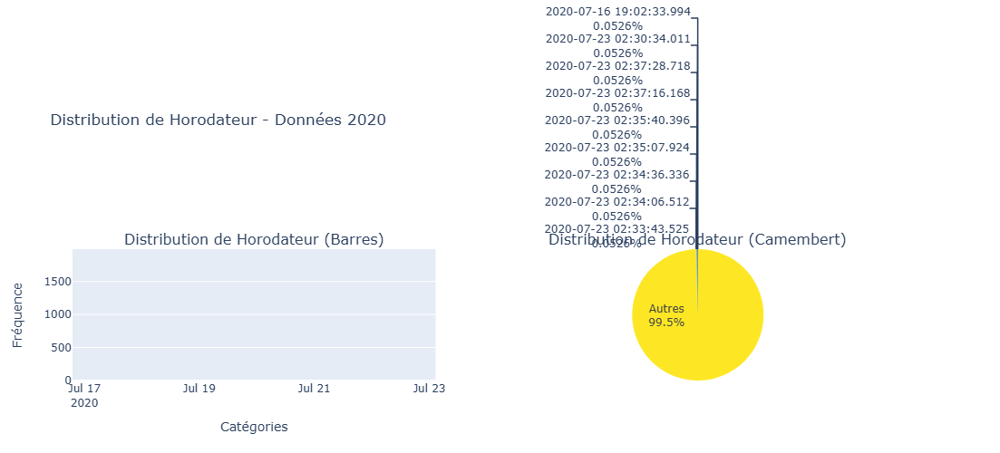


Horodateur:
  - 2020-07-16 19:02:33.994: 1 (0.1%)
  - 2020-07-23 02:30:34.011: 1 (0.1%)
  - 2020-07-23 02:37:28.718: 1 (0.1%)
  - 2020-07-23 02:37:16.168: 1 (0.1%)
  - 2020-07-23 02:35:40.396: 1 (0.1%)
  - 2020-07-23 02:35:07.924: 1 (0.1%)
  - 2020-07-23 02:34:36.336: 1 (0.1%)
  - 2020-07-23 02:34:06.512: 1 (0.1%)
  - 2020-07-23 02:33:43.525: 1 (0.1%)
  - Autres: 1891 (99.5%)


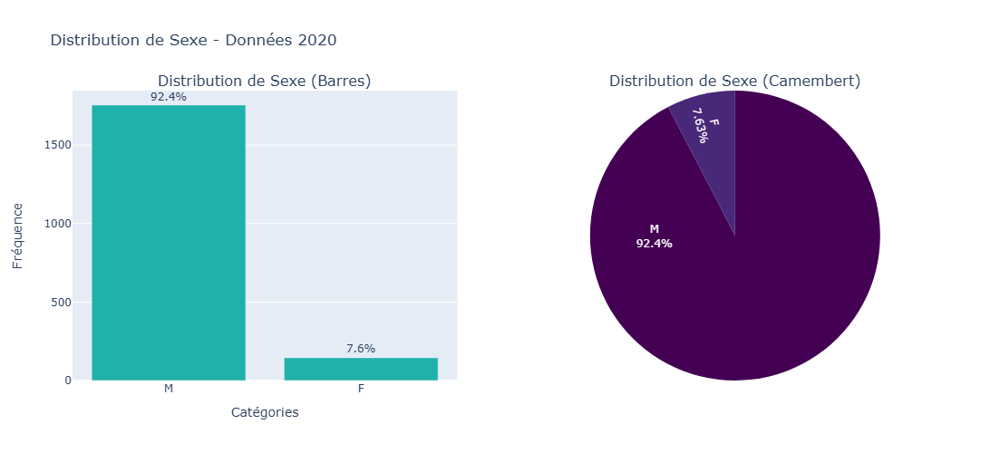


Sexe:
  - M: 1755 (92.4%)
  - F: 145 (7.6%)


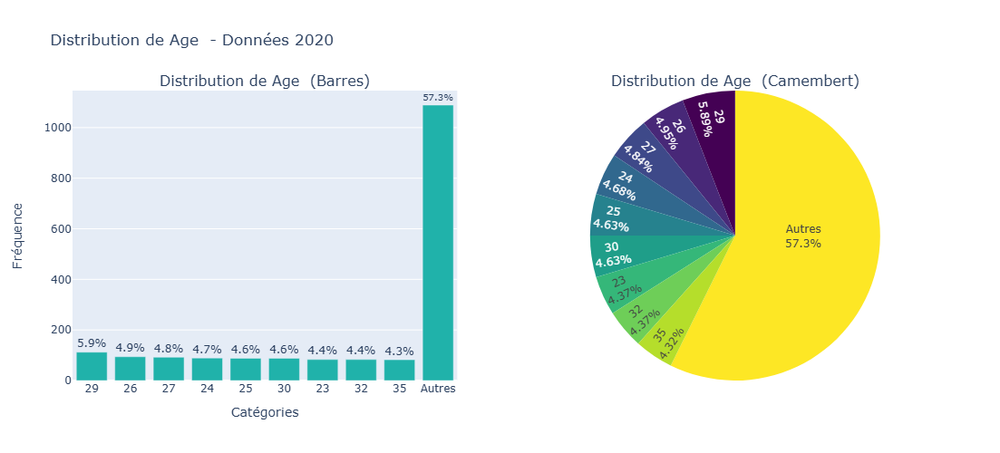


Age :
  - 29: 112 (5.9%)
  - 26: 94 (4.9%)
  - 27: 92 (4.8%)
  - 24: 89 (4.7%)
  - 25: 88 (4.6%)
  - 30: 88 (4.6%)
  - 23: 83 (4.4%)
  - 32: 83 (4.4%)
  - 35: 82 (4.3%)
  - Autres: 1089 (57.3%)


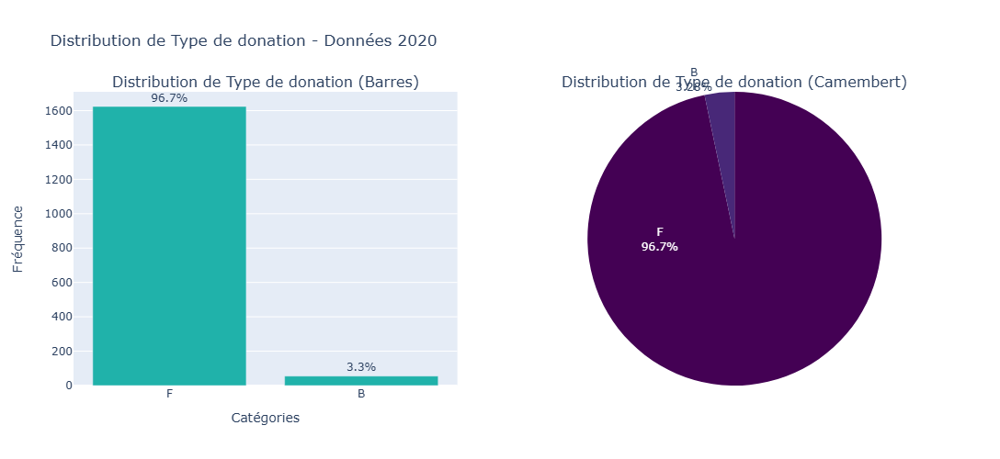


Type de donation:
  - F: 1624 (96.7%)
  - B: 55 (3.3%)


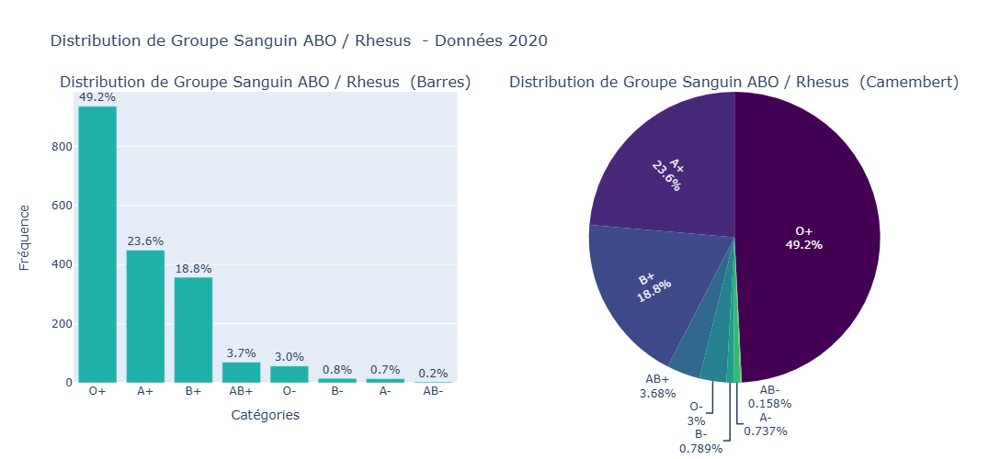


Groupe Sanguin ABO / Rhesus :
  - O+: 935 (49.2%)
  - A+: 449 (23.6%)
  - B+: 357 (18.8%)
  - AB+: 70 (3.7%)
  - O-: 57 (3.0%)
  - B-: 15 (0.8%)
  - A-: 14 (0.7%)
  - AB-: 3 (0.2%)


In [7]:
analyze_distributions(df_2020, "Données 2020")



### Analyse des distributions - Données Volontaire ###

Variables numériques:

Age:
  - Moyenne: 31.47
  - Médiane: 30.00
  - Écart-type: 8.88
  - Test de normalité (Shapiro-Wilk): p=0.0000 - Distribution non normale

Taille_:
  - Moyenne: 172.82
  - Médiane: 172.00
  - Écart-type: 6.95
  - Test de normalité (Shapiro-Wilk): p=0.7593 - Distribution normale

Poids:
  - Moyenne: 77.28
  - Médiane: 75.00
  - Écart-type: 12.49
  - Test de normalité (Shapiro-Wilk): p=0.0010 - Distribution non normale


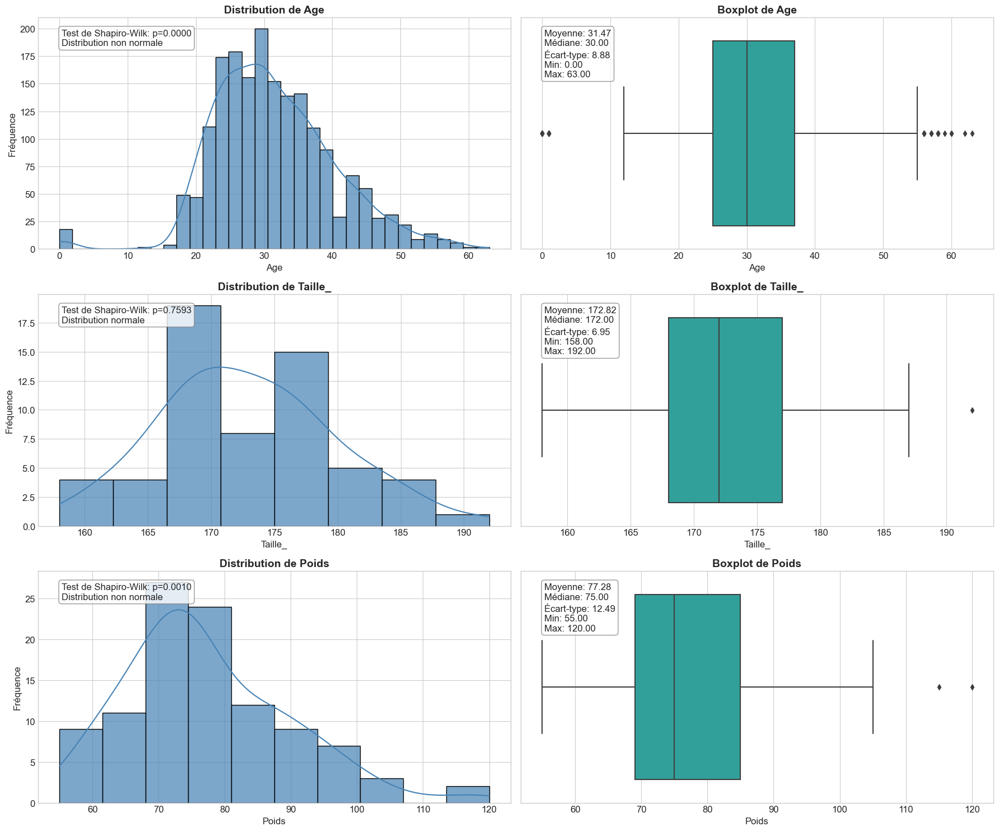

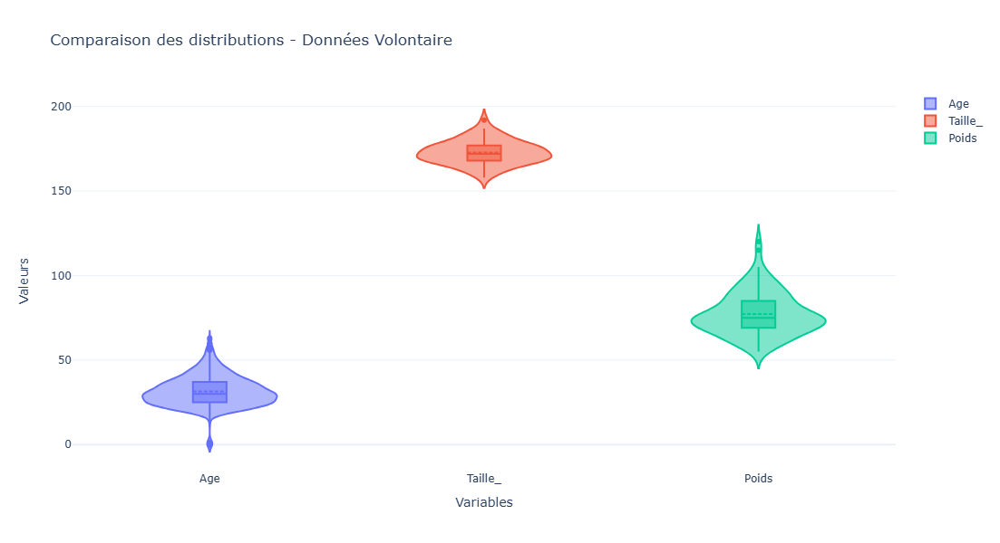


Variables catégorielles:


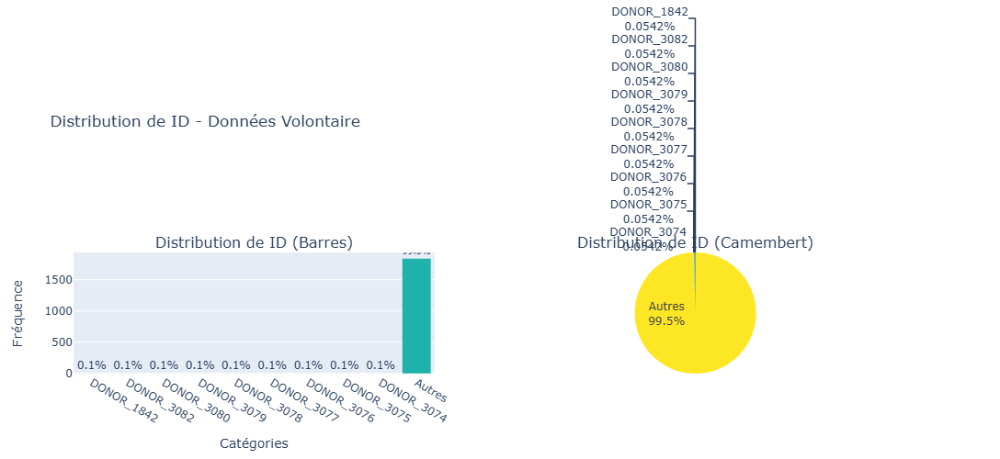


ID:
  - DONOR_1842: 1 (0.1%)
  - DONOR_3082: 1 (0.1%)
  - DONOR_3080: 1 (0.1%)
  - DONOR_3079: 1 (0.1%)
  - DONOR_3078: 1 (0.1%)
  - DONOR_3077: 1 (0.1%)
  - DONOR_3076: 1 (0.1%)
  - DONOR_3075: 1 (0.1%)
  - DONOR_3074: 1 (0.1%)
  - Autres: 1837 (99.5%)


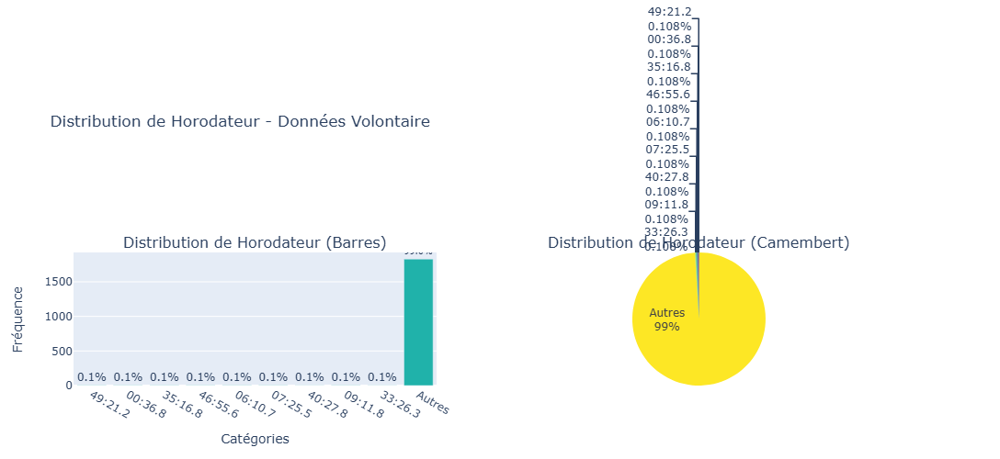


Horodateur:
  - 49:21.2: 2 (0.1%)
  - 00:36.8: 2 (0.1%)
  - 35:16.8: 2 (0.1%)
  - 46:55.6: 2 (0.1%)
  - 06:10.7: 2 (0.1%)
  - 07:25.5: 2 (0.1%)
  - 40:27.8: 2 (0.1%)
  - 09:11.8: 2 (0.1%)
  - 33:26.3: 2 (0.1%)
  - Autres: 1828 (99.0%)


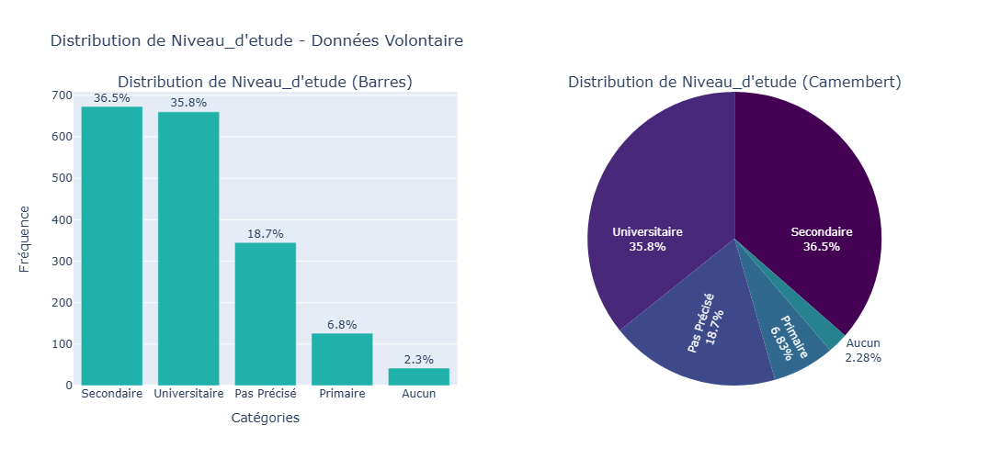


Niveau_d'etude:
  - Secondaire: 673 (36.5%)
  - Universitaire: 660 (35.8%)
  - Pas Précisé: 345 (18.7%)
  - Primaire: 126 (6.8%)
  - Aucun: 42 (2.3%)


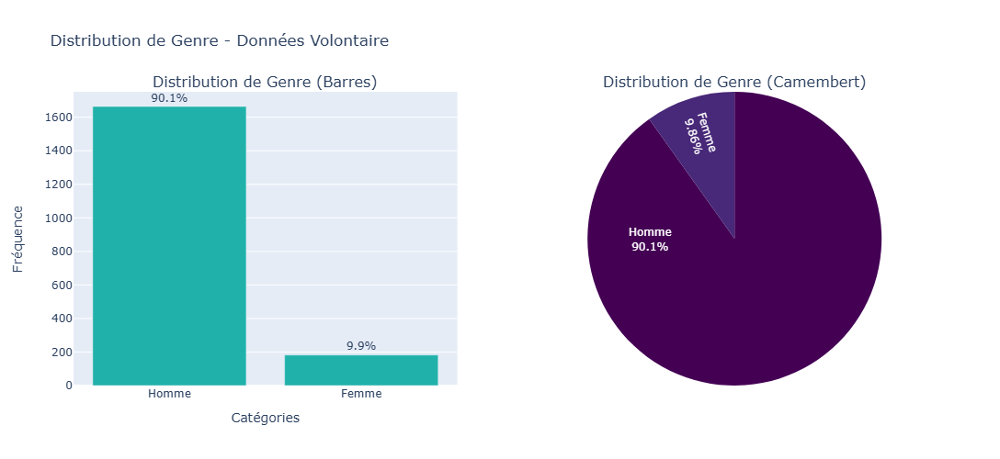


Genre:
  - Homme: 1664 (90.1%)
  - Femme: 182 (9.9%)


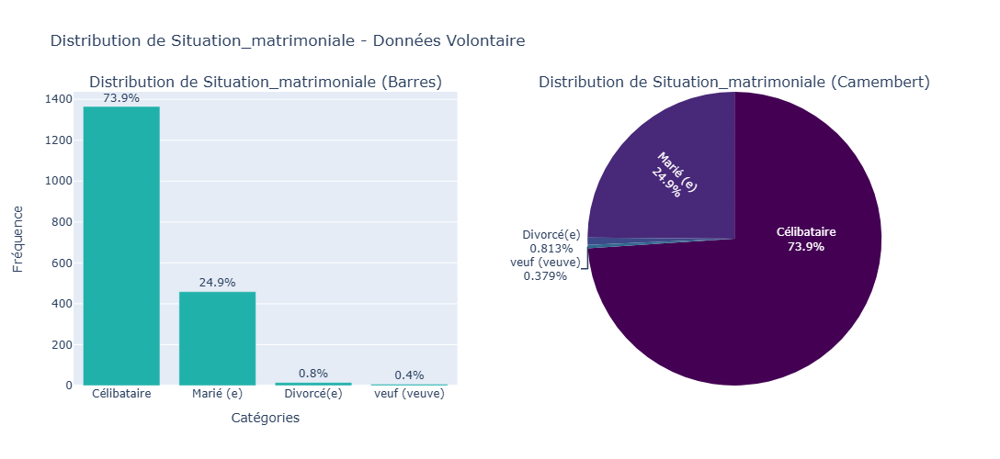


Situation_matrimoniale:
  - Célibataire: 1365 (73.9%)
  - Marié (e): 459 (24.9%)
  - Divorcé(e): 15 (0.8%)
  - veuf (veuve): 7 (0.4%)


In [8]:
analyze_distributions(df_volontaire, "Données Volontaire")

## Analyse des corrélations

Examinons les corrélations entre les variables numériques pour identifier des relations potentielles.


### Analyse des corrélations - Données 2019 ###


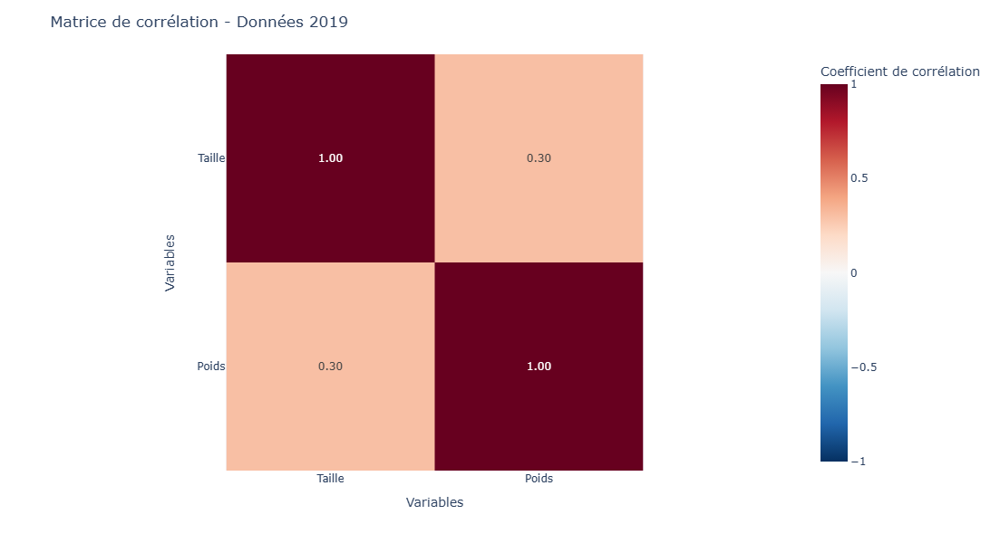

Aucune corrélation forte détectée (|r| > 0.5).


In [9]:
def analyze_correlations(df, sheet_name):
    """
    Analyse les corrélations entre les variables numériques avec des visualisations améliorées.
    """
    print(f"\n### Analyse des corrélations - {sheet_name} ###")
    
    # Sélectionner les variables numériques
    numeric_df = df.select_dtypes(include=['int64', 'float64'])
    
    if numeric_df.shape[1] > 1:
        # Calculer la matrice de corrélation
        corr_matrix = numeric_df.corr()
        
        # Créer une heatmap interactive
        fig = px.imshow(corr_matrix,
                       labels=dict(x="Variables", y="Variables", color="Coefficient de corrélation"),
                       x=corr_matrix.columns,
                       y=corr_matrix.columns,
                       color_continuous_scale='RdBu_r',
                       zmin=-1, zmax=1,
                       text_auto='.2f')
        
        fig.update_layout(title=f'Matrice de corrélation - {sheet_name}',
                         height=600,
                         width=800)
        
        fig.show()
        
        # Identifier les corrélations fortes (|r| > 0.5)
        strong_correlations = []
        for i in range(len(corr_matrix.columns)):
            for j in range(i+1, len(corr_matrix.columns)):
                if abs(corr_matrix.iloc[i, j]) > 0.5:
                    strong_correlations.append((corr_matrix.columns[i], corr_matrix.columns[j], corr_matrix.iloc[i, j]))
        
        if strong_correlations:
            print("\nCorrélations fortes (|r| > 0.5):")
            
            # Créer des graphiques pour chaque paire de variables fortement corrélées
            for var1, var2, corr in strong_correlations:
                print(f"  - {var1} et {var2}: r = {corr:.2f}")
                
                # Test de significativité de la corrélation
                valid_data = df[[var1, var2]].dropna()
                pearson_r, p_value = stats.pearsonr(valid_data[var1], valid_data[var2])
                significance = "significative" if p_value < 0.05 else "non significative"
                
                print(f"    Test de significativité: p={p_value:.4f} - Corrélation {significance}")
                
                # Créer un scatter plot interactif
                fig = px.scatter(valid_data, x=var1, y=var2, trendline="ols",
                                opacity=0.7,
                                color_discrete_sequence=['darkturquoise'],
                                title=f'Corrélation entre {var1} et {var2} (r = {corr:.2f}, p = {p_value:.4f})')
                
                fig.update_layout(height=500,
                                 xaxis_title=var1,
                                 yaxis_title=var2,
                                 template='plotly_white')
                
                # Ajouter une annotation pour la corrélation
                fig.add_annotation(x=0.05, y=0.95,
                                  xref="paper", yref="paper",
                                  text=f"Corrélation: {corr:.2f}<br>p-value: {p_value:.4f}<br>Corrélation {significance}",
                                  showarrow=False,
                                  font=dict(size=12),
                                  bgcolor="white",
                                  bordercolor="black",
                                  borderwidth=1,
                                  borderpad=4,
                                  align="left")
                
                fig.show()
        else:
            print("Aucune corrélation forte détectée (|r| > 0.5).")
    else:
        print("Pas assez de variables numériques pour analyser les corrélations.")

# Analyser les corrélations pour chaque jeu de données
analyze_correlations(df_2019, "Données 2019")


In [10]:
analyze_correlations(df_2020, "Données 2020")



### Analyse des corrélations - Données 2020 ###
Pas assez de variables numériques pour analyser les corrélations.



### Analyse des corrélations - Données Volontaire ###


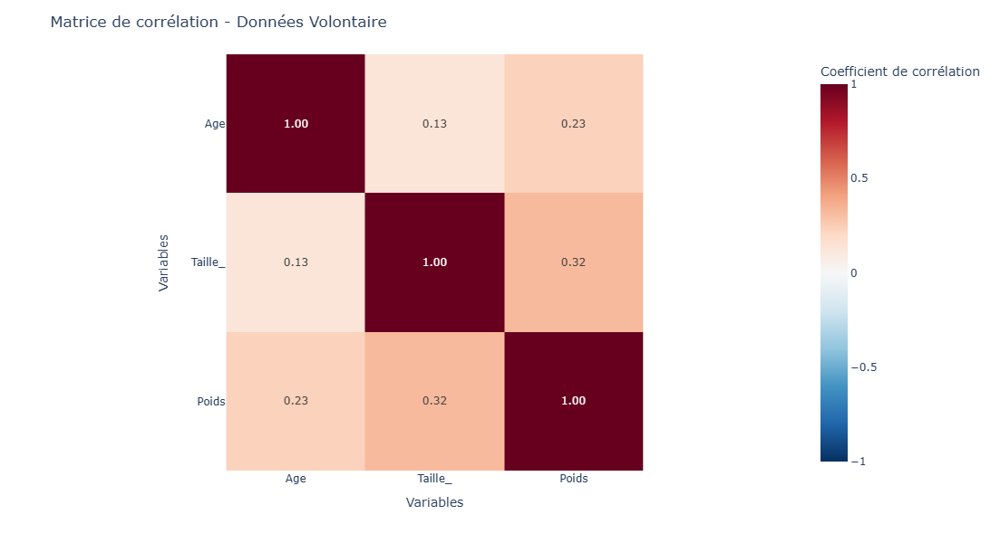

Aucune corrélation forte détectée (|r| > 0.5).


In [11]:
analyze_correlations(df_volontaire, "Données Volontaire")

## Analyse des relations entre variables catégorielles

Examinons les relations entre les variables catégorielles pour identifier des associations potentielles.


### Analyse des relations entre variables catégorielles - Données 2019 ###

Analyse des facteurs influençant ÉLIGIBILITÉ_AU_DON.:

Relation entre ÉLIGIBILITÉ_AU_DON. et Niveau_d'etude:
Test du chi2: chi2=6.15, p=0.6301, degrés de liberté=8
Association non significative (seuil α=0.05)


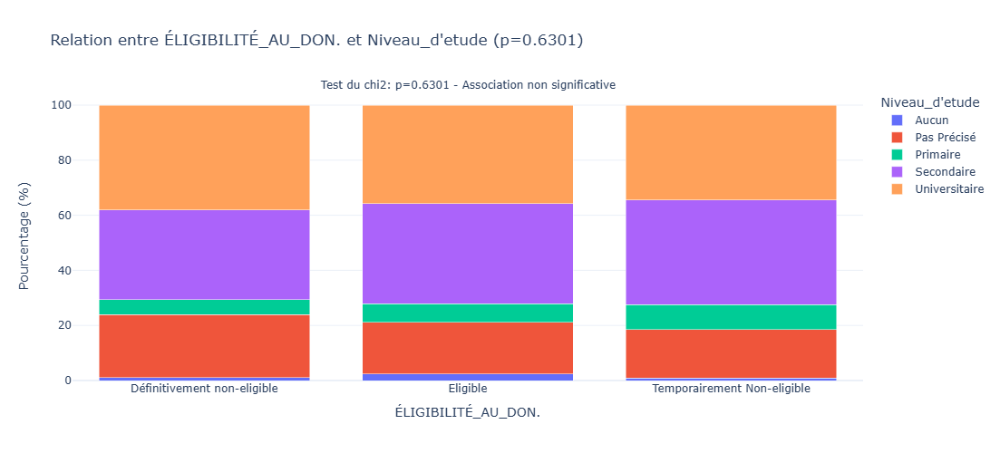

<Figure size 1200x800 with 0 Axes>

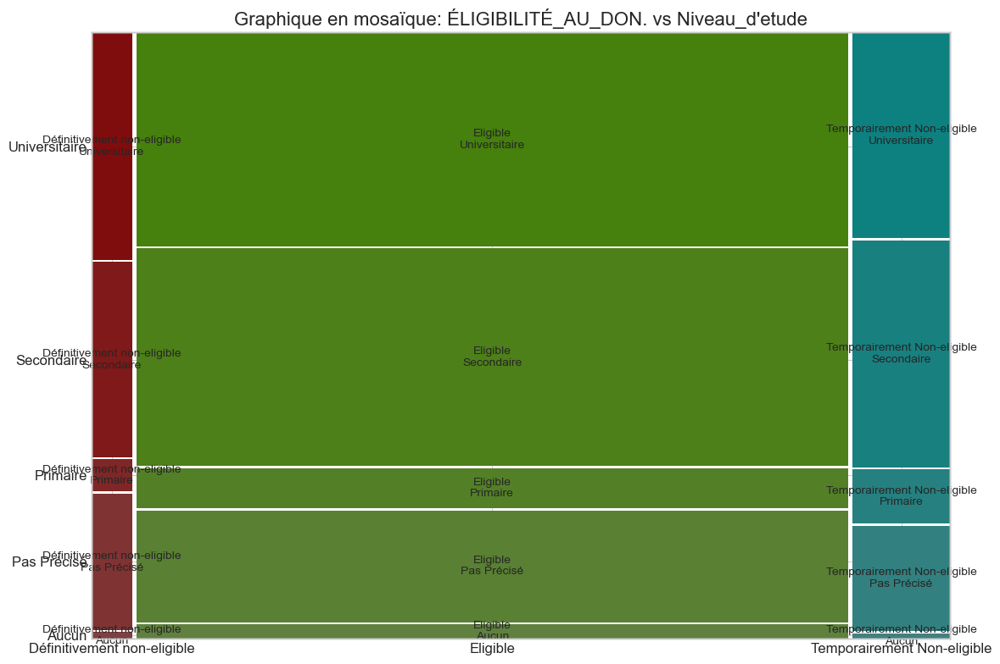


Relation entre ÉLIGIBILITÉ_AU_DON. et Genre:
Test du chi2: chi2=131.02, p=0.0000, degrés de liberté=2
Association significative (seuil α=0.05)


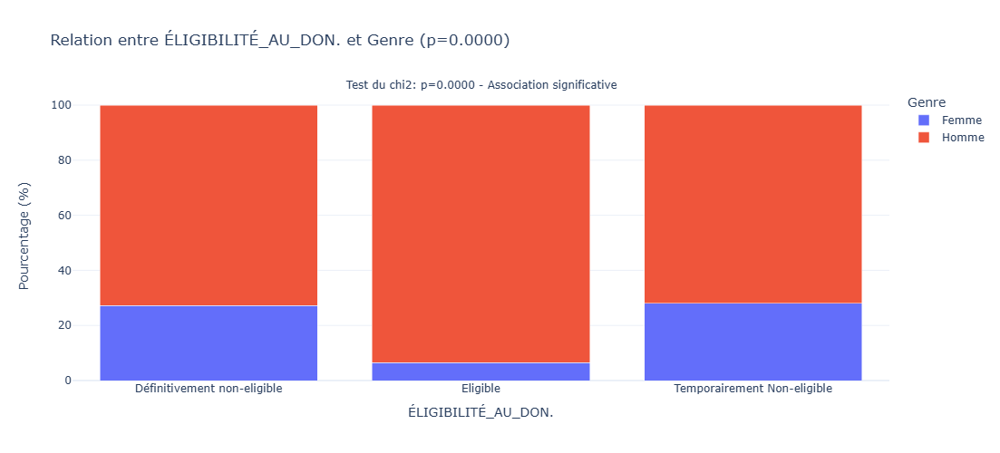

<Figure size 1200x800 with 0 Axes>

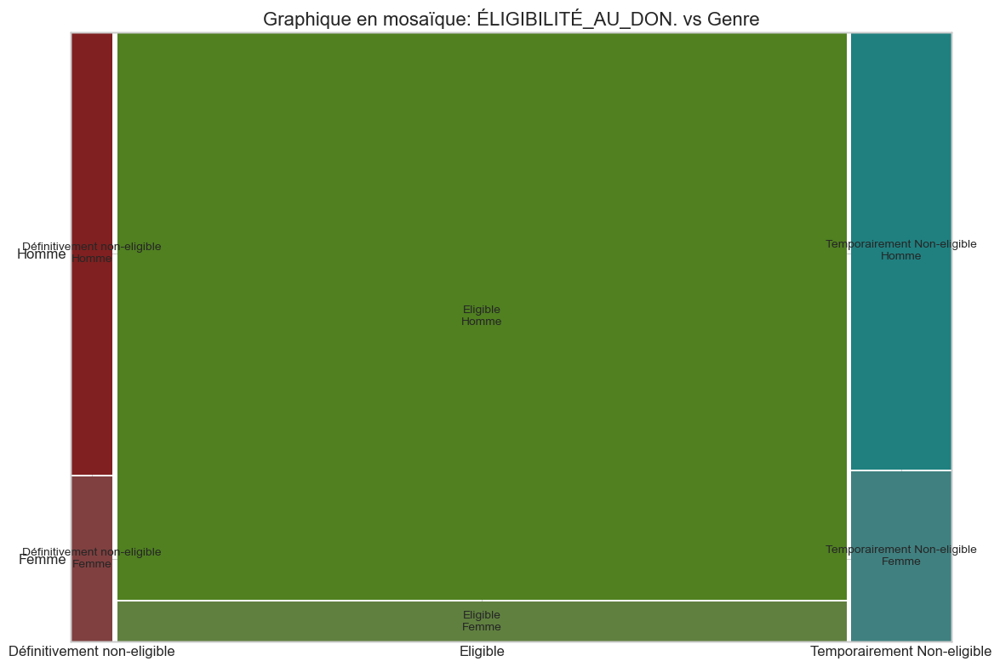


Relation entre ÉLIGIBILITÉ_AU_DON. et Situation_matrimoniale:
Test du chi2: chi2=11.73, p=0.0683, degrés de liberté=6
Association non significative (seuil α=0.05)


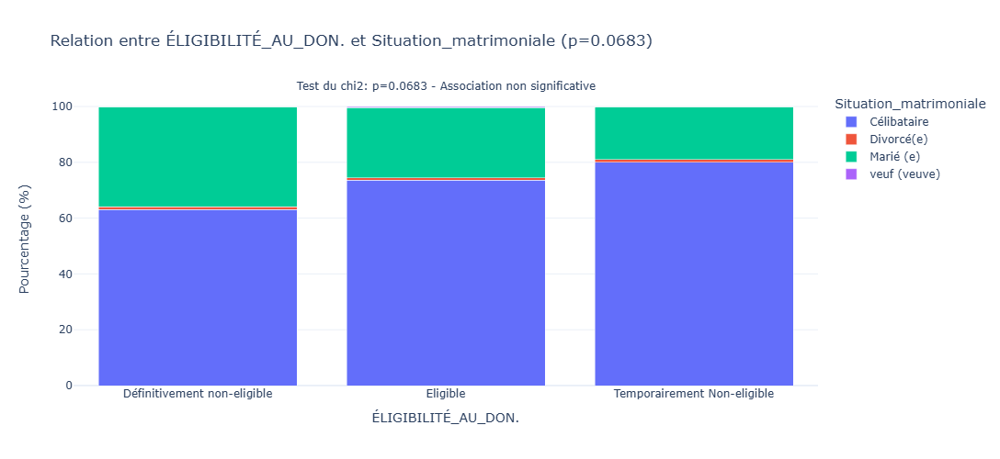

<Figure size 1200x800 with 0 Axes>

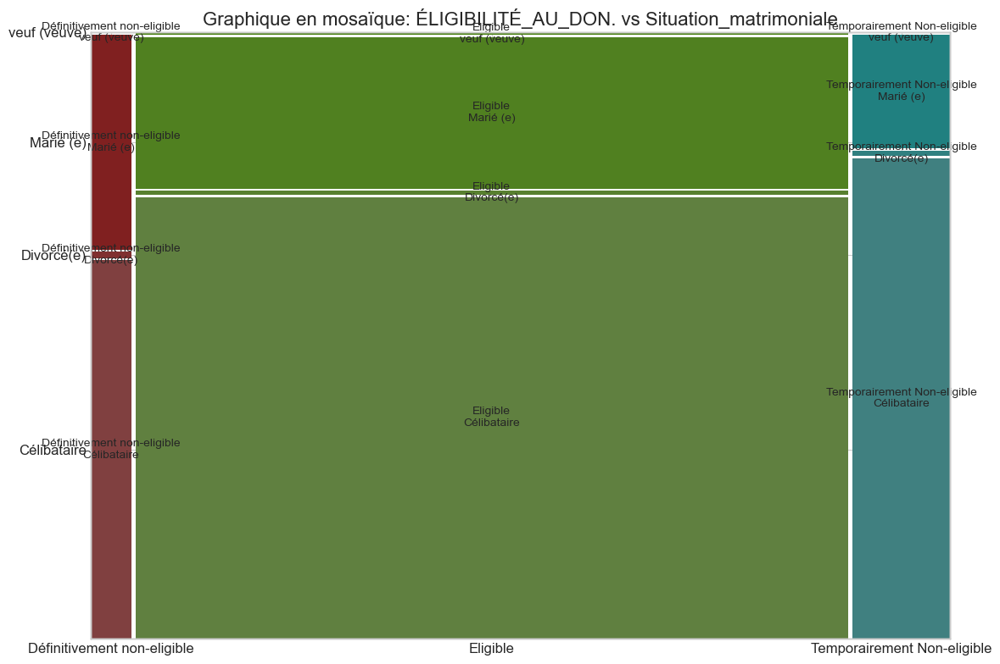


Relation entre ÉLIGIBILITÉ_AU_DON. et A-t-il_elle_déjà_donné_le_sang:
Test du chi2: chi2=24.71, p=0.0000, degrés de liberté=2
Association significative (seuil α=0.05)


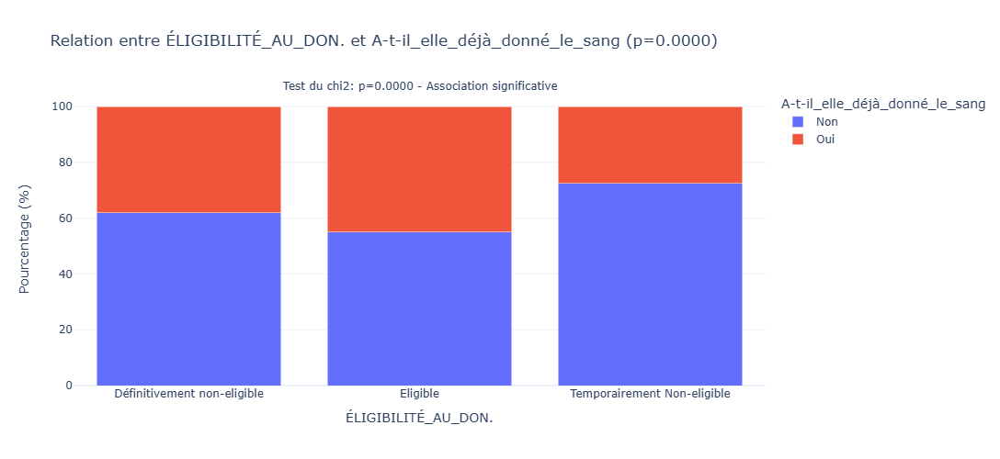

<Figure size 1200x800 with 0 Axes>

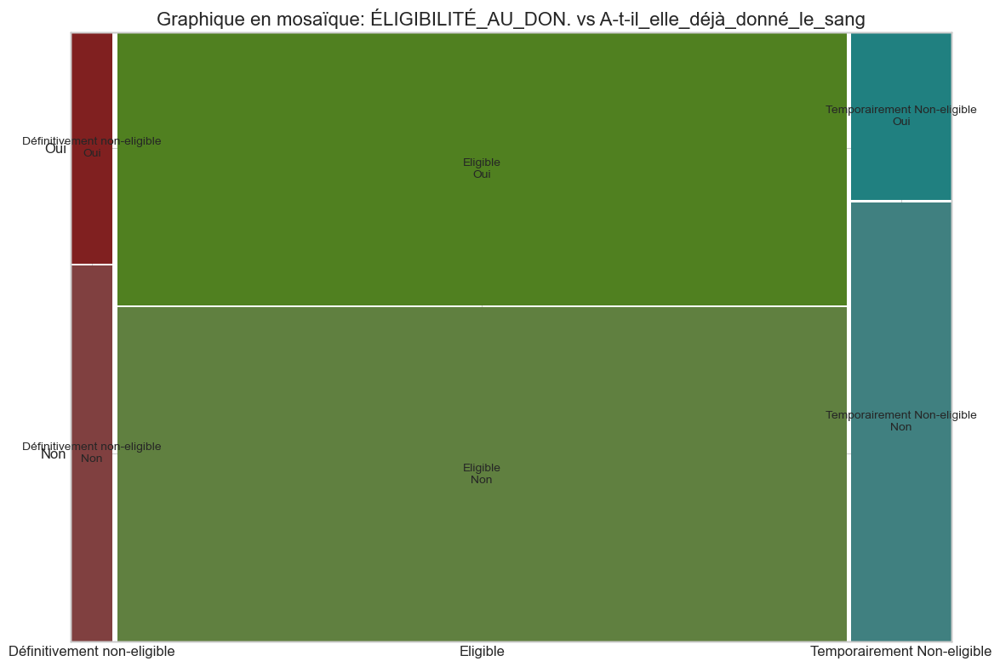


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_indisponibilité_Est_sous_anti-biothérapie_:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


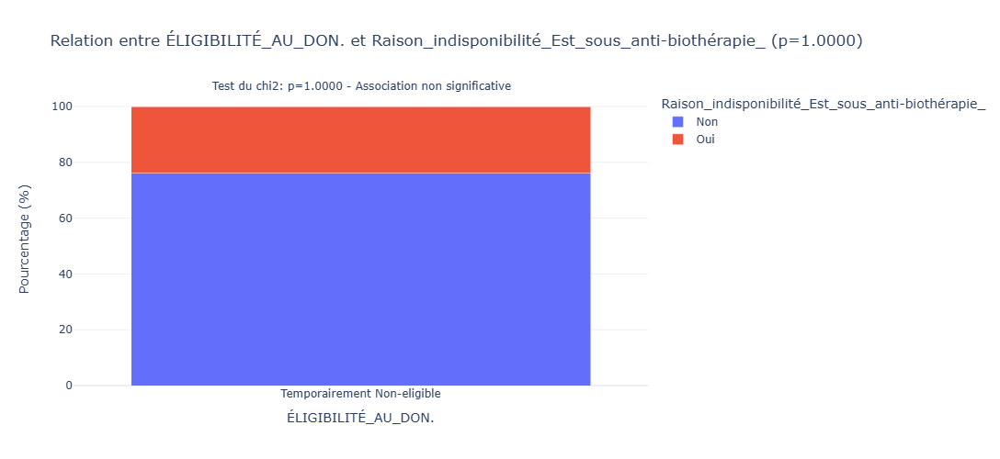

<Figure size 1200x800 with 0 Axes>

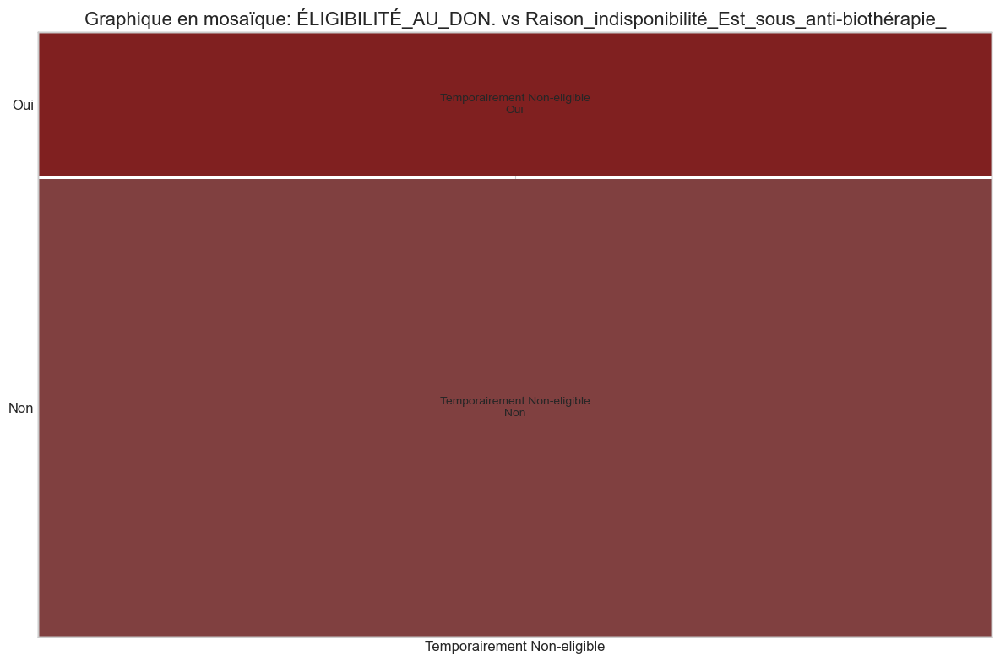


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_indisponibilité_Taux_d’hémoglobine_bas_:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


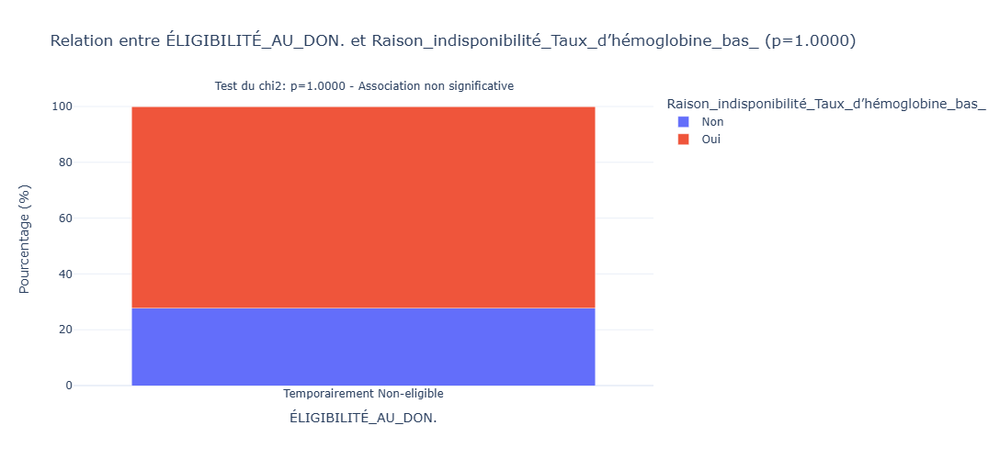

<Figure size 1200x800 with 0 Axes>

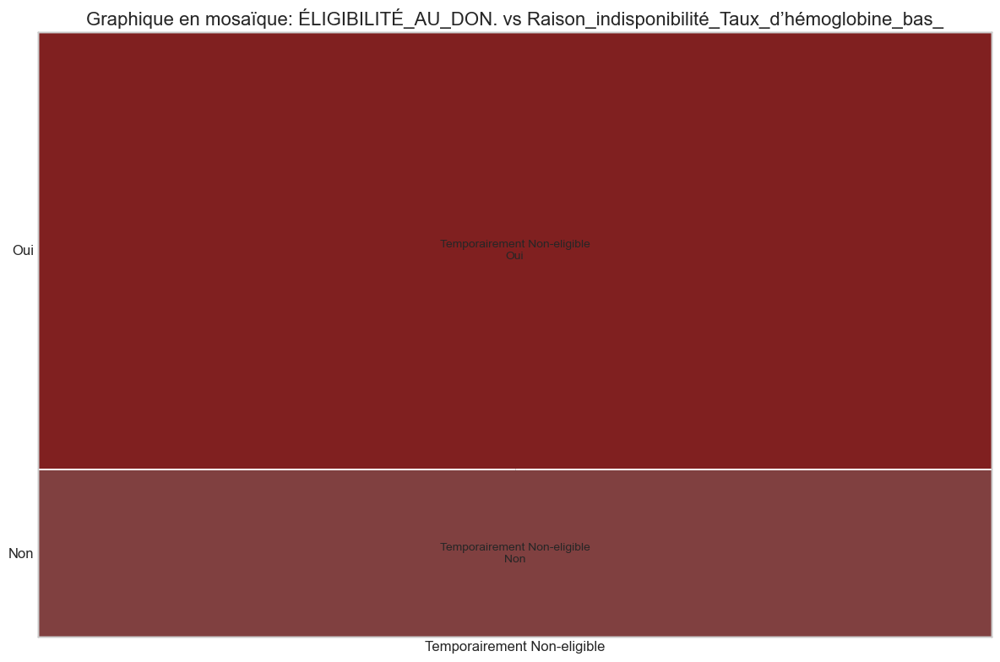


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_indisponibilité_date_de_dernier_Don_<_3_mois_:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


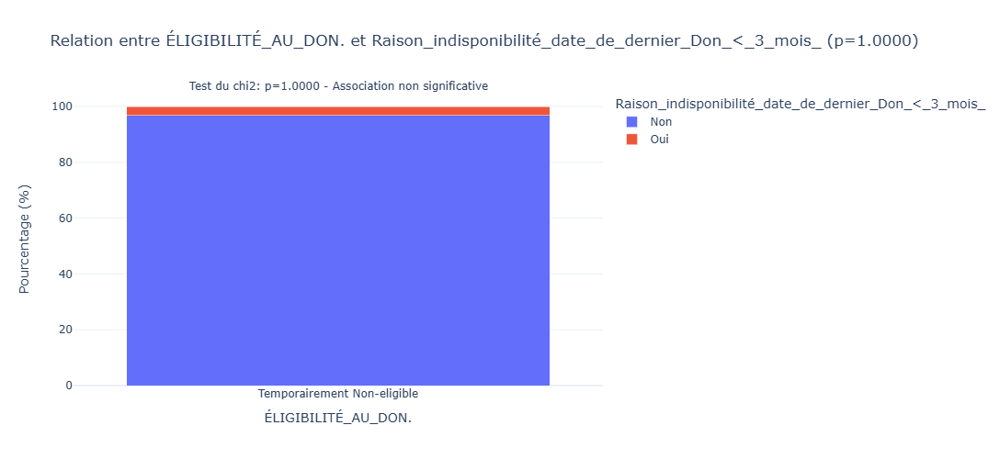

<Figure size 1200x800 with 0 Axes>

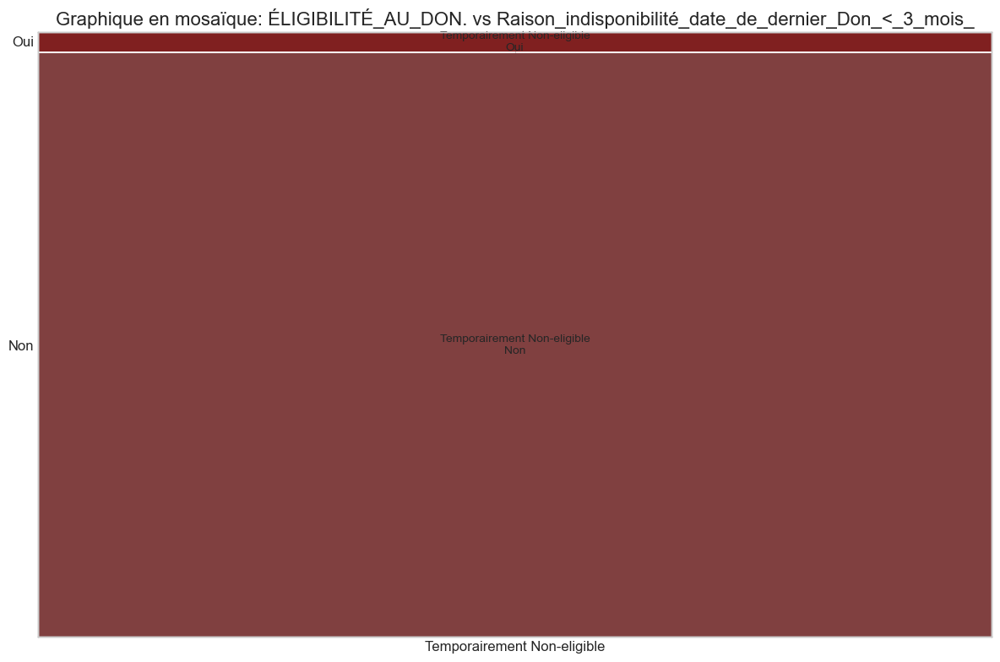


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_indisponibilité_IST_récente_Exclu_VIH_Hbs_Hcv:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


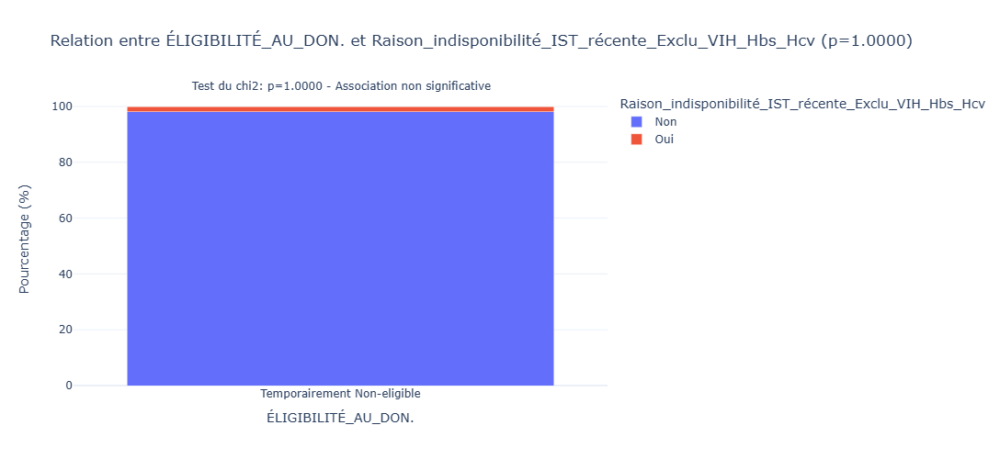

<Figure size 1200x800 with 0 Axes>

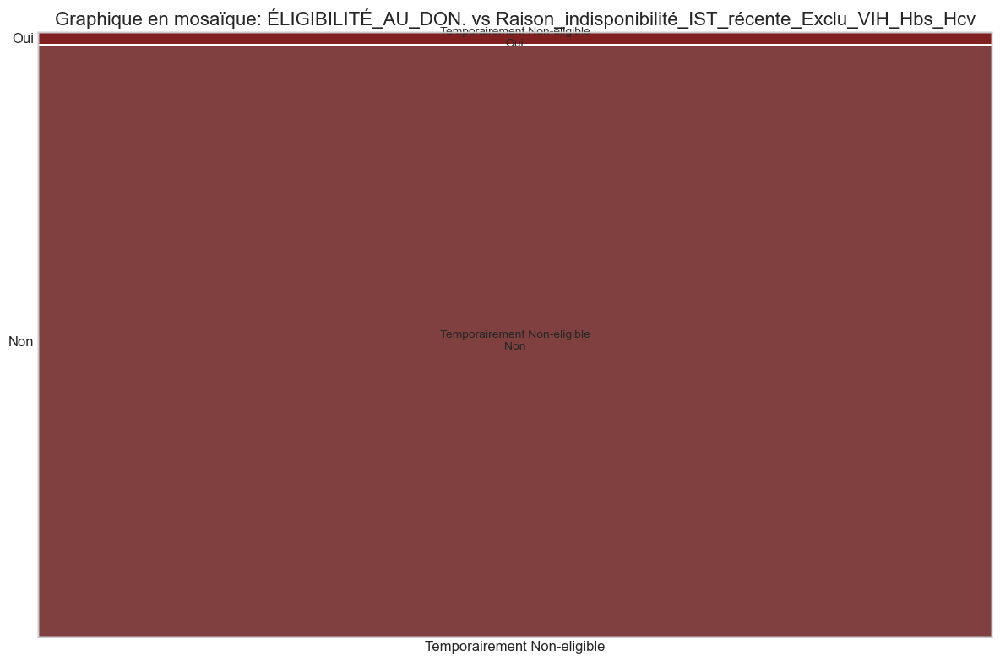


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_l’indisponibilité_de_la_femme_La_DDR_est_mauvais_si_<14_jour_avant_le_don:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


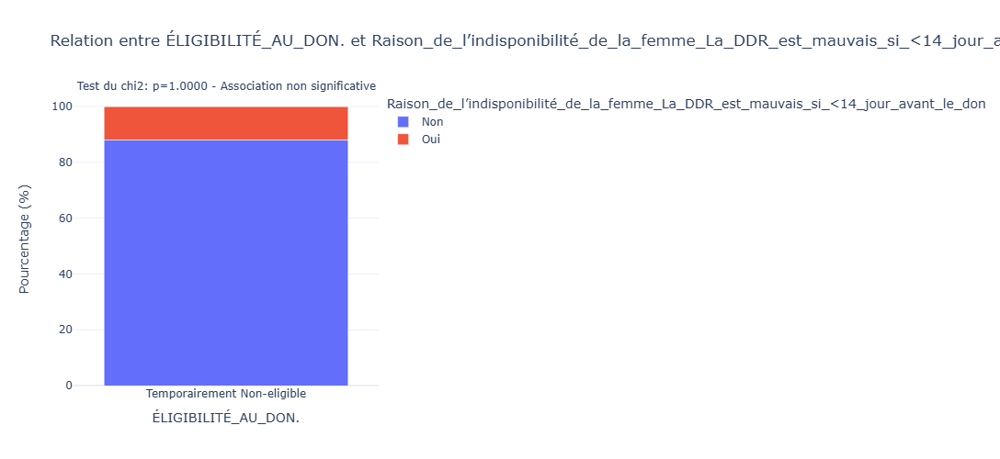

<Figure size 1200x800 with 0 Axes>

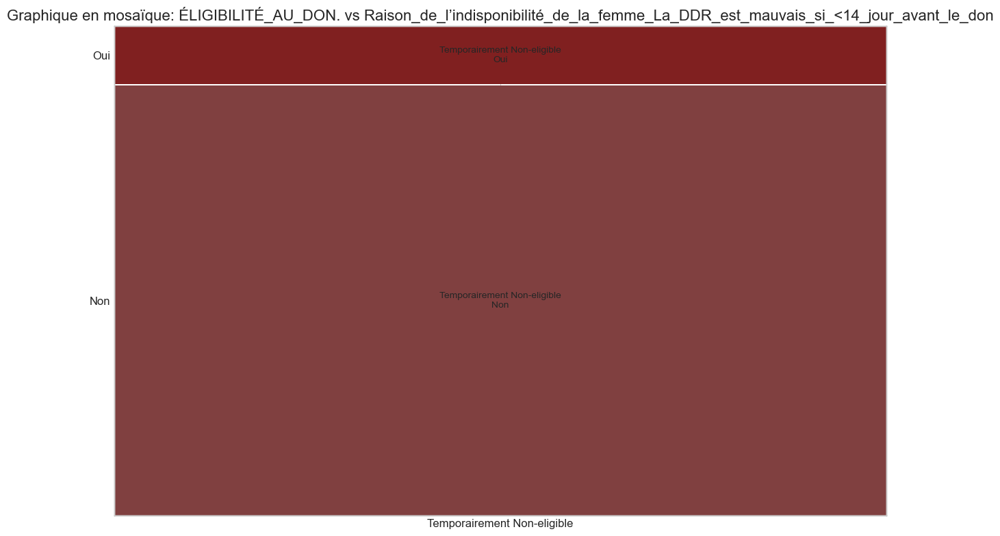


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Antécédent_de_transfusion:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


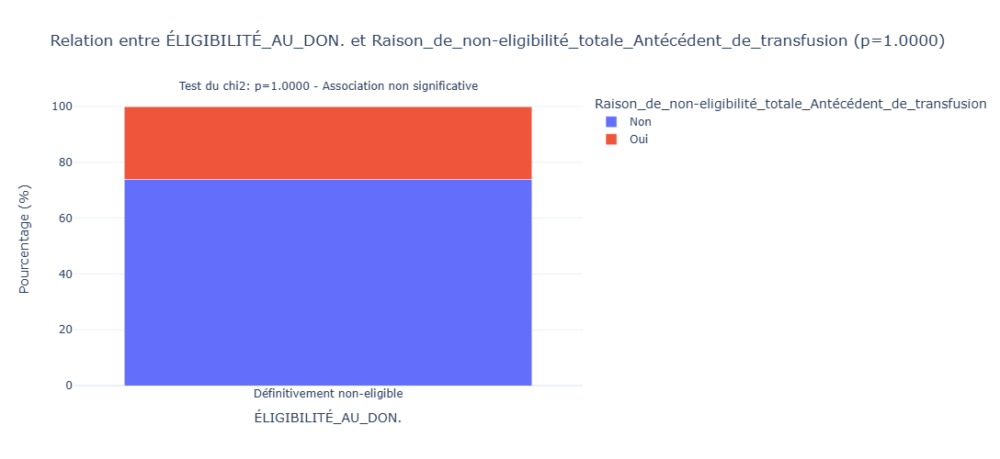

<Figure size 1200x800 with 0 Axes>

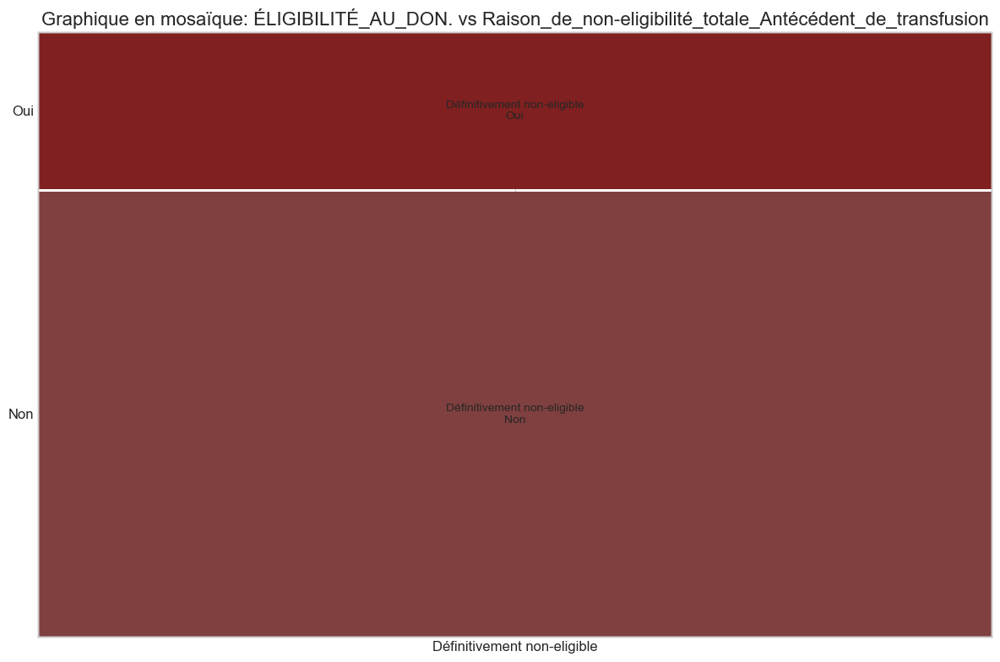


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_PorteurHIVhbshcv:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


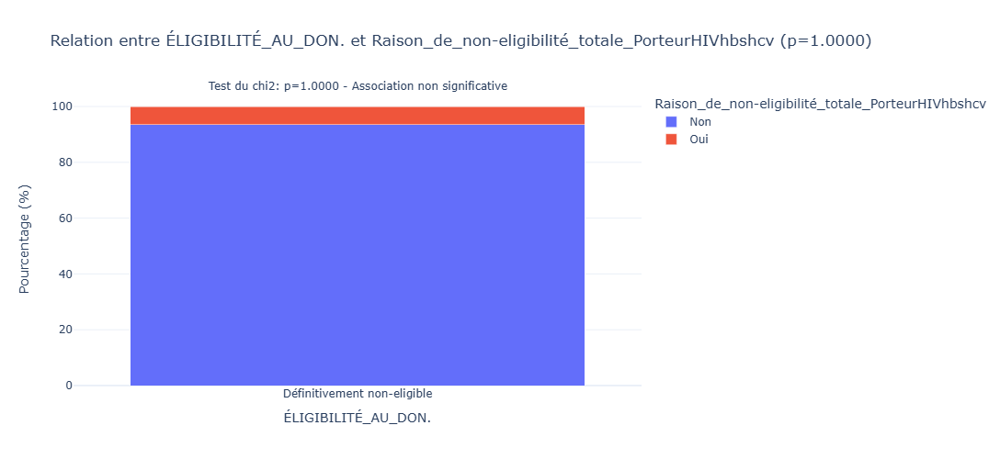

<Figure size 1200x800 with 0 Axes>

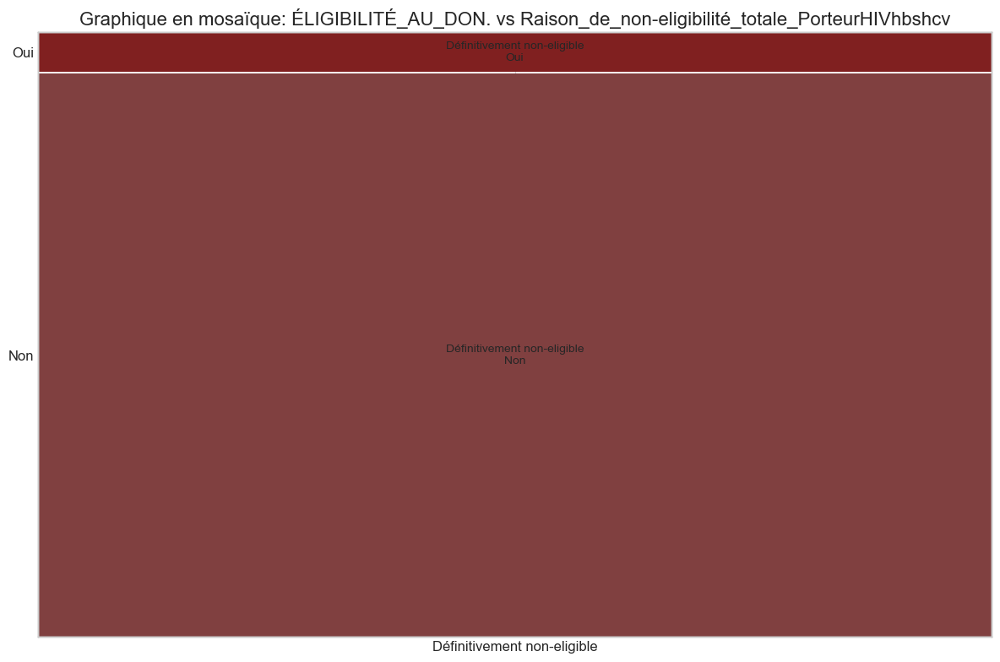


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Opéré:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


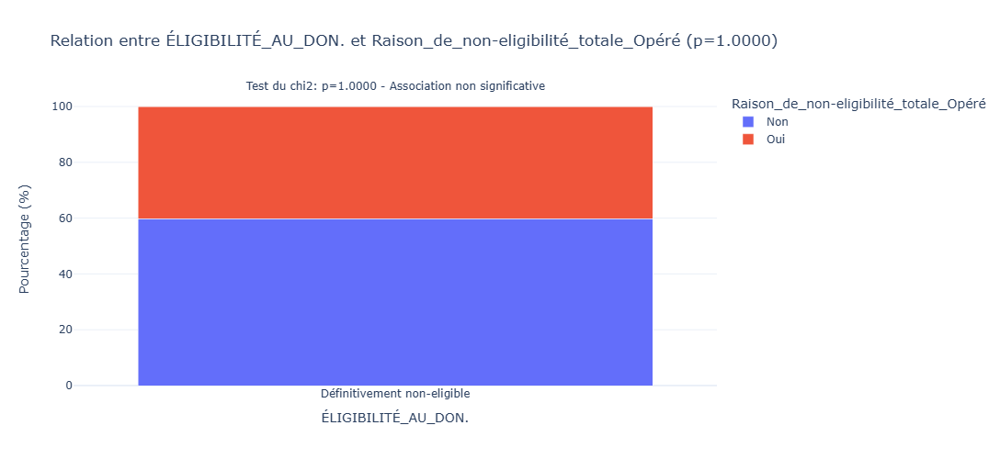

<Figure size 1200x800 with 0 Axes>

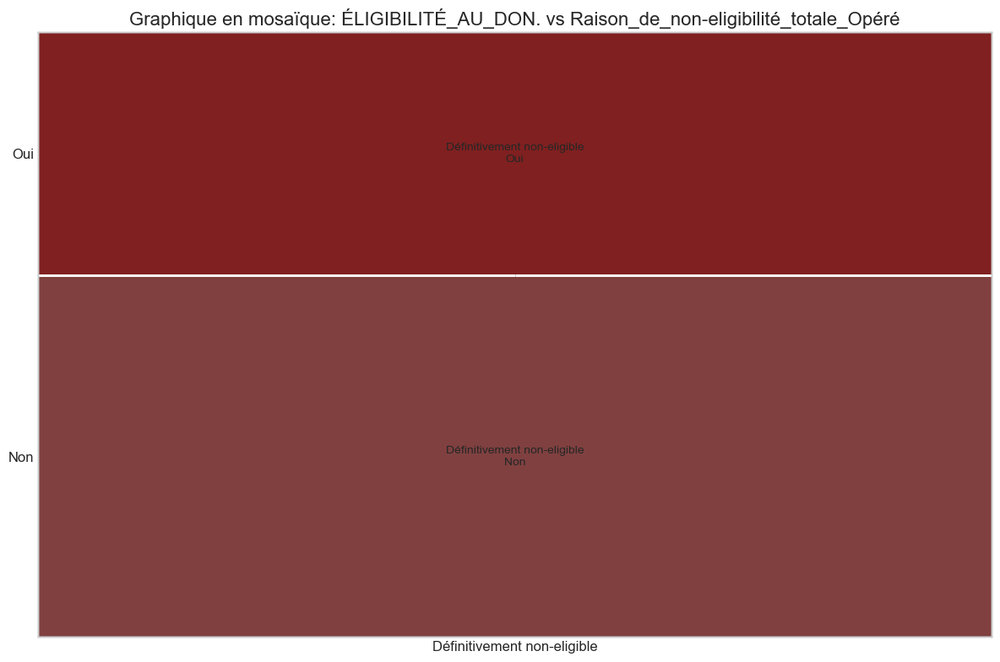


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Drepanocytaire:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


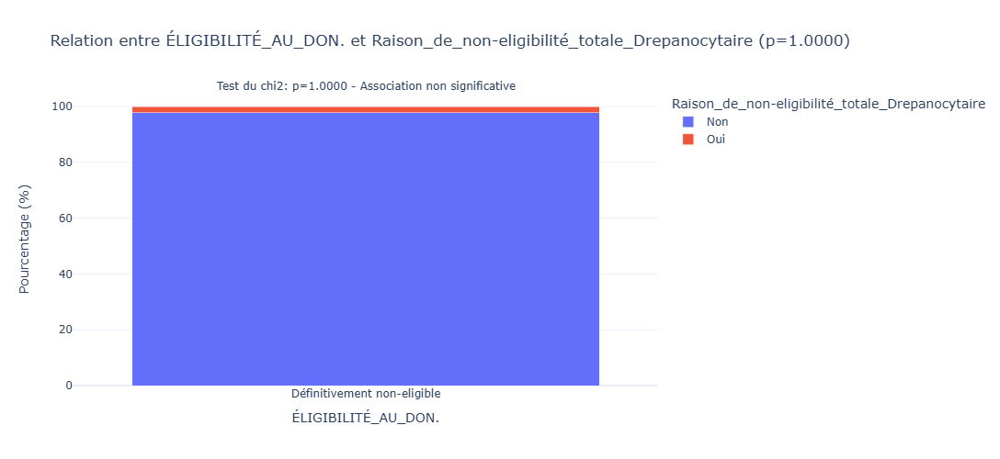

<Figure size 1200x800 with 0 Axes>

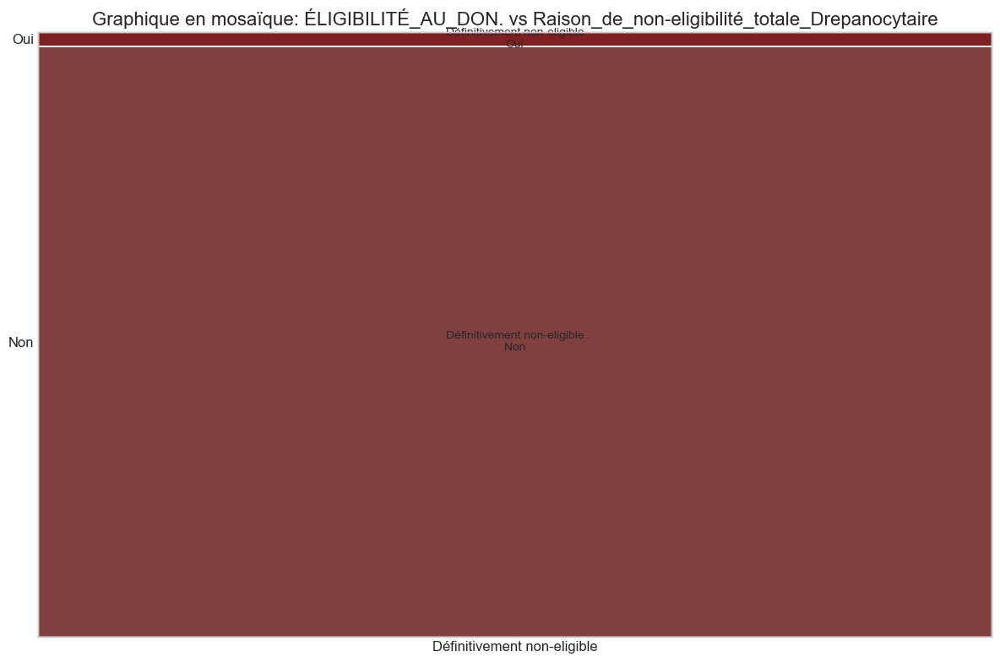


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Diabétique:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


<Figure size 1200x800 with 0 Axes>

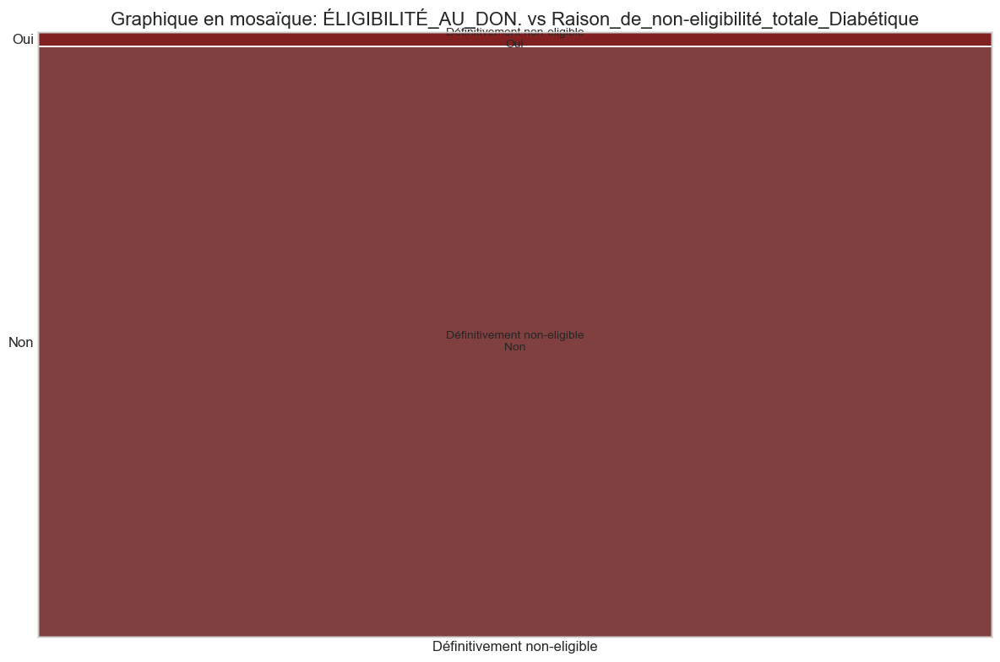


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Hypertendus:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


<Figure size 1200x800 with 0 Axes>

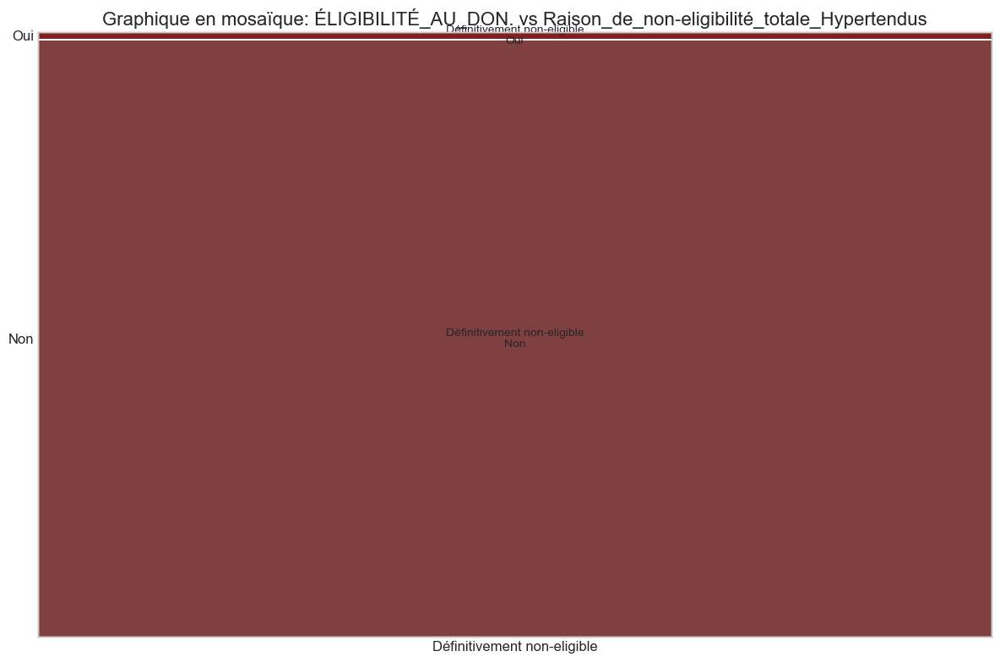


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Asthmatiques:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


<Figure size 1200x800 with 0 Axes>

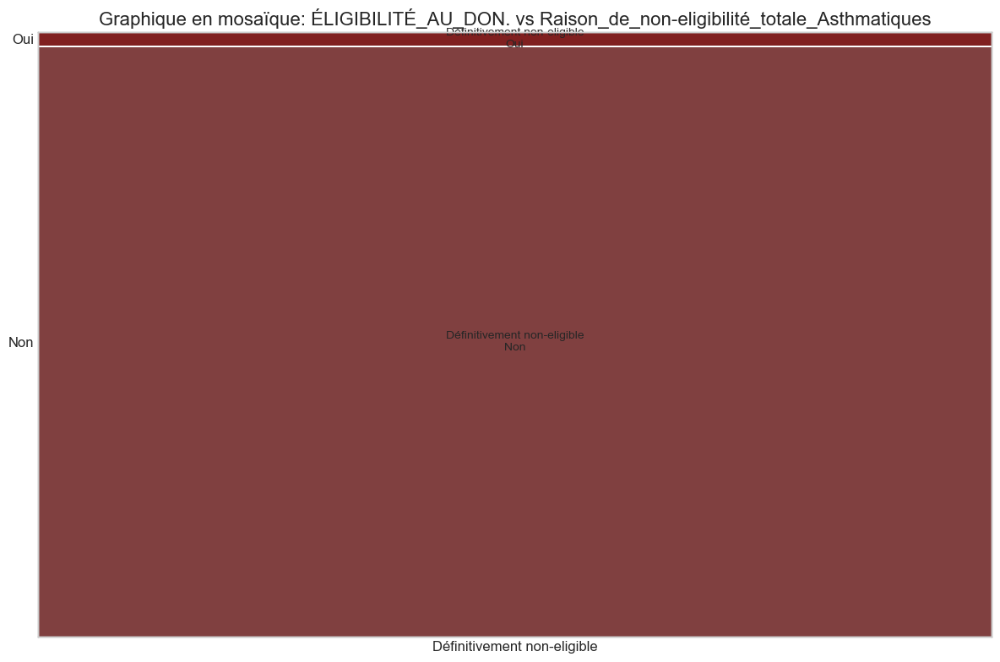


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Cardiaque:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


<Figure size 1200x800 with 0 Axes>

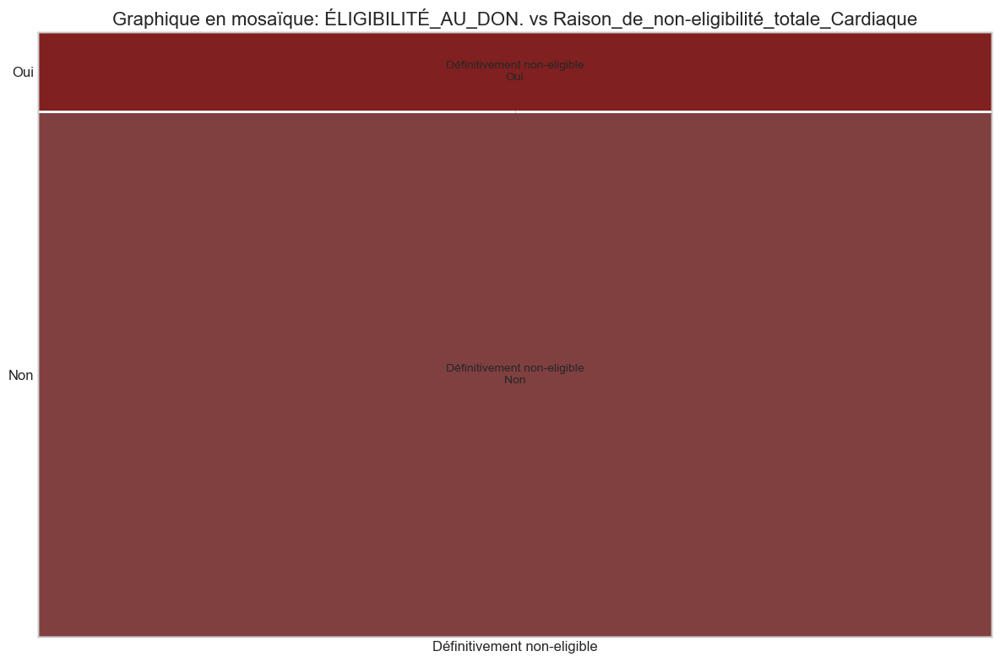


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Tatoué:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


<Figure size 1200x800 with 0 Axes>

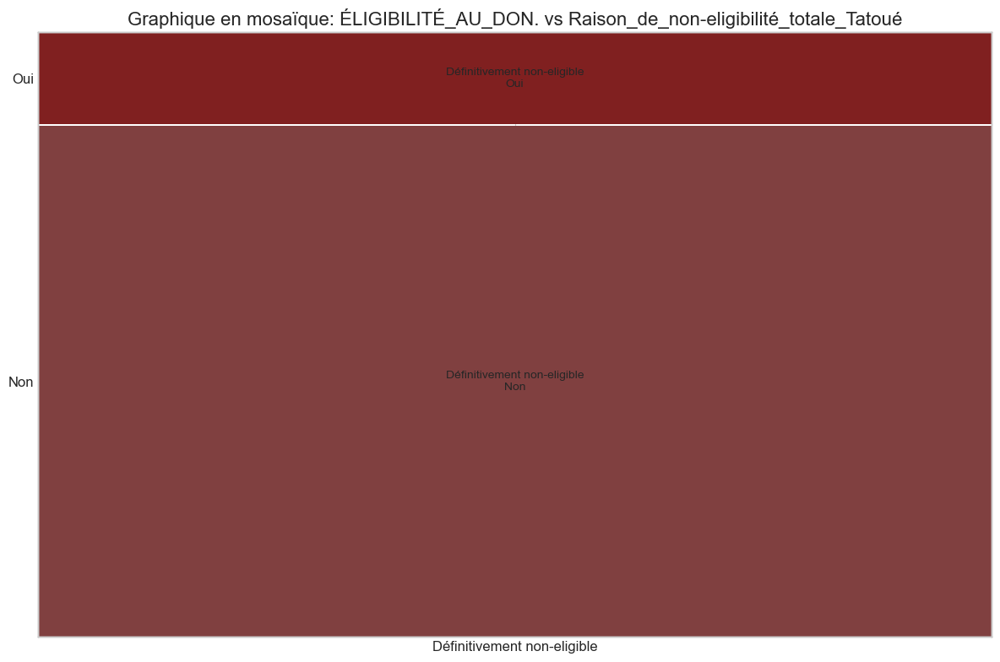


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Scarifié:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


<Figure size 1200x800 with 0 Axes>

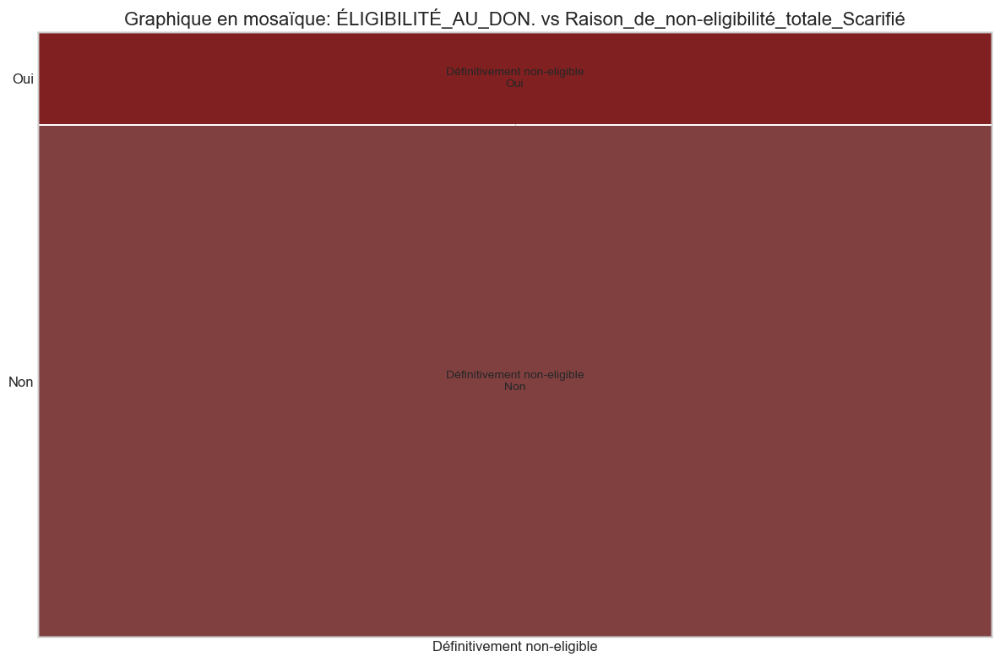

In [12]:
def analyze_categorical_relationships(df, sheet_name):
    """
    Analyse les relations entre les variables catégorielles avec des visualisations améliorées et des tests statistiques.
    """
    print(f"\n### Analyse des relations entre variables catégorielles - {sheet_name} ###")
    
    # Sélectionner les variables catégorielles
    categorical_columns = df.select_dtypes(include=['object']).columns
    
    # Identifier les variables catégorielles avec un nombre limité de catégories
    valid_columns = []
    for col in categorical_columns:
        if df[col].nunique() <= 10 and df[col].nunique() > 1:  # Limiter aux colonnes avec 2-10 catégories
            valid_columns.append(col)
    
    if len(valid_columns) >= 2:
        # Identifier une variable cible potentielle (comme l'éligibilité au don)
        target_column = None
        for potential_target in ['ÉLIGIBILITÉ_AU_DON.', 'Éligibilité_au_don', 'Eligibilité']:
            if potential_target in valid_columns:
                target_column = potential_target
                break
        
        if target_column:
            print(f"\nAnalyse des facteurs influençant {target_column}:")
            
            for col in valid_columns:
                if col != target_column:
                    # Créer une table de contingence
                    contingency = pd.crosstab(df[target_column], df[col])
                    
                    # Test du chi2 pour l'indépendance
                    chi2, p, dof, expected = stats.chi2_contingency(contingency)
                    association = "significative" if p < 0.05 else "non significative"
                    
                    print(f"\nRelation entre {target_column} et {col}:")
                    print(f"Test du chi2: chi2={chi2:.2f}, p={p:.4f}, degrés de liberté={dof}")
                    print(f"Association {association} (seuil α=0.05)")
                    
                    # Calculer les pourcentages par ligne
                    contingency_pct = contingency.div(contingency.sum(axis=1), axis=0) * 100
                    
                    # Créer un graphique à barres empilées interactif
                    fig = px.bar(contingency_pct, 
                                barmode='stack',
                                title=f'Relation entre {target_column} et {col} (p={p:.4f})',
                                labels={'value': 'Pourcentage (%)', 'index': target_column})
                    
                    fig.update_layout(height=500,
                                     legend_title=col,
                                     template='plotly_white')
                    
                    # Ajouter une annotation pour le résultat du test
                    fig.add_annotation(x=0.5, y=1.05,
                                      xref="paper", yref="paper",
                                      text=f"Test du chi2: p={p:.4f} - Association {association}",
                                      showarrow=False,
                                      font=dict(size=12),
                                      align="center")
                    
                    fig.show()
                    
                    # Créer un graphique en mosaïque pour une visualisation alternative
                    plt.figure(figsize=(12, 8))
                    mosaic_data = {(i, j): contingency.loc[i, j] for i in contingency.index for j in contingency.columns}
                    mosaic(mosaic_data, title=f'Graphique en mosaïque: {target_column} vs {col}')
                    plt.tight_layout()
                    plt.show()
        else:
            # Si pas de variable cible évidente, analyser quelques paires de variables
            pairs_to_analyze = []
            for i in range(len(valid_columns)):
                for j in range(i+1, min(i+3, len(valid_columns))):
                    pairs_to_analyze.append((valid_columns[i], valid_columns[j]))
            
            for col1, col2 in pairs_to_analyze[:3]:  # Limiter à 3 paires
                # Créer une table de contingence
                contingency = pd.crosstab(df[col1], df[col2])
                
                # Test du chi2 pour l'indépendance
                chi2, p, dof, expected = stats.chi2_contingency(contingency)
                association = "significative" if p < 0.05 else "non significative"
                
                print(f"\nRelation entre {col1} et {col2}:")
                print(f"Test du chi2: chi2={chi2:.2f}, p={p:.4f}, degrés de liberté={dof}")
                print(f"Association {association} (seuil α=0.05)")
                
                # Créer un heatmap interactif
                fig = px.imshow(contingency,
                               labels=dict(x=col2, y=col1, color="Fréquence"),
                               text_auto=True,
                               aspect="auto",
                               color_continuous_scale="Viridis")
                
                fig.update_layout(title=f'Relation entre {col1} et {col2} (p={p:.4f})',
                                 height=600,
                                 width=800)
                
                # Ajouter une annotation pour le résultat du test
                fig.add_annotation(x=0.5, y=1.05,
                                  xref="paper", yref="paper",
                                  text=f"Test du chi2: p={p:.4f} - Association {association}",
                                  showarrow=False,
                                  font=dict(size=12),
                                  align="center")
                
                fig.show()
    else:
        print("Pas assez de variables catégorielles valides pour analyser les relations.")

# Analyser les relations catégorielles pour chaque jeu de données
analyze_categorical_relationships(df_2019, "Données 2019")



### Analyse des relations entre variables catégorielles - Données Volontaire ###

Analyse des facteurs influençant ÉLIGIBILITÉ_AU_DON.:

Relation entre ÉLIGIBILITÉ_AU_DON. et Niveau_d'etude:
Test du chi2: chi2=6.12, p=0.6335, degrés de liberté=8
Association non significative (seuil α=0.05)


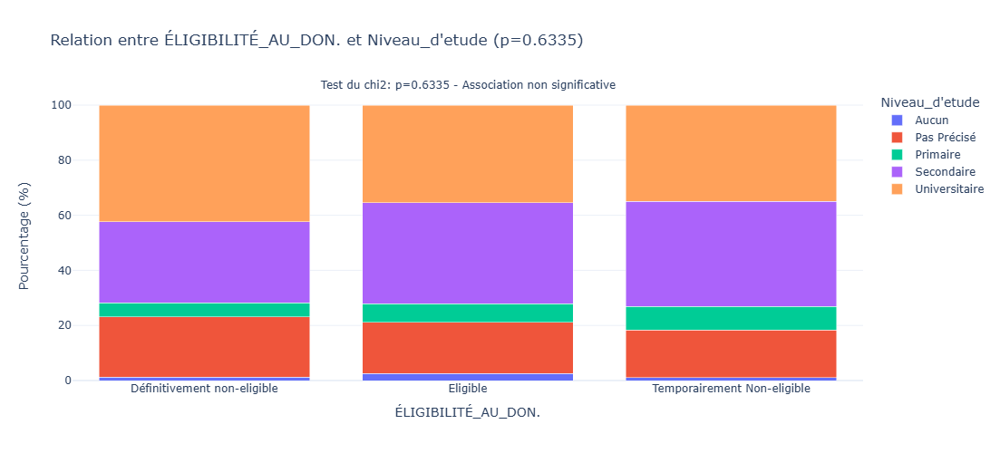

<Figure size 1200x800 with 0 Axes>

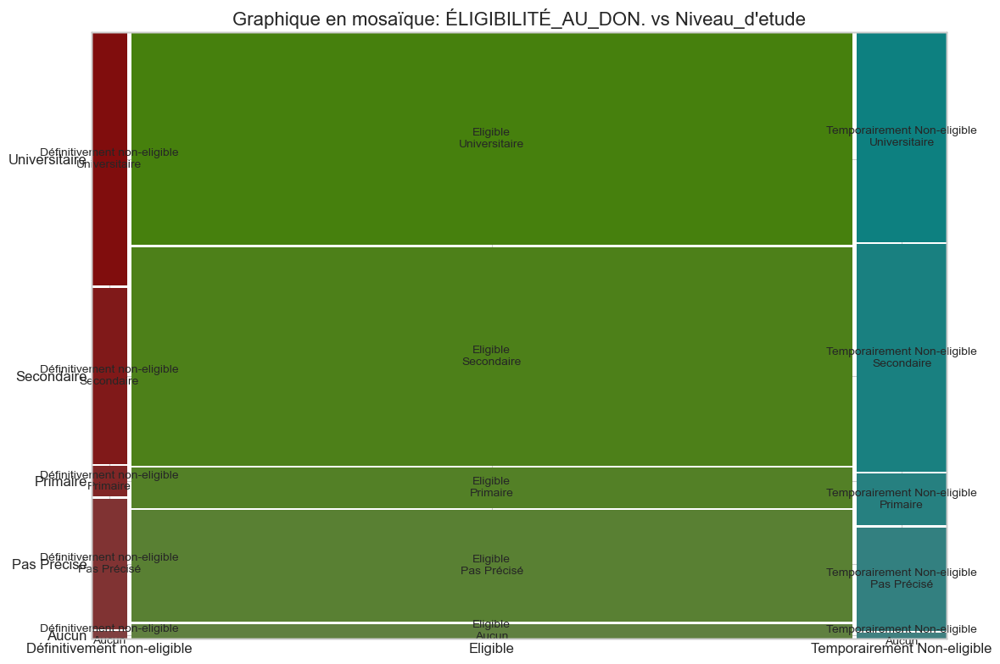


Relation entre ÉLIGIBILITÉ_AU_DON. et Genre:
Test du chi2: chi2=124.76, p=0.0000, degrés de liberté=2
Association significative (seuil α=0.05)


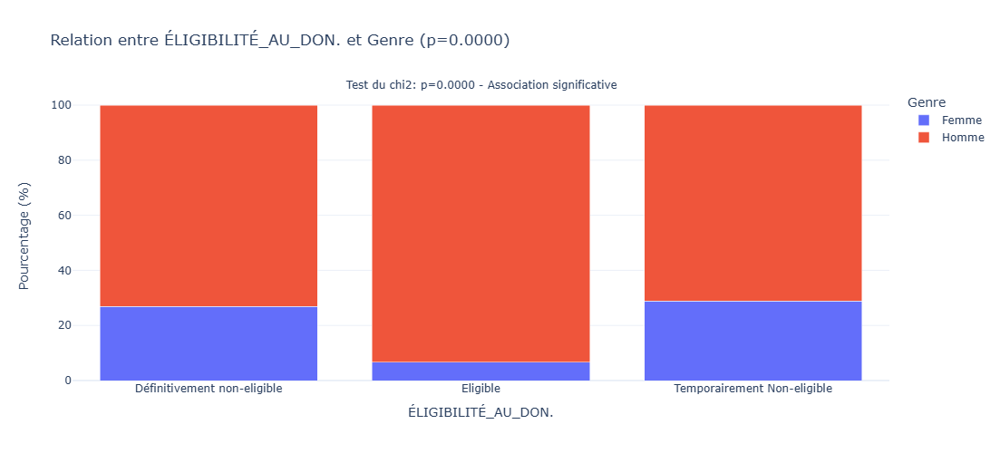

<Figure size 1200x800 with 0 Axes>

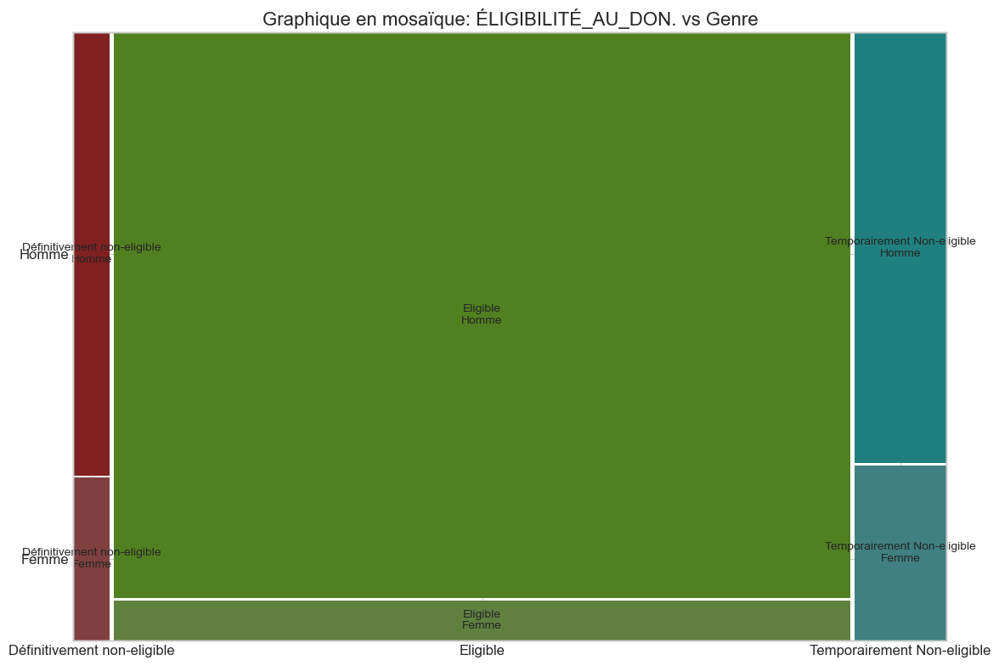


Relation entre ÉLIGIBILITÉ_AU_DON. et Situation_matrimoniale:
Test du chi2: chi2=11.31, p=0.0791, degrés de liberté=6
Association non significative (seuil α=0.05)


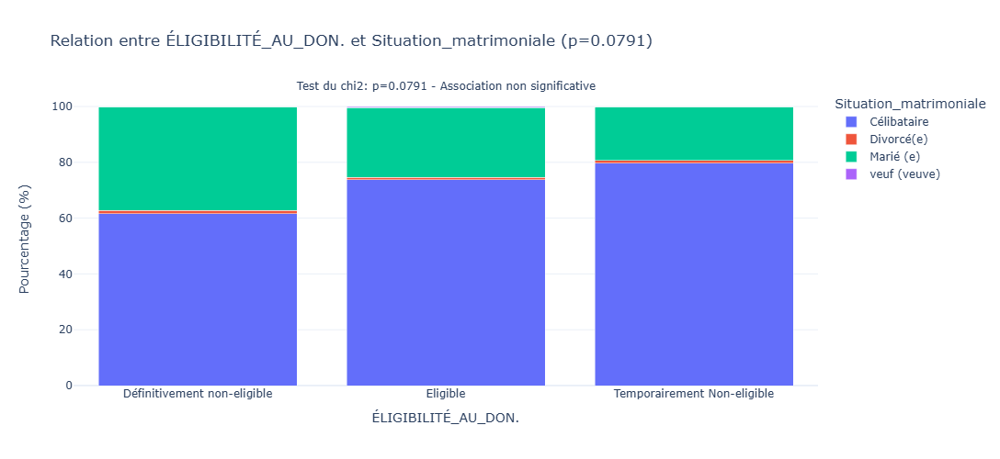

<Figure size 1200x800 with 0 Axes>

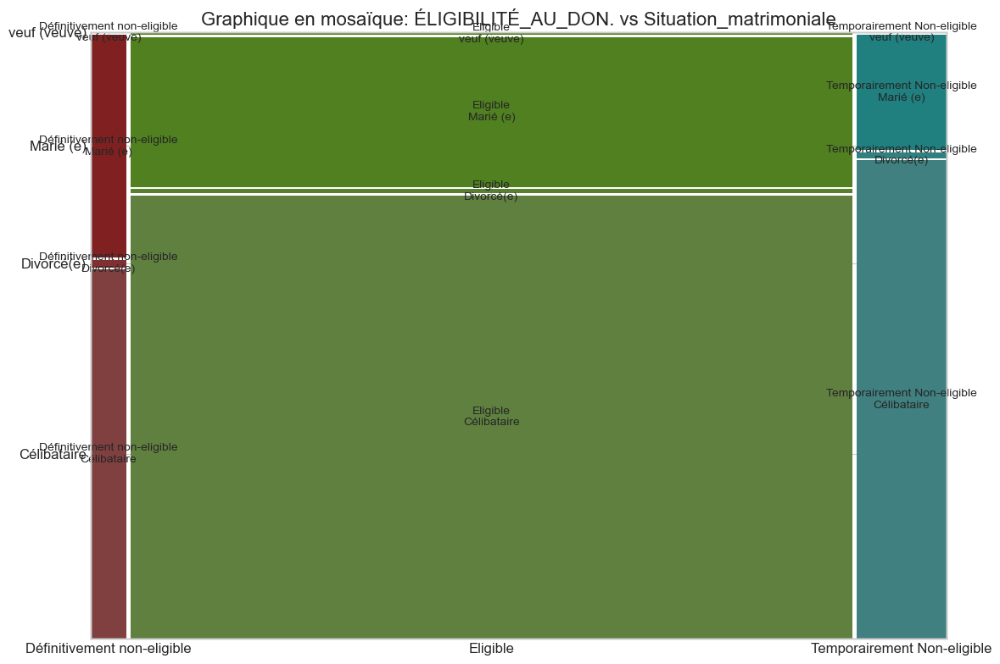


Relation entre ÉLIGIBILITÉ_AU_DON. et A-t-il_elle_déjà_donné_le_sang_:
Test du chi2: chi2=23.17, p=0.0000, degrés de liberté=2
Association significative (seuil α=0.05)


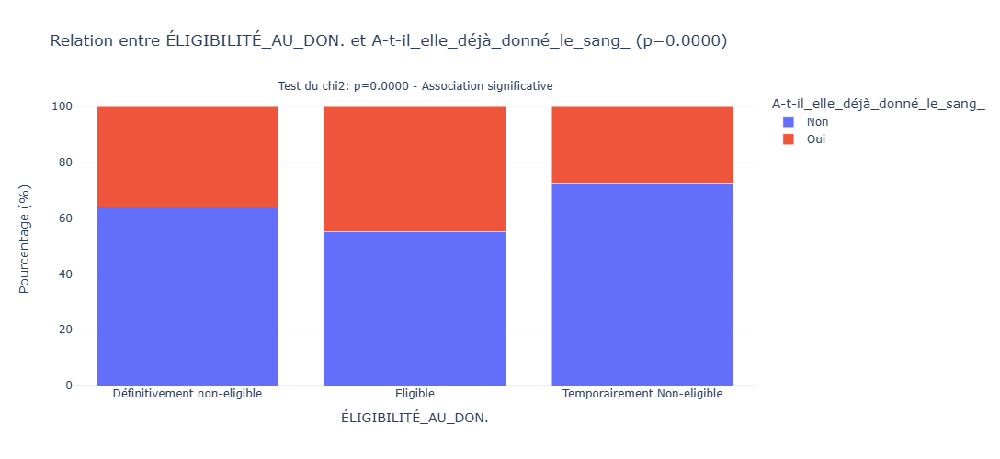

<Figure size 1200x800 with 0 Axes>

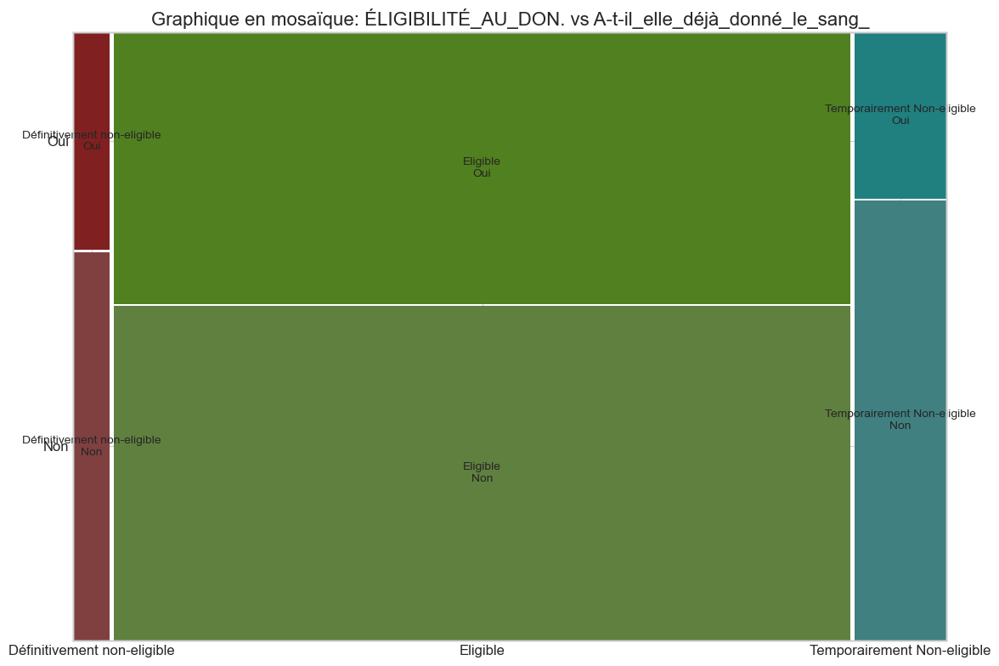


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_indisponibilité_Est_sous_anti-biothérapie_:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


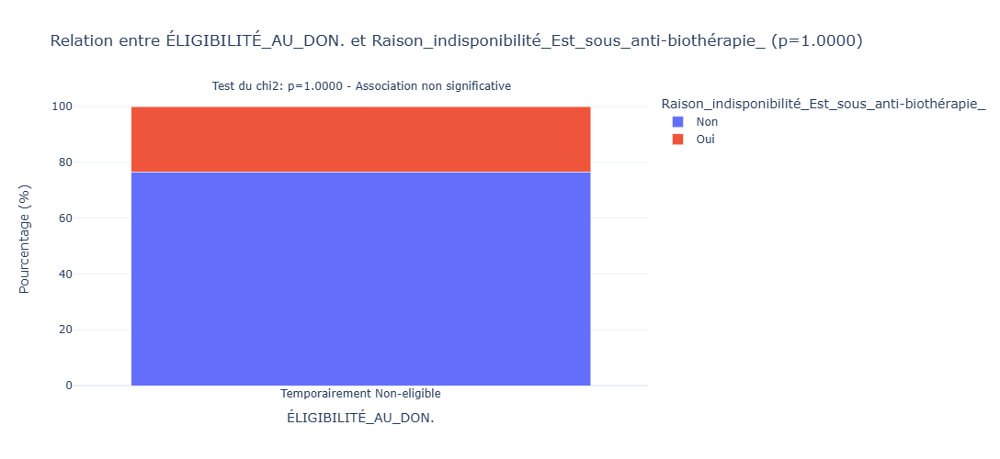

<Figure size 1200x800 with 0 Axes>

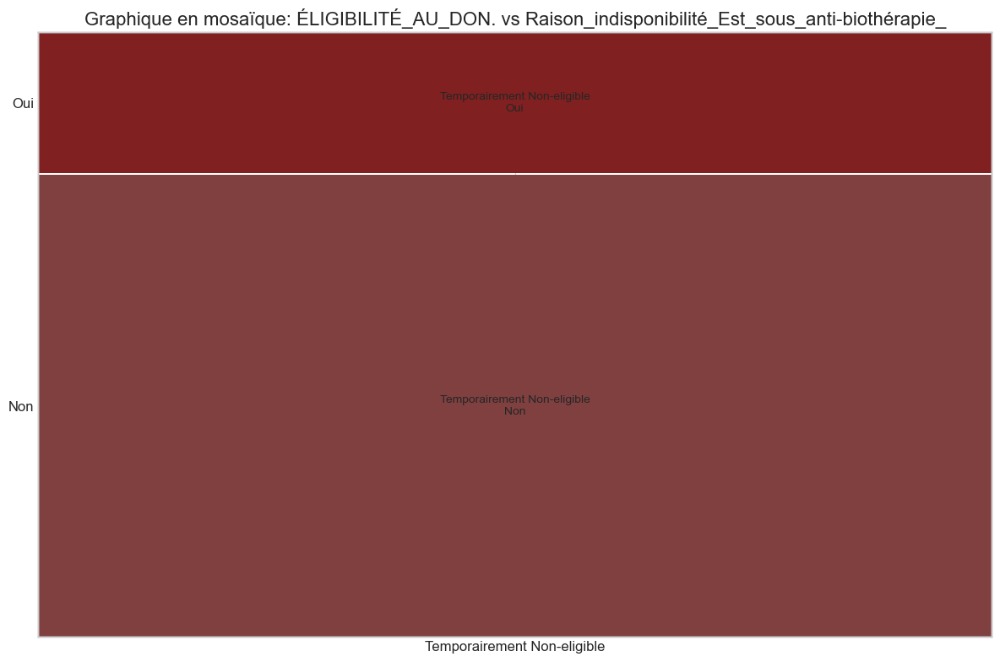


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_indisponibilité_Taux_d’hémoglobine_bas_:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


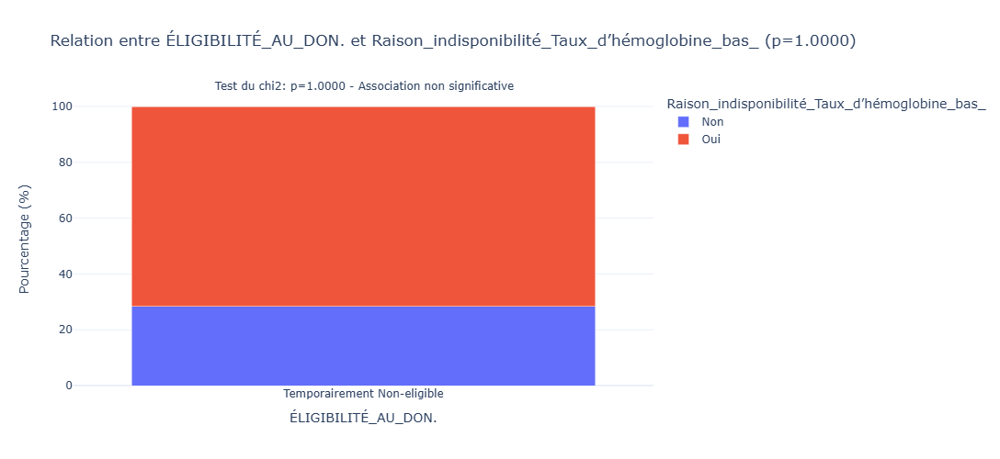

<Figure size 1200x800 with 0 Axes>

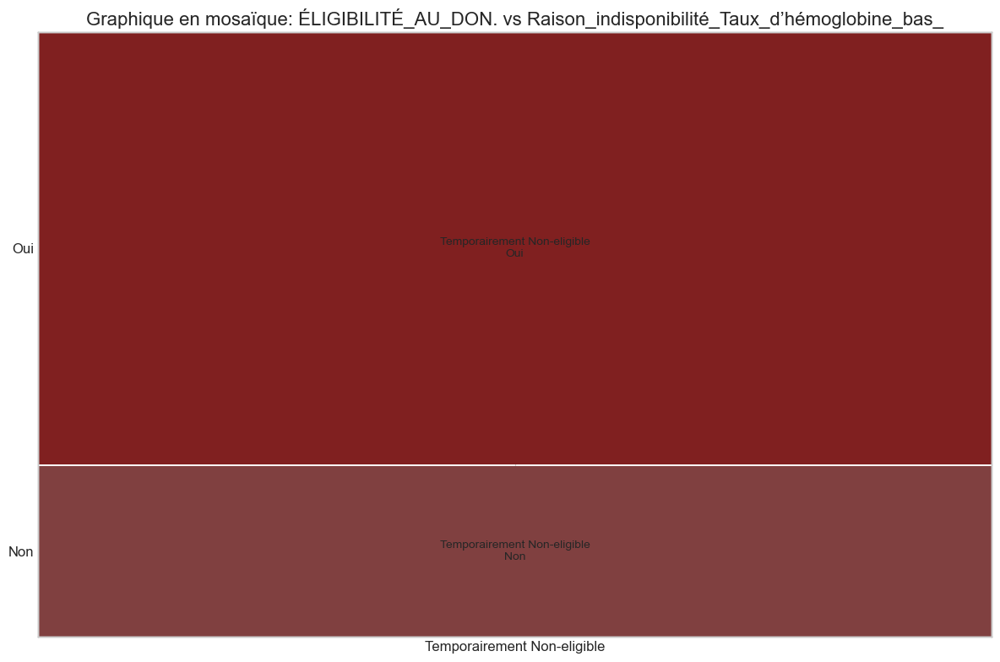


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_indisponibilité_date_de_dernier_Don_<_3_mois_:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


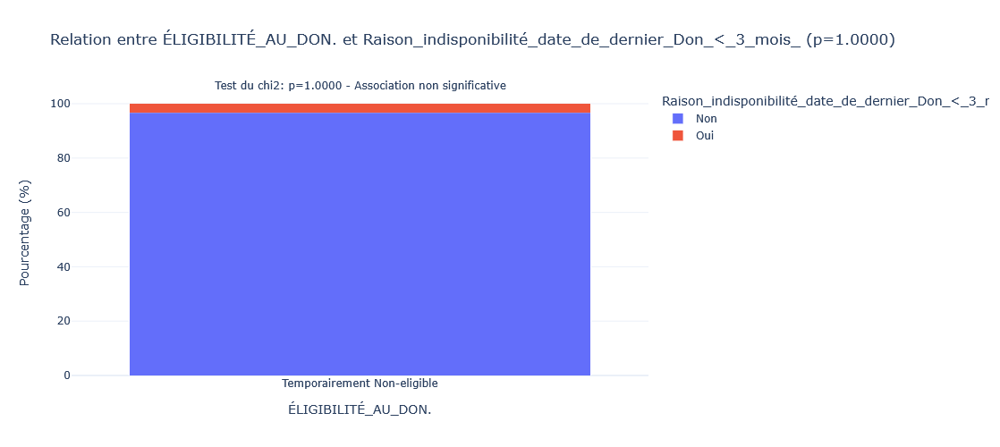

<Figure size 1200x800 with 0 Axes>

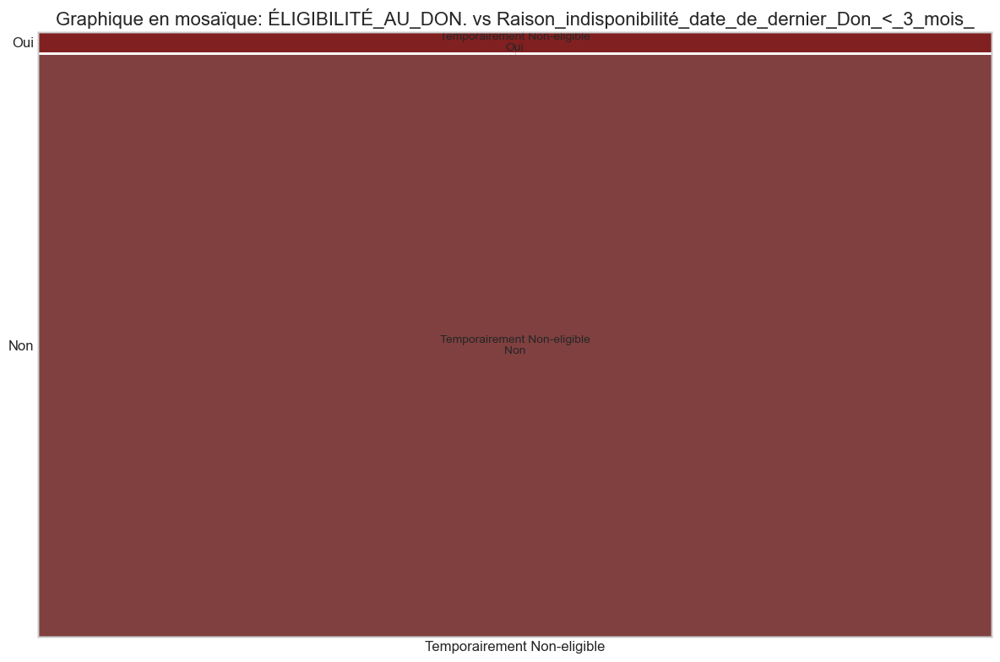


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_indisponibilité_IST_récente_Exclu_VIH_Hbs_Hcv:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


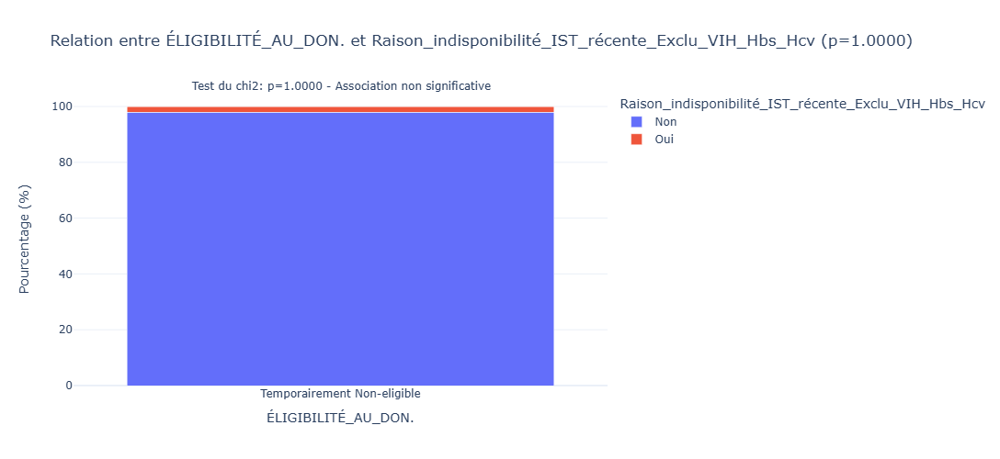

<Figure size 1200x800 with 0 Axes>

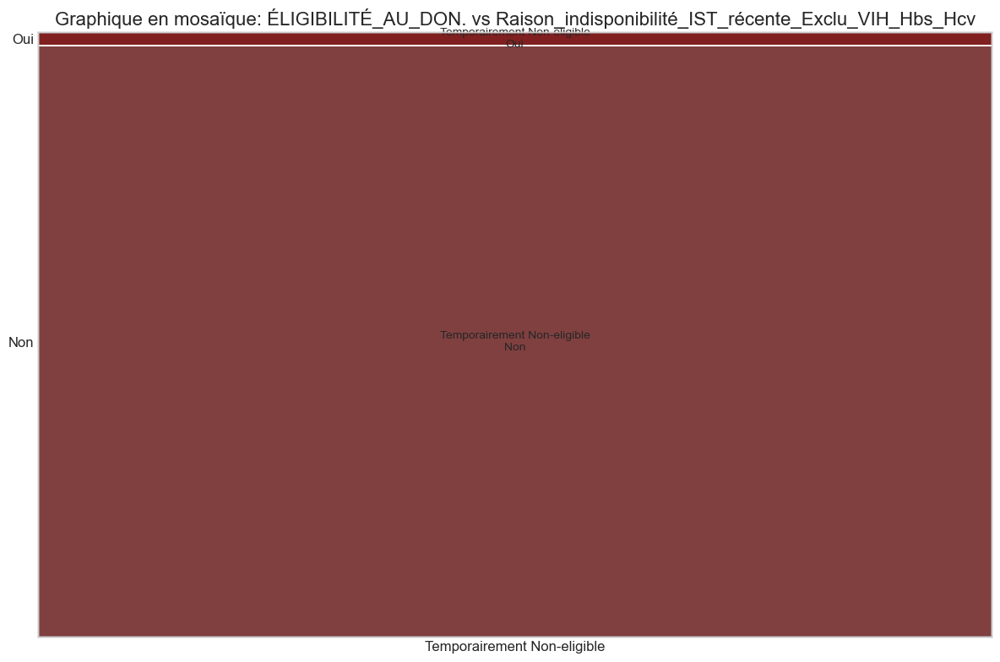


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_l’indisponibilité_de_la_femme_La_DDR_est_mauvais_si_<14_jour_avant_le_don:
Test du chi2: chi2=0.00, p=1.0000, degrés de liberté=0
Association non significative (seuil α=0.05)


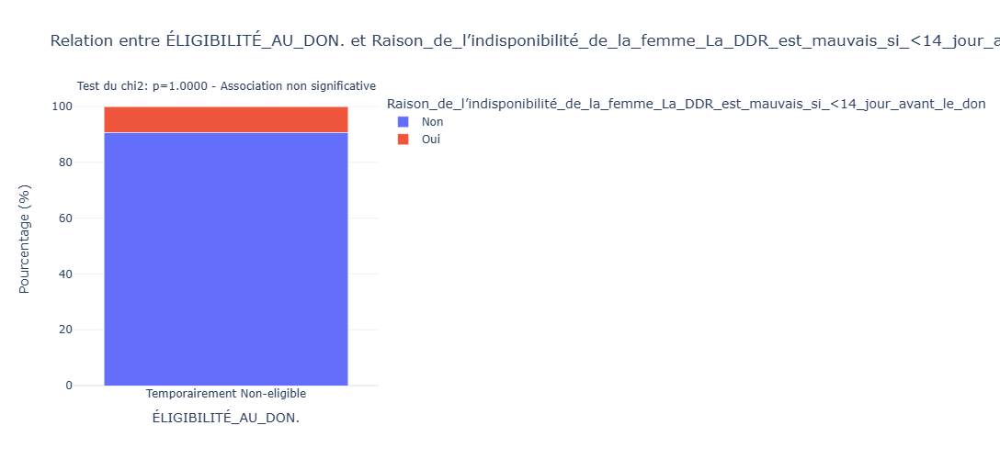

<Figure size 1200x800 with 0 Axes>

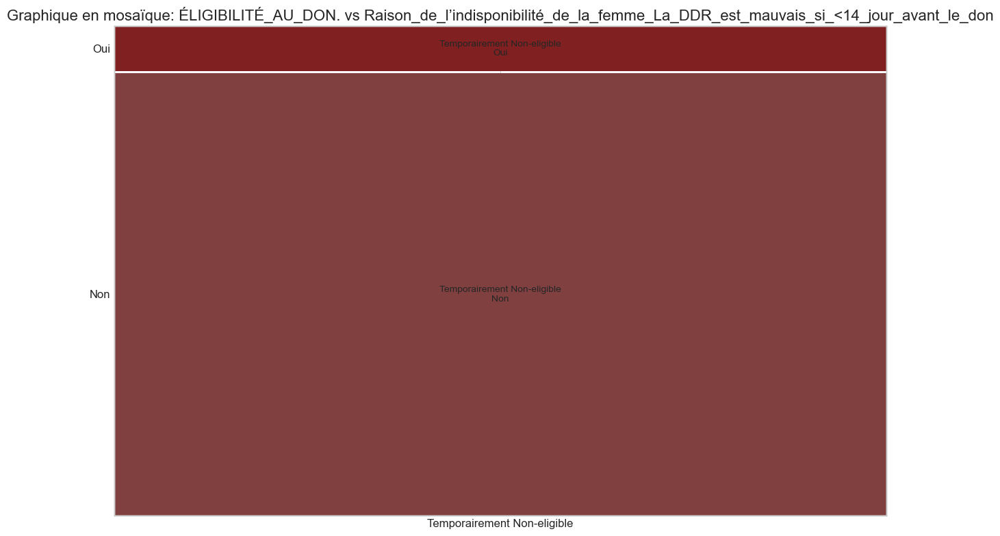


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Antécédent_de_transfusion:
Test du chi2: chi2=412.02, p=0.0000, degrés de liberté=2
Association significative (seuil α=0.05)


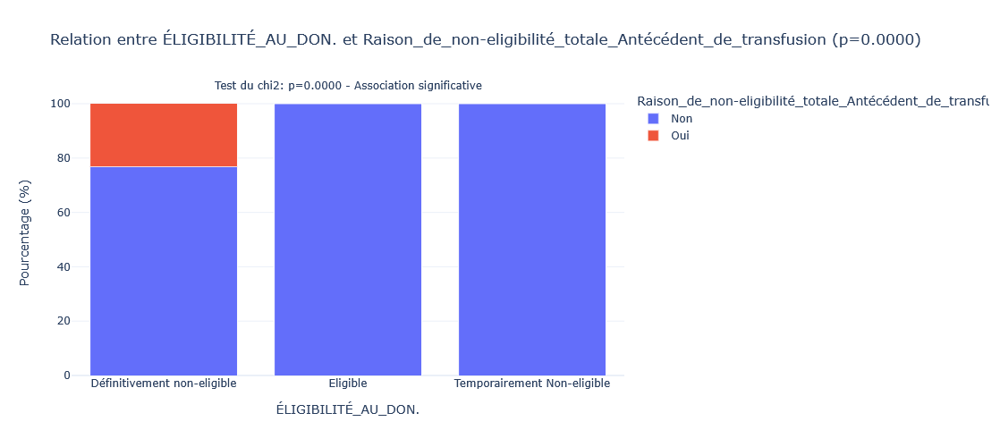

<Figure size 1200x800 with 0 Axes>

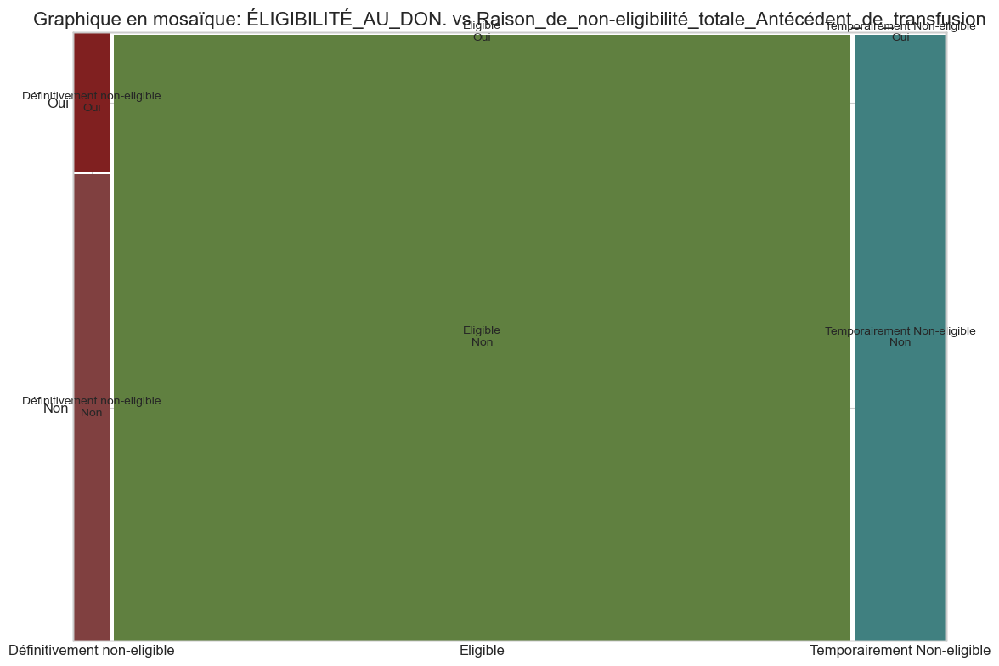


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_PorteurHIVhbshcv:
Test du chi2: chi2=113.64, p=0.0000, degrés de liberté=2
Association significative (seuil α=0.05)


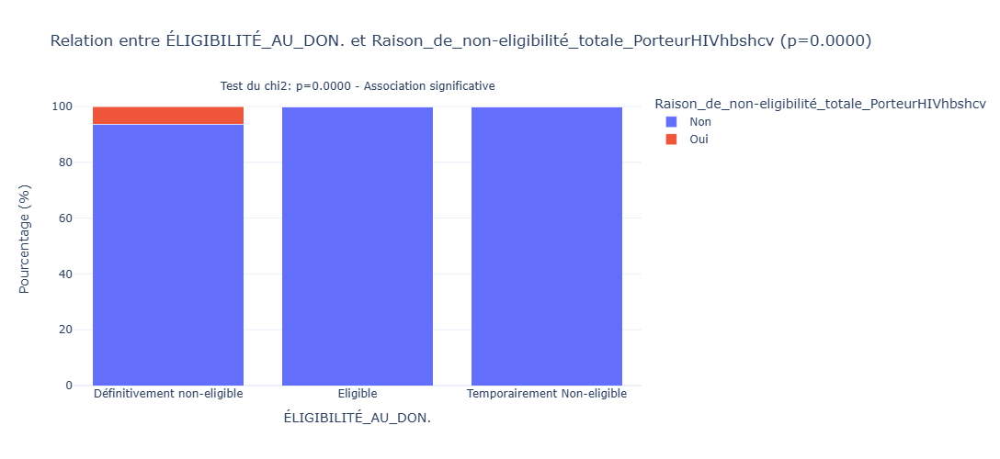

<Figure size 1200x800 with 0 Axes>

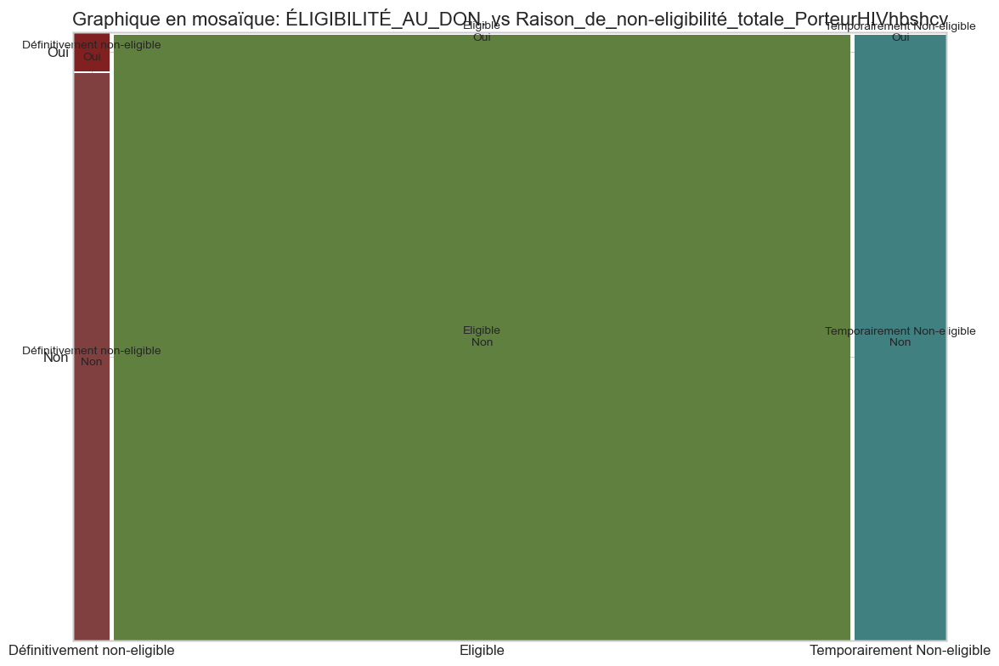


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Opéré:
Test du chi2: chi2=808.67, p=0.0000, degrés de liberté=2
Association significative (seuil α=0.05)


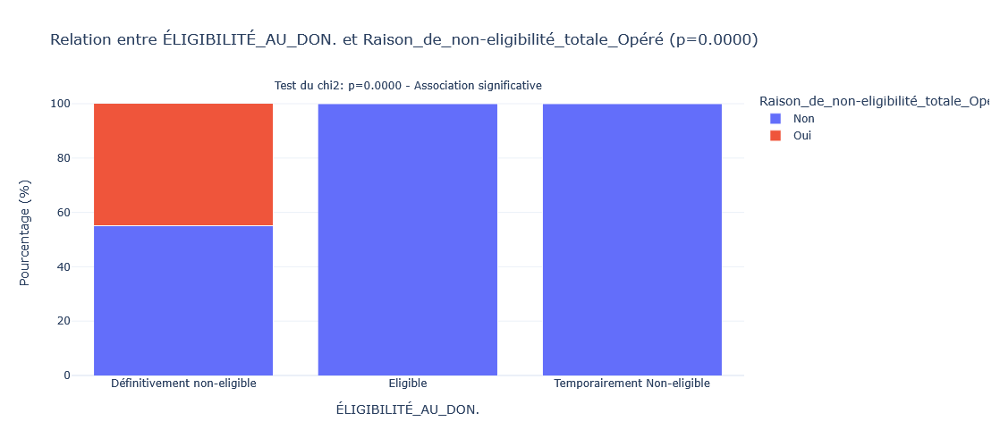

<Figure size 1200x800 with 0 Axes>

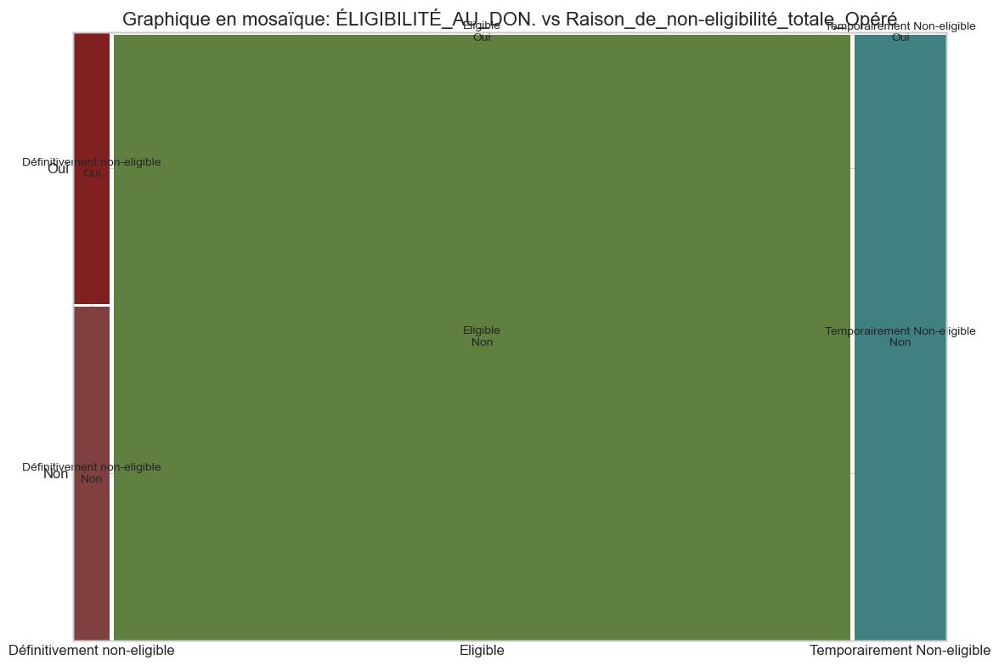


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Drepanocytaire:
Test du chi2: chi2=45.38, p=0.0000, degrés de liberté=2
Association significative (seuil α=0.05)


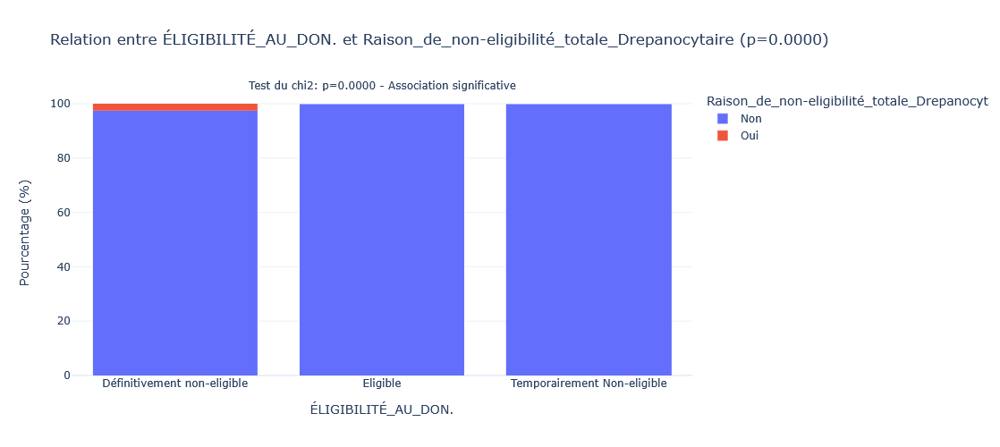

<Figure size 1200x800 with 0 Axes>

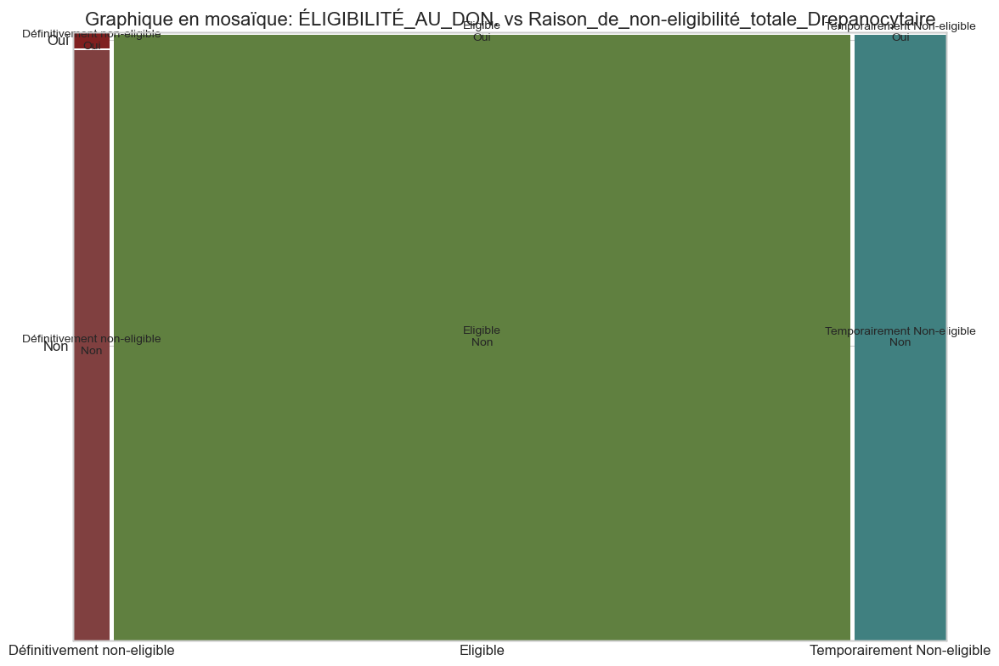


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Diabétique:
Test du chi2: chi2=45.38, p=0.0000, degrés de liberté=2
Association significative (seuil α=0.05)


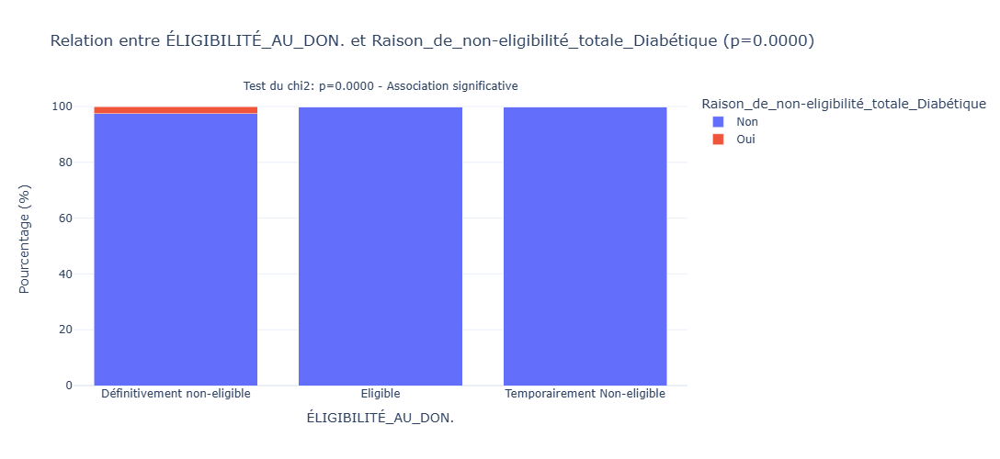

<Figure size 1200x800 with 0 Axes>

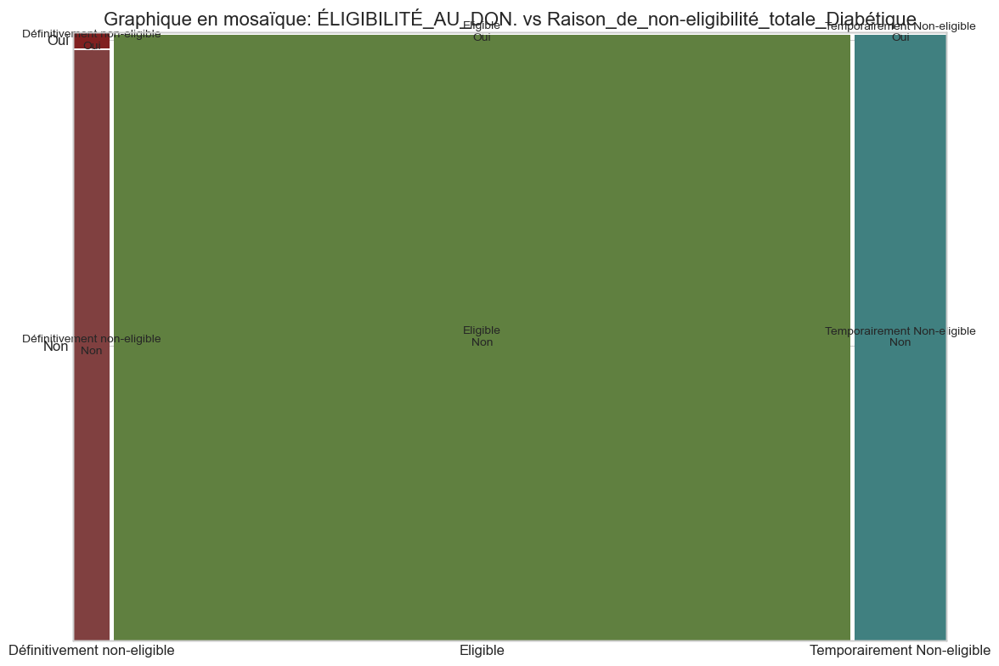


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Hypertendus:
Test du chi2: chi2=22.68, p=0.0000, degrés de liberté=2
Association significative (seuil α=0.05)


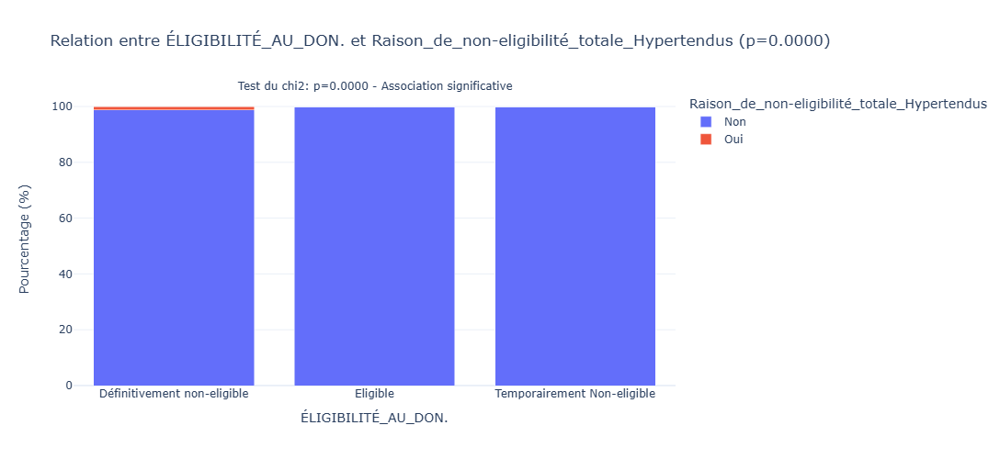

<Figure size 1200x800 with 0 Axes>

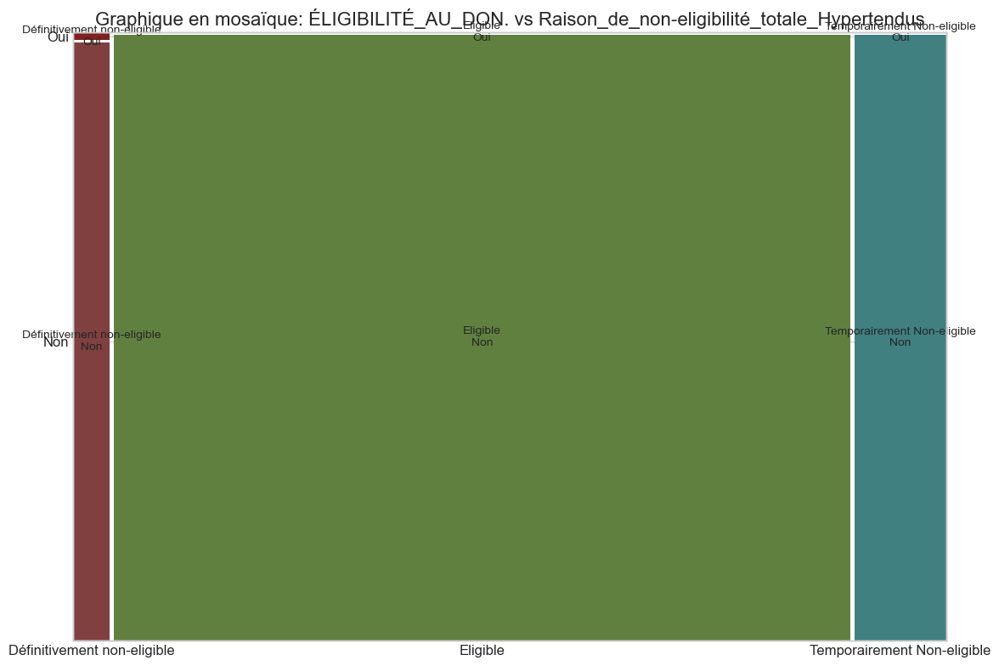


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Asthmatiques:
Test du chi2: chi2=45.38, p=0.0000, degrés de liberté=2
Association significative (seuil α=0.05)


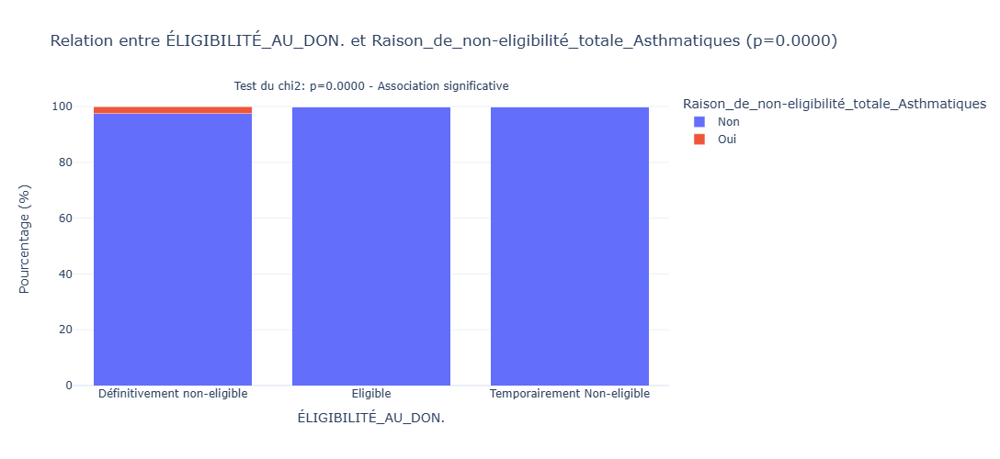

<Figure size 1200x800 with 0 Axes>

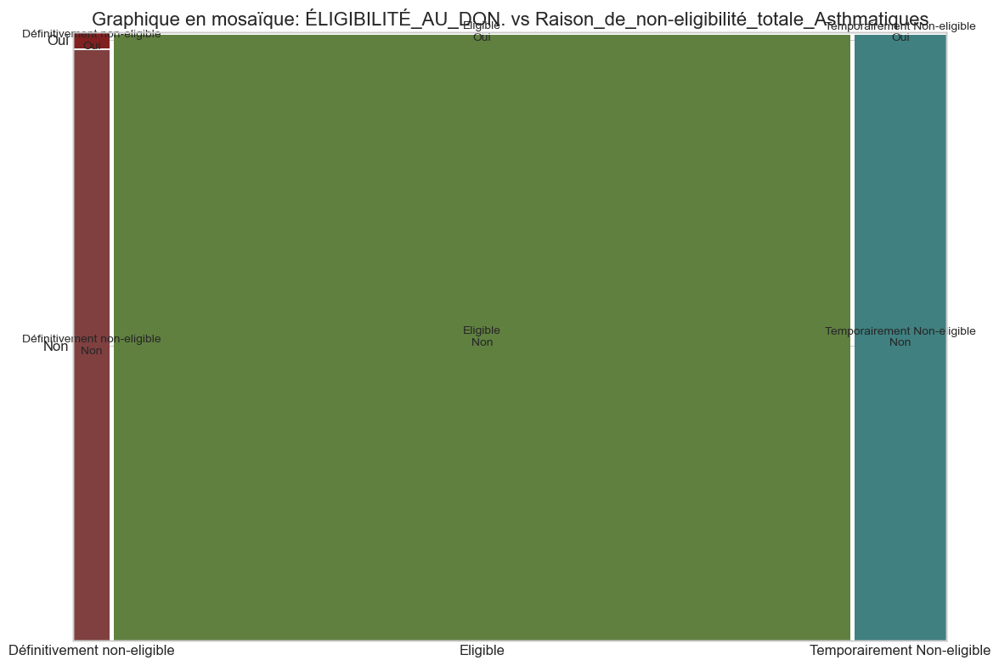


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Cardiaque:
Test du chi2: chi2=227.90, p=0.0000, degrés de liberté=2
Association significative (seuil α=0.05)


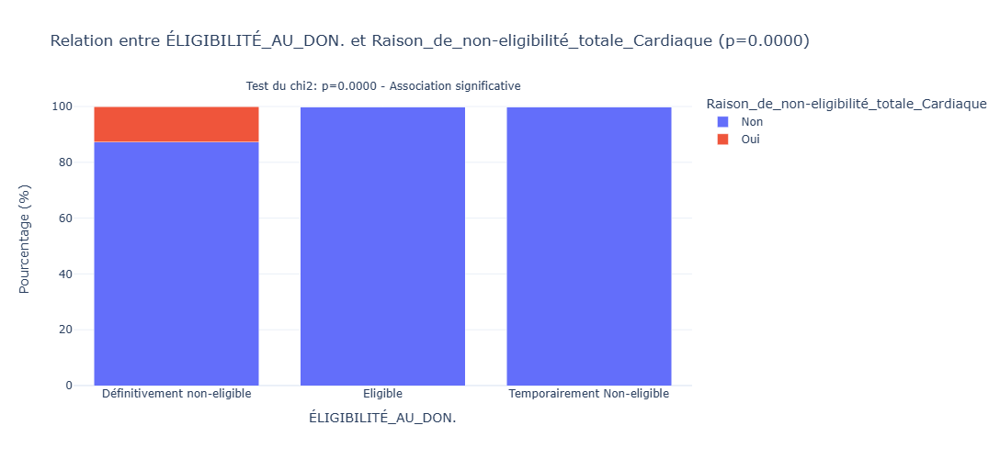

<Figure size 1200x800 with 0 Axes>

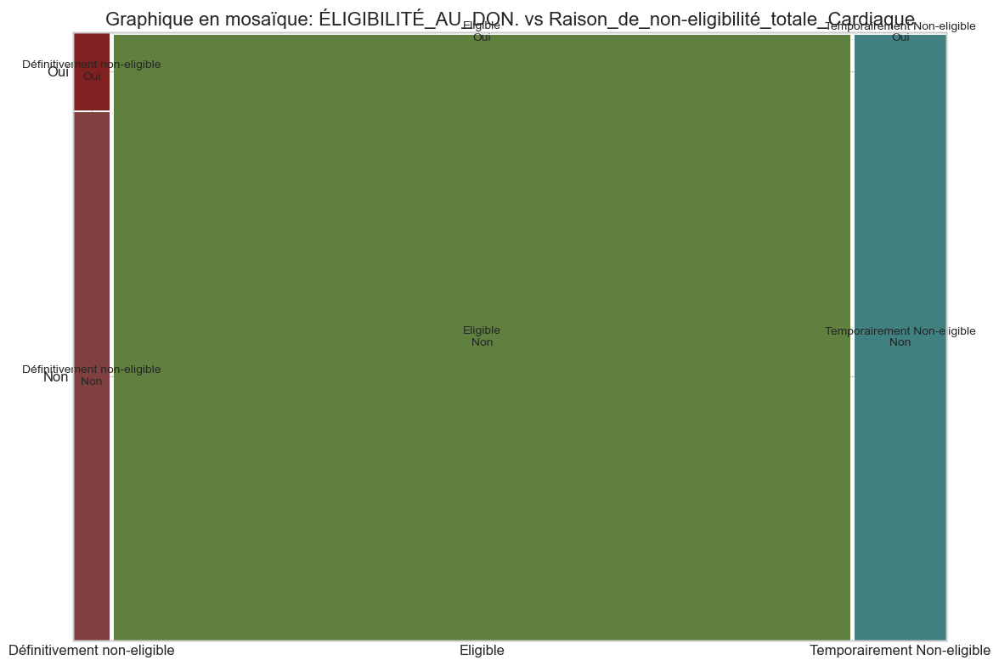


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Tatoué:
Test du chi2: chi2=250.83, p=0.0000, degrés de liberté=2
Association significative (seuil α=0.05)


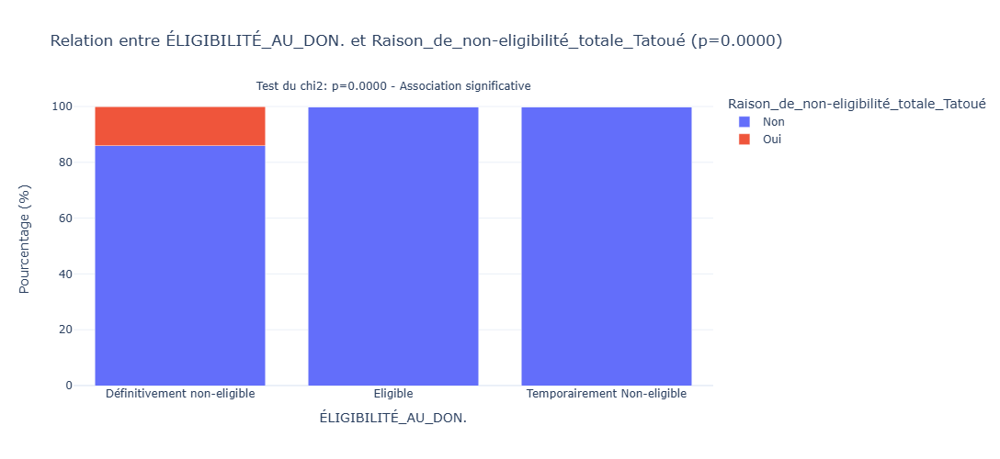

<Figure size 1200x800 with 0 Axes>

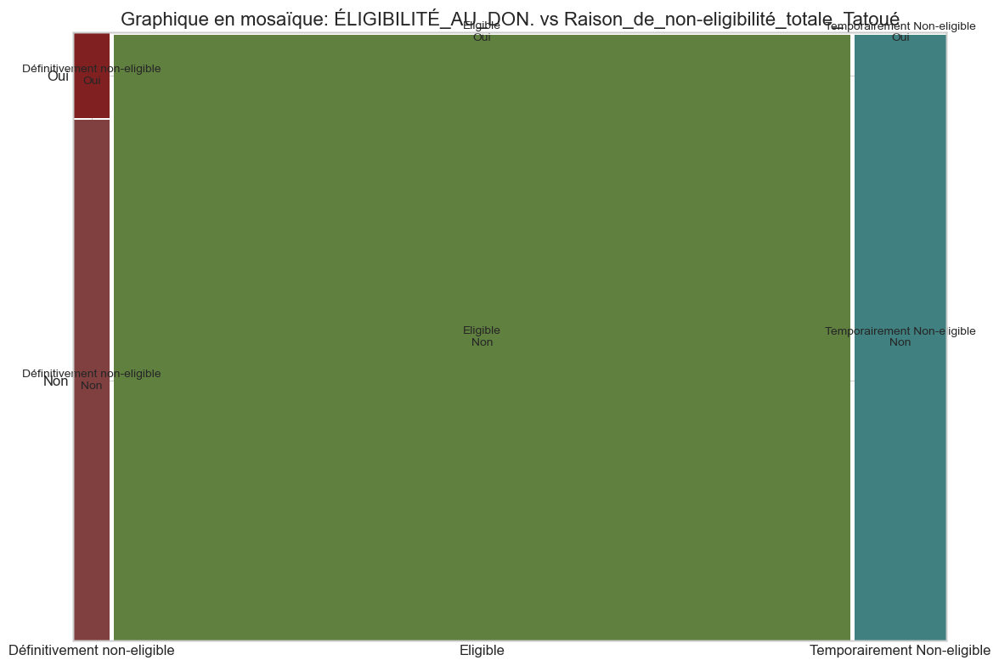


Relation entre ÉLIGIBILITÉ_AU_DON. et Raison_de_non-eligibilité_totale_Scarifié:
Test du chi2: chi2=227.90, p=0.0000, degrés de liberté=2
Association significative (seuil α=0.05)


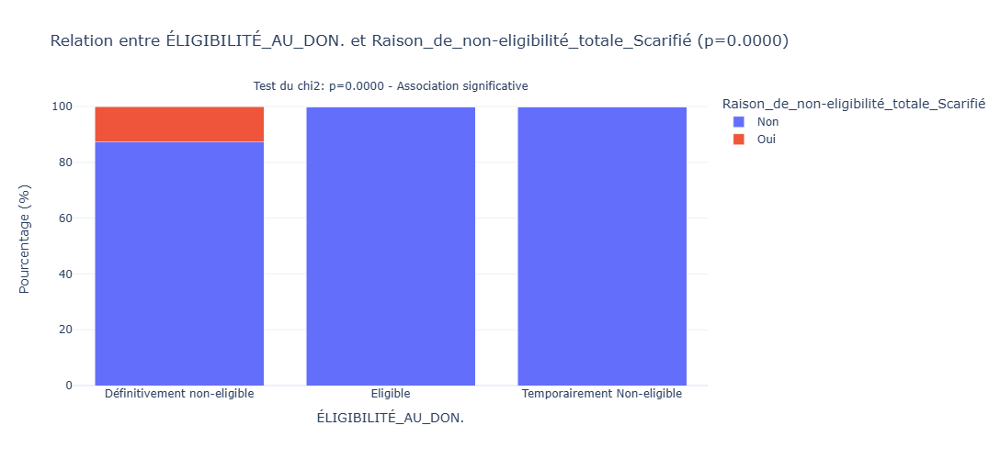

<Figure size 1200x800 with 0 Axes>

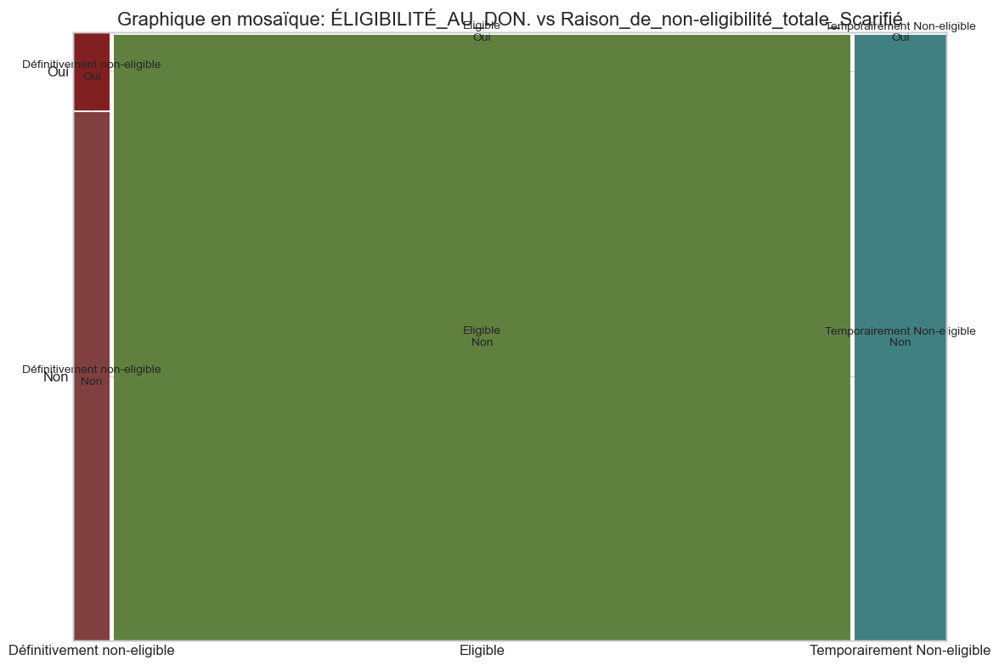

In [8]:
analyze_categorical_relationships(df_volontaire, "Données Volontaire")

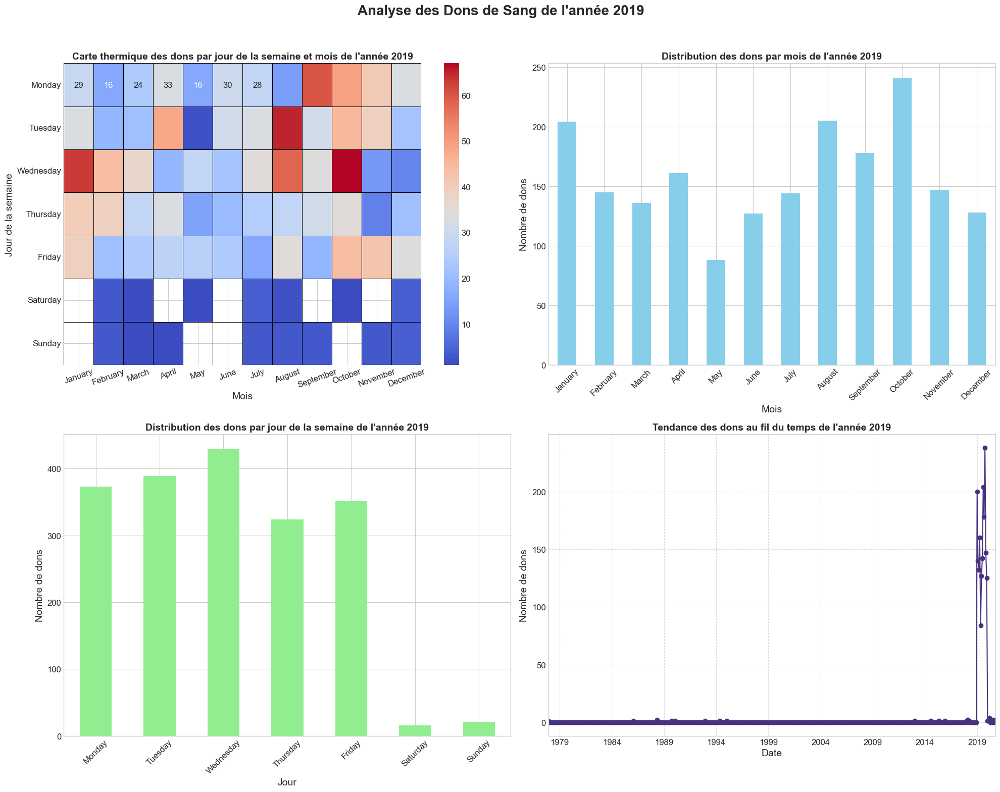

In [22]:
df=df_2019.copy()
# Nettoyage et formatage des dates de don
df['Date_de_remplissage_de_la_fiche'] = pd.to_datetime(df['Date_de_remplissage_de_la_fiche'], errors='coerce')
df = df.dropna(subset=['Date_de_remplissage_de_la_fiche'])

# Extraire les informations temporelles utiles
df["Année"] = df["Date_de_remplissage_de_la_fiche"].dt.year
df["Mois"] = df["Date_de_remplissage_de_la_fiche"].dt.month
df["Jour"] = df["Date_de_remplissage_de_la_fiche"].dt.day
df["Jour de la semaine"] = df["Date_de_remplissage_de_la_fiche"].dt.dayofweek  # 0 = Lundi, 6 = Dimanche
df["Mois_Nom"] = df["Mois"].apply(lambda m: calendar.month_name[m])

# Créer une figure unique avec une taille adaptée pour afficher tous les graphiques
plt.figure(figsize=(20, 16))

# Utiliser GridSpec pour un contrôle plus précis de la disposition
gs = GridSpec(2, 2, figure=plt.gcf())

# 1. Carte thermique des dons par jour et mois
ax1 = plt.subplot(gs[0, 0])
heatmap_data = df.pivot_table(index="Jour de la semaine", columns="Mois", values="Date_de_remplissage_de_la_fiche", aggfunc="count")
heatmap_data.index = [calendar.day_name[i] for i in heatmap_data.index]
heatmap_data.columns = [calendar.month_name[int(col)] for col in heatmap_data.columns]
sns.heatmap(heatmap_data, cmap="coolwarm", annot=True, fmt=".0f", linewidths=0.5, linecolor="black", ax=ax1)
ax1.set_title("Carte thermique des dons par jour de la semaine et mois de l'année 2019", fontsize=14, fontweight='bold')
ax1.set_xlabel("Mois")
ax1.set_ylabel("Jour de la semaine")
ax1.tick_params(axis='x', rotation=20)
ax1.tick_params(axis='y', rotation=0)

# 2. Distribution des dons par mois
ax2 = plt.subplot(gs[0, 1])
monthly_counts = df.groupby("Mois_Nom")["Date_de_remplissage_de_la_fiche"].count()
# Réorganiser les mois dans l'ordre chronologique
month_order = [calendar.month_name[i] for i in range(1, 13) if calendar.month_name[i] in monthly_counts.index]
monthly_counts = monthly_counts.reindex(month_order)
monthly_counts.plot(kind='bar', color='skyblue', ax=ax2)
ax2.set_title("Distribution des dons par mois de l'année 2019", fontsize=14, fontweight='bold')
ax2.set_xlabel("Mois")
ax2.set_ylabel("Nombre de dons")
ax2.tick_params(axis='x', rotation=45)

# 3. Distribution des dons par jour de la semaine
ax3 = plt.subplot(gs[1, 0])
weekday_counts = df.groupby("Jour de la semaine")["Date_de_remplissage_de_la_fiche"].count()
weekday_names = [calendar.day_name[i] for i in range(7)]
weekday_counts.index = [weekday_names[i] for i in weekday_counts.index]
weekday_counts.plot(kind='bar', color='lightgreen', ax=ax3)
ax3.set_title("Distribution des dons par jour de la semaine de l'année 2019", fontsize=14, fontweight='bold')
ax3.set_xlabel("Jour")
ax3.set_ylabel("Nombre de dons")
ax3.tick_params(axis='x', rotation=45)

# 4. Tendance des dons au fil du temps
ax4 = plt.subplot(gs[1, 1])
time_series = df.groupby(pd.Grouper(key="Date_de_remplissage_de_la_fiche", freq='M')).size()
time_series.plot(marker='o', linestyle='-', ax=ax4)
ax4.set_title("Tendance des dons au fil du temps de l'année 2019", fontsize=14, fontweight='bold')
ax4.set_xlabel("Date")
ax4.set_ylabel("Nombre de dons")
ax4.grid(True, linestyle='--', alpha=0.7)

# Ajouter un titre global
plt.suptitle("Analyse des Dons de Sang de l'année 2019", fontsize=20, fontweight='bold', y=0.98)

# Ajuster la mise en page avec un espacement suffisant
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Laisse de l'espace pour le titre global


# Afficher la figure
plt.show()


## Analyse des facteurs d'éligibilité au don

Examinons en détail les facteurs qui influencent l'éligibilité au don de sang.


### Analyse des facteurs d'éligibilité au don ###


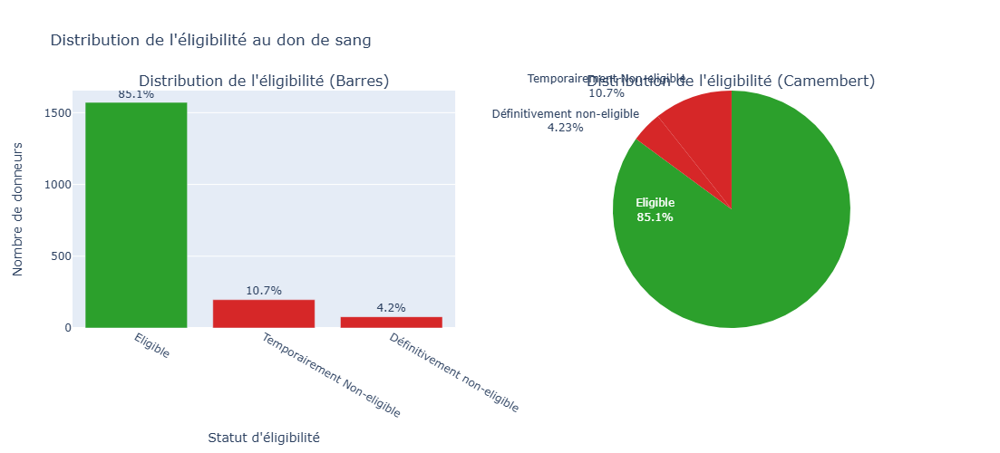

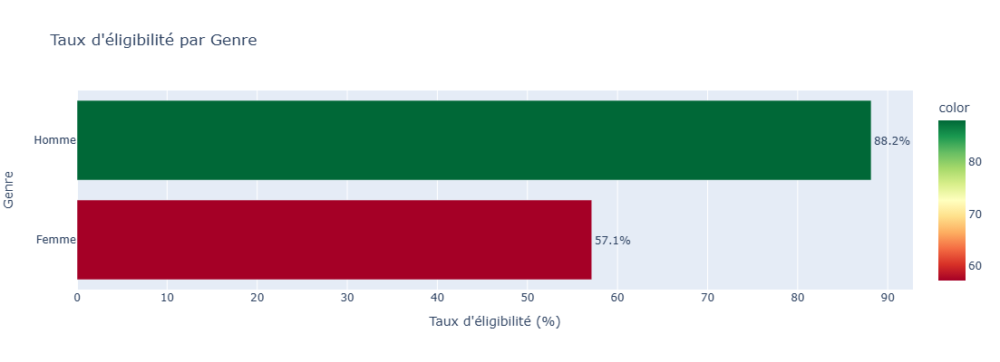


Comparaison des taux d'éligibilité par Genre:
Tests de proportion entre catégories:
  - Femme vs Homme: z=-11.16, p=0.0000 - Différence significative


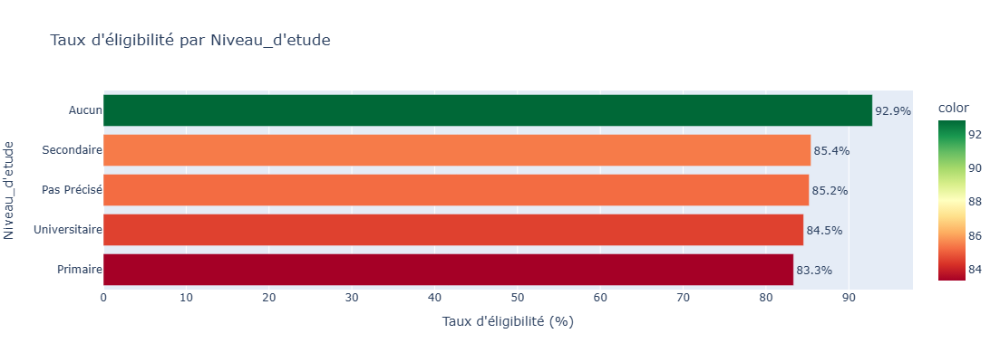


Comparaison des taux d'éligibilité par Niveau_d'etude:
Tests de proportion entre catégories:
  - Aucun vs Pas Précisé: z=1.35, p=0.1773 - Différence non significative
  - Aucun vs Primaire: z=1.53, p=0.1266 - Différence non significative
  - Aucun vs Secondaire: z=1.34, p=0.1805 - Différence non significative
  - Aucun vs Universitaire: z=1.46, p=0.1431 - Différence non significative
  - Pas Précisé vs Primaire: z=0.50, p=0.6150 - Différence non significative
  - Pas Précisé vs Secondaire: z=-0.09, p=0.9248 - Différence non significative
  - Pas Précisé vs Universitaire: z=0.28, p=0.7783 - Différence non significative
  - Primaire vs Secondaire: z=-0.61, p=0.5425 - Différence non significative
  - Primaire vs Universitaire: z=-0.34, p=0.7315 - Différence non significative
  - Secondaire vs Universitaire: z=0.46, p=0.6481 - Différence non significative


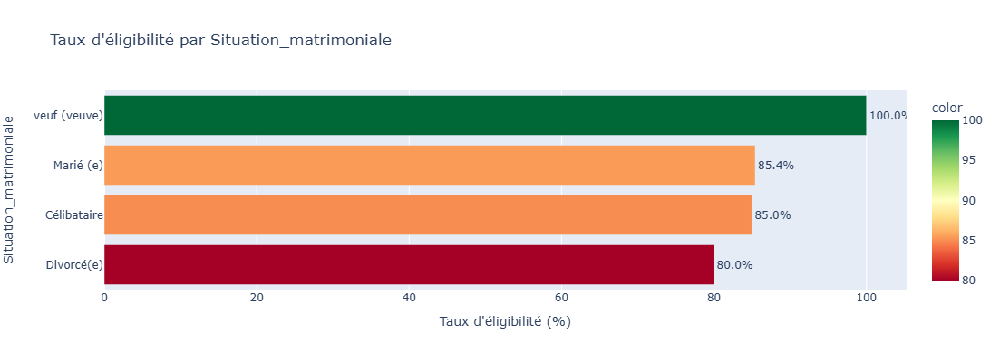


Comparaison des taux d'éligibilité par Situation_matrimoniale:
Tests de proportion entre catégories:
  - Célibataire vs Divorcé(e): z=0.54, p=0.5917 - Différence non significative
  - Célibataire vs Marié (e): z=-0.22, p=0.8265 - Différence non significative
  - Célibataire vs veuf (veuve): z=-1.11, p=0.2663 - Différence non significative
  - Divorcé(e) vs Marié (e): z=-0.58, p=0.5616 - Différence non significative
  - Divorcé(e) vs veuf (veuve): z=-1.27, p=0.2029 - Différence non significative
  - Marié (e) vs veuf (veuve): z=-1.09, p=0.2747 - Différence non significative


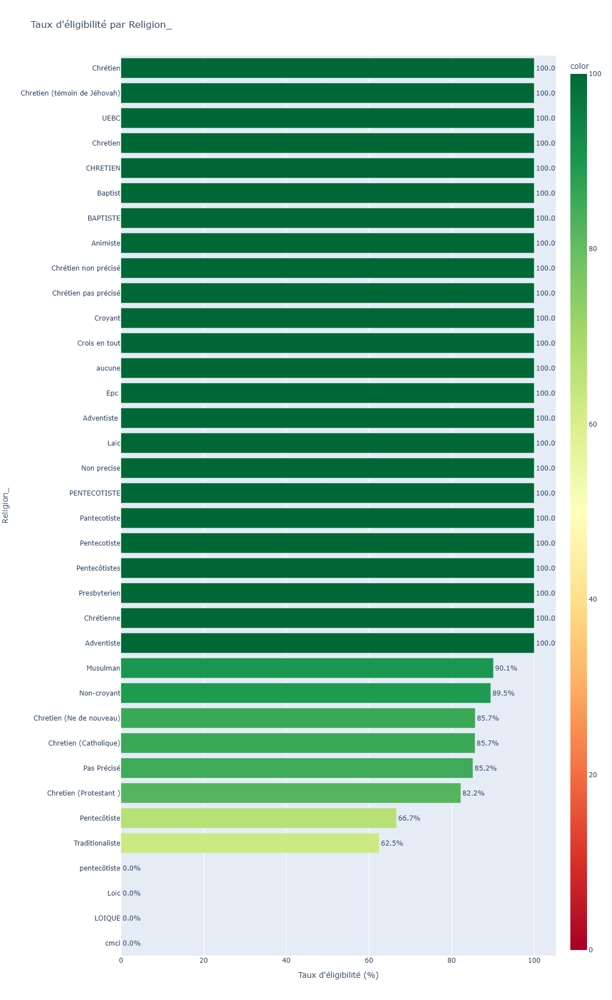


Comparaison des taux d'éligibilité par Religion_:
Tests de proportion entre catégories:
  - Adventiste vs Adventiste : z=nan, p=nan - Différence non significative
  - Adventiste vs Animiste: z=nan, p=nan - Différence non significative
  - Adventiste vs BAPTISTE: z=nan, p=nan - Différence non significative
  - Adventiste vs Baptist: z=nan, p=nan - Différence non significative
  - Adventiste vs CHRETIEN: z=nan, p=nan - Différence non significative
  - Adventiste vs Chretien: z=nan, p=nan - Différence non significative
  - Adventiste vs Chretien (Catholique): z=0.58, p=0.5632 - Différence non significative
  - Adventiste vs Chretien (Ne de nouveau): z=0.58, p=0.5652 - Différence non significative
  - Adventiste vs Chretien (Protestant ): z=0.66, p=0.5112 - Différence non significative
  - Adventiste vs Chretien (témoin de Jéhovah): z=nan, p=nan - Différence non significative
  - Adventiste vs Chrétien: z=nan, p=nan - Différence non significative
  - Adventiste vs Chrétien non précisé: z=

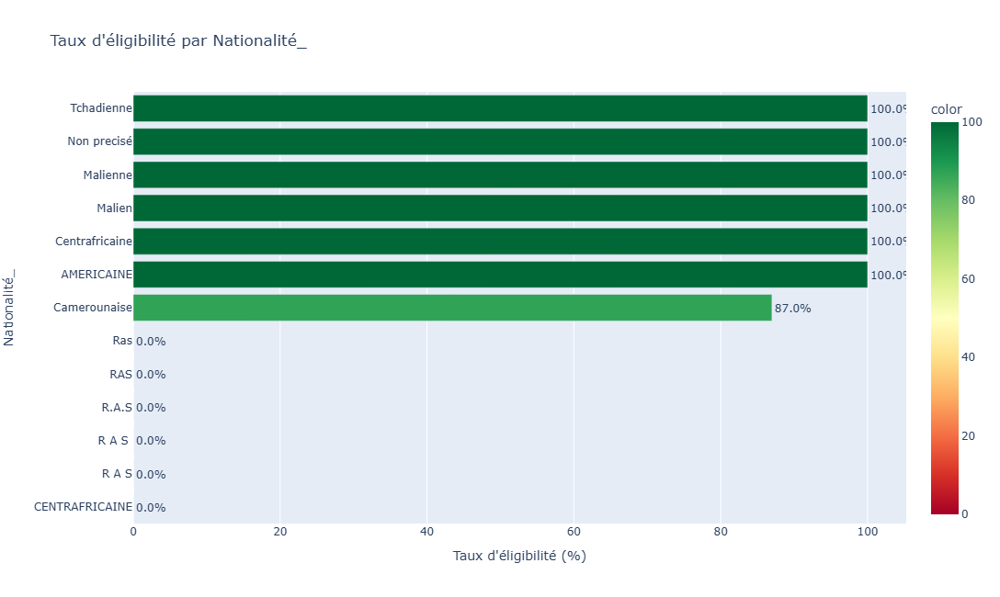


Comparaison des taux d'éligibilité par Nationalité_:
Tests de proportion entre catégories:
  - AMERICAINE vs CENTRAFRICAINE: z=1.41, p=0.1573 - Différence non significative
  - AMERICAINE vs Camerounaise: z=0.39, p=0.6987 - Différence non significative
  - AMERICAINE vs Centrafricaine: z=nan, p=nan - Différence non significative
  - AMERICAINE vs Malien: z=nan, p=nan - Différence non significative
  - AMERICAINE vs Malienne: z=nan, p=nan - Différence non significative
  - AMERICAINE vs Non precisé: z=nan, p=nan - Différence non significative
  - AMERICAINE vs R A S: z=5.29, p=0.0000 - Différence significative
  - AMERICAINE vs R A S : z=2.83, p=0.0047 - Différence significative
  - AMERICAINE vs R.A.S: z=1.73, p=0.0833 - Différence non significative
  - AMERICAINE vs RAS: z=2.00, p=0.0455 - Différence significative
  - AMERICAINE vs Ras: z=1.41, p=0.1573 - Différence non significative
  - AMERICAINE vs Tchadienne: z=nan, p=nan - Différence non significative
  - CENTRAFRICAINE vs Camer

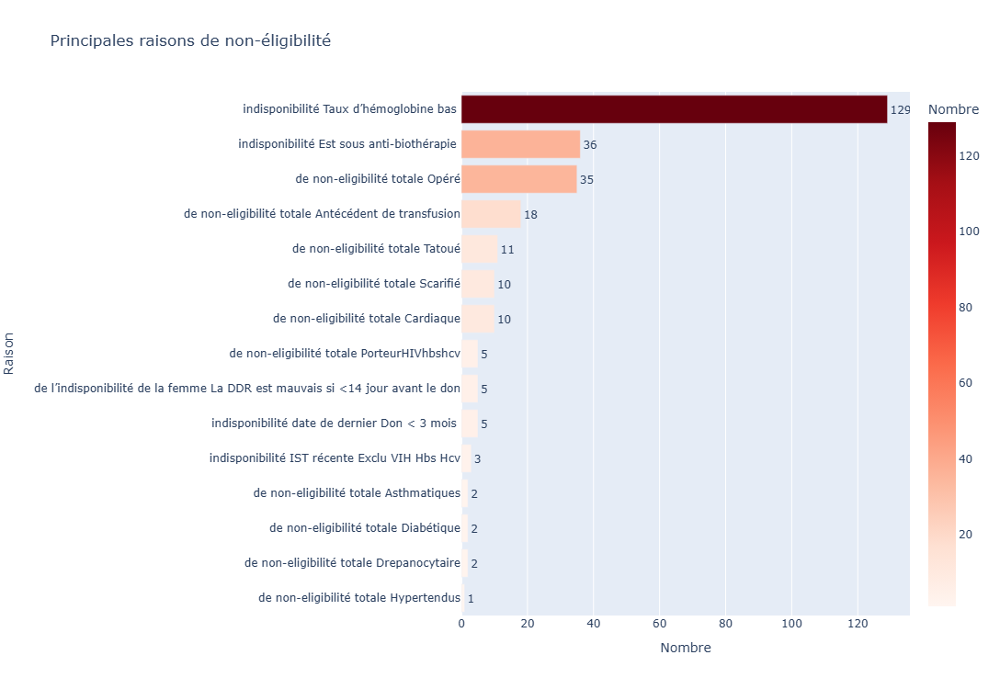

In [16]:
def analyze_eligibility_factors(df):
    """
    Analyse approfondie des facteurs influençant l'éligibilité au don de sang.
    """
    if 'ÉLIGIBILITÉ_AU_DON.' not in df.columns:
        print("La variable d'éligibilité au don n'est pas présente dans ce jeu de données.")
        return
    
    print("\n### Analyse des facteurs d'éligibilité au don ###")
    
    # Distribution de l'éligibilité
    eligibility_counts = df['ÉLIGIBILITÉ_AU_DON.'].value_counts()
    eligibility_pct = df['ÉLIGIBILITÉ_AU_DON.'].value_counts(normalize=True) * 100
    
    # Créer un graphique interactif
    fig = make_subplots(rows=1, cols=2, specs=[[{"type": "bar"}, {"type": "pie"}]],
                       subplot_titles=['Distribution de l\'éligibilité (Barres)', 'Distribution de l\'éligibilité (Camembert)'])
    
    # Graphique à barres
    fig.add_trace(
    go.Bar(x=eligibility_counts.index, y=eligibility_counts.values, 
           text=np.char.add(eligibility_pct.values.round(1).astype(str), '%'),
           textposition='outside',
           marker_color=['#2ca02c' if x == 'Eligible' else '#d62728' for x in eligibility_counts.index]),
    row=1, col=1
)

    
    # Graphique en camembert
    fig.add_trace(
        go.Pie(labels=eligibility_counts.index, values=eligibility_counts.values,
              textinfo='label+percent',
              insidetextorientation='radial',
              marker=dict(colors=['#2ca02c' if x == 'Eligible' else '#d62728' for x in eligibility_counts.index])),
        row=1, col=2
    )
    
    fig.update_layout(title='Distribution de l\'éligibilité au don de sang',
                     height=500,
                     showlegend=False)
    
    fig.update_xaxes(title_text="Statut d'éligibilité", row=1, col=1)
    fig.update_yaxes(title_text="Nombre de donneurs", row=1, col=1)
    
    fig.show()
    
    # Analyser l'éligibilité par facteurs démographiques
    demographic_factors = ['Genre', 'Niveau_d\'etude', 'Situation_matrimoniale', 'Religion_', 'Nationalité_']
    
    for factor in demographic_factors:
        if factor in df.columns:
            # Créer une table de contingence
            contingency = pd.crosstab(df[factor], df['ÉLIGIBILITÉ_AU_DON.'])
                    # Calculer les pourcentages d'éligibilité par catégorie
            if 'Eligible' in contingency.columns:
                eligibility_rate = contingency['Eligible'] / contingency.sum(axis=1) * 100
                
                # Trier par taux d'éligibilité
                eligibility_rate = eligibility_rate.sort_values(ascending=False)
                
                # Créer un graphique à barres horizontal
                fig = px.bar(x=eligibility_rate.values, 
            y=eligibility_rate.index,
            orientation='h',
            labels={'x': "Taux d'éligibilité (%)", 'y': factor},
            title=f"Taux d'éligibilité par {factor}",
            color=eligibility_rate.values,
            color_continuous_scale='RdYlGn',
            text=np.char.add(eligibility_rate.values.round(1).astype(str), '%'))

                
                fig.update_layout(height=max(400, 50 * len(eligibility_rate)),
                                 width=800,
                                 yaxis={'categoryorder': 'total ascending'})
                
                fig.update_traces(textposition='outside')
                
                fig.show()
                
                # Test statistique pour comparer les proportions
                if len(eligibility_rate) > 1:
                    print(f"\nComparaison des taux d'éligibilité par {factor}:")
                    
                    # Préparer les données pour le test
                    categories = []
                    counts = []
                    totals = []
                    for category in contingency.index:
                        if 'Eligible' in contingency.columns:
                            eligible_count = contingency.loc[category, 'Eligible']
                            total_count = contingency.loc[category].sum()
                            categories.append(category)
                            counts.append(eligible_count)
                            totals.append(total_count)
                    
                    # Test de proportion pour chaque paire de catégories
                    print("Tests de proportion entre catégories:")
                    for i in range(len(categories)):
                        for j in range(i+1, len(categories)):
                            stat, p_value = proportions_ztest([counts[i], counts[j]], [totals[i], totals[j]])
                            difference = "significative" if p_value < 0.05 else "non significative"
                            print(f"  - {categories[i]} vs {categories[j]}: z={stat:.2f}, p={p_value:.4f} - Différence {difference}")
    
    # Analyser les raisons de non-éligibilité
    ineligibility_reasons = [col for col in df.columns if col.startswith('Raison_')]
    
    if ineligibility_reasons:
        print("\nAnalyse des raisons de non-éligibilité:")
        
        # Compter les occurrences de chaque raison
        reason_counts = {}
        for reason in ineligibility_reasons:
            # Compter les valeurs non nulles et non vides
            valid_values = df[reason].dropna()
            valid_values = valid_values[valid_values != '']
            if len(valid_values) > 0:
                # Pour les colonnes binaires (Oui/Non)
                if set(valid_values.unique()).issubset({'Oui', 'Non'}):
                    count = (valid_values == 'Oui').sum()
                    if count > 0:
                        reason_counts[reason.replace('Raison_', '').replace('_', ' ')] = count
                # Pour les autres types de colonnes
                else:
                    count = len(valid_values)
                    if count > 0:
                        reason_counts[reason.replace('Raison_', '').replace('_', ' ')] = count
        
        if reason_counts:
            # Convertir en DataFrame pour faciliter la visualisation
            reasons_df = pd.DataFrame(list(reason_counts.items()), columns=['Raison', 'Nombre'])
            reasons_df = reasons_df.sort_values('Nombre', ascending=False)
            
            # Créer un graphique à barres
            fig = px.bar(reasons_df, 
                        x='Nombre', 
                        y='Raison',
                        orientation='h',
                        title='Principales raisons de non-éligibilité',
                        color='Nombre',
                        color_continuous_scale='Reds',
                        text='Nombre')
            
            fig.update_layout(height=max(400, 50 * len(reasons_df)),
                             width=800,
                             yaxis={'categoryorder': 'total ascending'})
            
            fig.update_traces(textposition='outside')
            
            fig.show()

            

# Analyser les facteurs d'éligibilité
analyze_eligibility_factors(df_volontaire)

## Analyse de clustering

Utilisons des techniques de clustering pour identifier des groupes naturels parmi les donneurs de sang.


### Analyse de clustering - Données 2019 ###
Effectuer un clustering sur 44 observations avec 2 variables.
Variance expliquée par les deux premières composantes principales: 100.00%


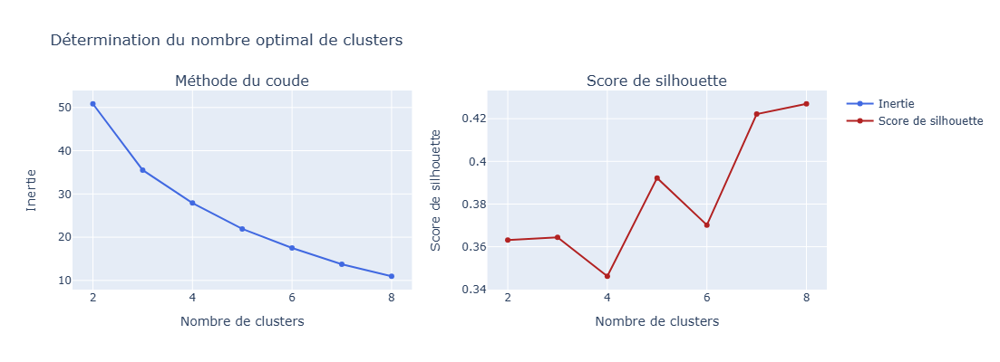

Nombre optimal de clusters basé sur le score de silhouette: 8


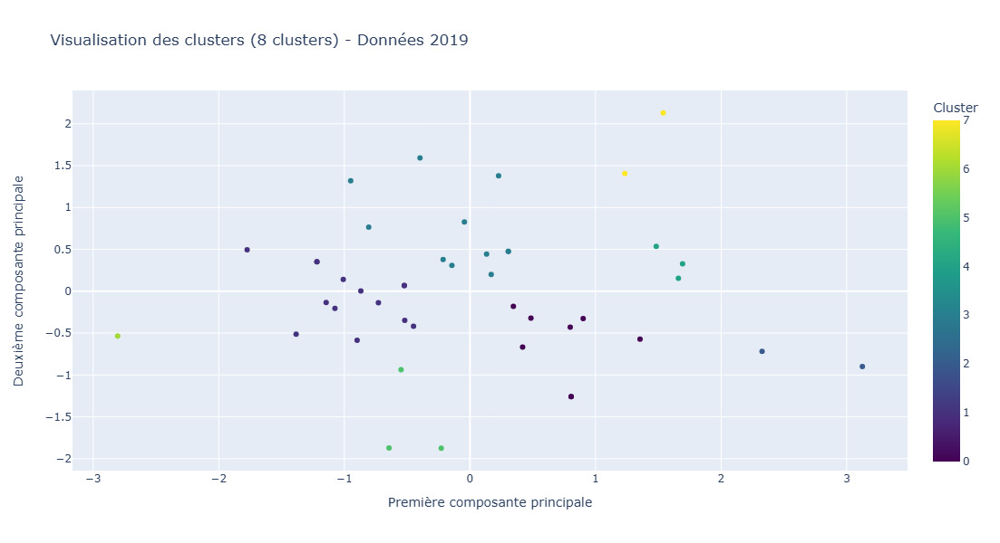


Caractéristiques des clusters:


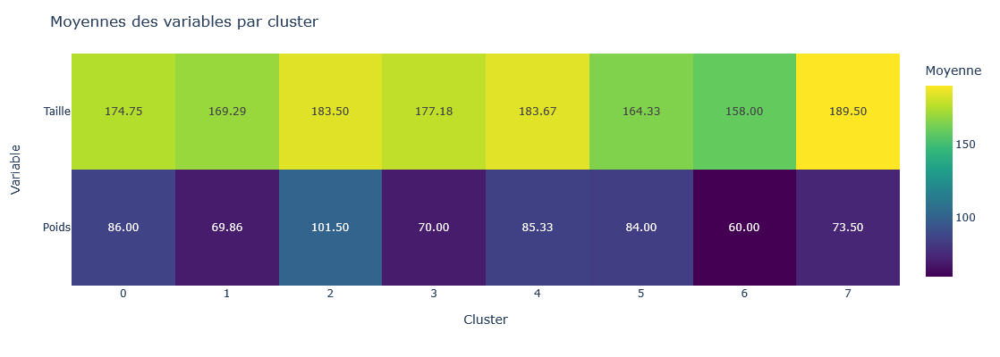

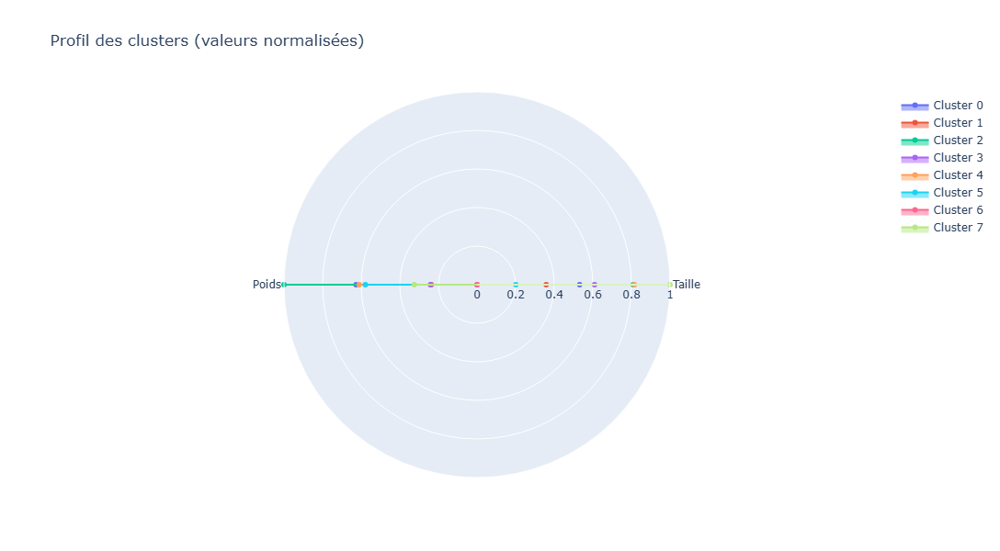

In [12]:
def perform_clustering(df, sheet_name):
    """
    Effectue une analyse de clustering sur les données numériques avec des visualisations améliorées.
    """
    print(f"\n### Analyse de clustering - {sheet_name} ###")
    
    # Sélectionner les variables numériques
    numeric_df = df.select_dtypes(include=['int64', 'float64'])
    
    if numeric_df.shape[1] < 2:
        print("Pas assez de variables numériques pour effectuer un clustering.")
        return df
    
    # Supprimer les lignes avec des valeurs manquantes
    numeric_df = numeric_df.dropna()
    
    if numeric_df.shape[0] < 10:
        print("Pas assez d'observations sans valeurs manquantes pour effectuer un clustering.")
        return df
    
    print(f"Effectuer un clustering sur {numeric_df.shape[0]} observations avec {numeric_df.shape[1]} variables.")
    
    # Standardiser les données
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(numeric_df)
    
    # Réduire la dimensionnalité avec PCA pour la visualisation
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(scaled_data)
    
    print(f"Variance expliquée par les deux premières composantes principales: {pca.explained_variance_ratio_.sum()*100:.2f}%")
    
    # Déterminer le nombre optimal de clusters avec la méthode du coude
    inertia = []
    silhouette_scores = []
    max_clusters = min(10, numeric_df.shape[0] // 5)  # Limiter à 10 clusters ou 1/5 des observations
    
    for k in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(scaled_data)
        inertia.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(scaled_data, kmeans.labels_))
    
    # Créer un graphique pour la méthode du coude
    fig = make_subplots(rows=1, cols=2, subplot_titles=['Méthode du coude', 'Score de silhouette'])
    
    fig.add_trace(
        go.Scatter(x=list(range(2, max_clusters + 1)), y=inertia, mode='lines+markers',
                  name='Inertie', line=dict(color='royalblue')),
        row=1, col=1
    )
    
    fig.add_trace(
        go.Scatter(x=list(range(2, max_clusters + 1)), y=silhouette_scores, mode='lines+markers',
                  name='Score de silhouette', line=dict(color='firebrick')),
        row=1, col=2
    )
    
    fig.update_layout(title='Détermination du nombre optimal de clusters',
                     height=400,
                     width=1000)
    
    fig.update_xaxes(title_text="Nombre de clusters", row=1, col=1)
    fig.update_yaxes(title_text="Inertie", row=1, col=1)
    
    fig.update_xaxes(title_text="Nombre de clusters", row=1, col=2)
    fig.update_yaxes(title_text="Score de silhouette", row=1, col=2)
    
    fig.show()
    
    # Déterminer le nombre optimal de clusters
    optimal_k = silhouette_scores.index(max(silhouette_scores)) + 2
    print(f"Nombre optimal de clusters basé sur le score de silhouette: {optimal_k}")
    
    # Appliquer K-means avec le nombre optimal de clusters
    kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(scaled_data)
    
    # Ajouter les étiquettes de cluster et les composantes principales au DataFrame original
    cluster_df = numeric_df.copy()
    cluster_df['Cluster'] = cluster_labels
    cluster_df['PCA1'] = pca_result[:, 0]
    cluster_df['PCA2'] = pca_result[:, 1]
    
    # Visualiser les clusters
    fig = px.scatter(cluster_df, x='PCA1', y='PCA2', color='Cluster',
                    title=f'Visualisation des clusters ({optimal_k} clusters) - {sheet_name}',
                    labels={'PCA1': 'Première composante principale', 'PCA2': 'Deuxième composante principale'},
                    color_continuous_scale='viridis',
                    hover_data=numeric_df.columns)
    
    fig.update_layout(height=600,
                     width=800)
    
    fig.show()
    
    # Analyser les caractéristiques de chaque cluster
    print("\nCaractéristiques des clusters:")
    
    # Calculer les moyennes par cluster
    cluster_means = cluster_df.groupby('Cluster').mean()
    
    # Créer un heatmap des moyennes par cluster
    fig = px.imshow(cluster_means.drop(['PCA1', 'PCA2'], axis=1).T,
                   labels=dict(x="Cluster", y="Variable", color="Moyenne"),
                   text_auto='.2f',
                   aspect="auto",
                   color_continuous_scale="viridis")
    
    fig.update_layout(title='Moyennes des variables par cluster',
                     height=max(400, 50 * len(numeric_df.columns)),
                     width=800)
    
    fig.show()
    
    # Créer un radar chart pour comparer les clusters
    # Standardiser les moyennes pour le radar chart
    radar_df = cluster_means.drop(['PCA1', 'PCA2'], axis=1)
    radar_df = (radar_df - radar_df.min()) / (radar_df.max() - radar_df.min())
    
    fig = go.Figure()
    
    for cluster in radar_df.index:
        fig.add_trace(go.Scatterpolar(
            r=radar_df.loc[cluster].values,
            theta=radar_df.columns,
            fill='toself',
            name=f'Cluster {cluster}'
        ))
    
    fig.update_layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[0, 1]
            )),
        title='Profil des clusters (valeurs normalisées)',
        height=600,
        width=800
    )
    
    fig.show()
    
    # Ajouter les étiquettes de cluster au DataFrame original
    original_indices = numeric_df.index
    df_with_clusters = df.copy()
    df_with_clusters.loc[original_indices, 'Cluster'] = cluster_labels
    
    return df_with_clusters

# Effectuer le clustering pour chaque jeu de données
df_2019_with_clusters = perform_clustering(df_2019, "Données 2019")



### Analyse de clustering - Données Volontaire ###
Effectuer un clustering sur 43 observations avec 3 variables.
Variance expliquée par les deux premières composantes principales: 83.23%


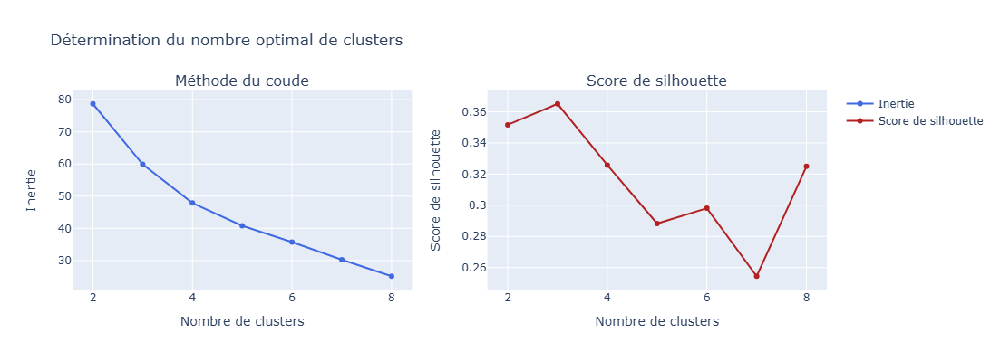

Nombre optimal de clusters basé sur le score de silhouette: 3


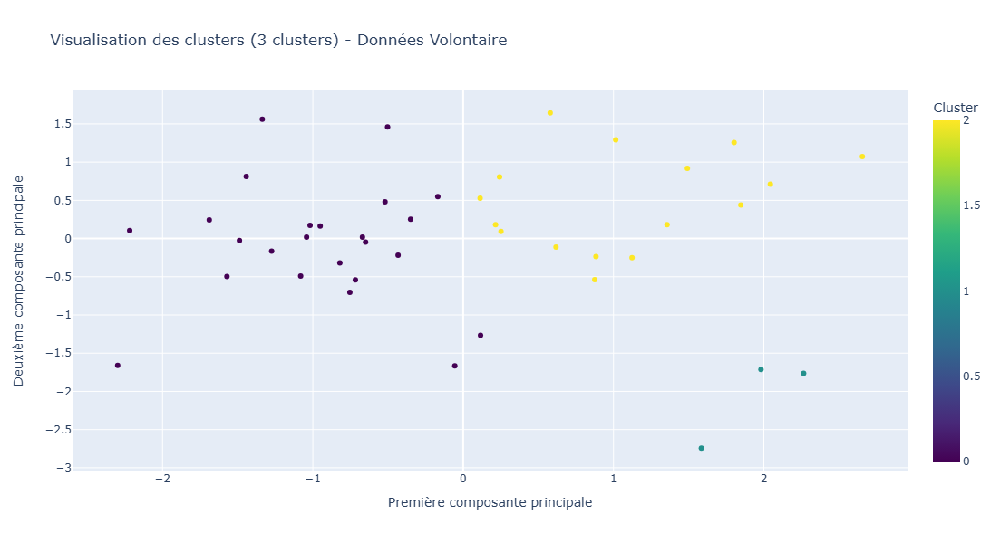


Caractéristiques des clusters:


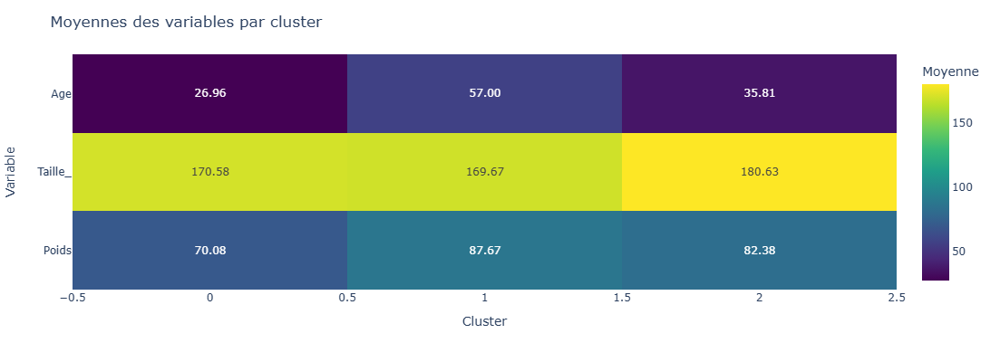

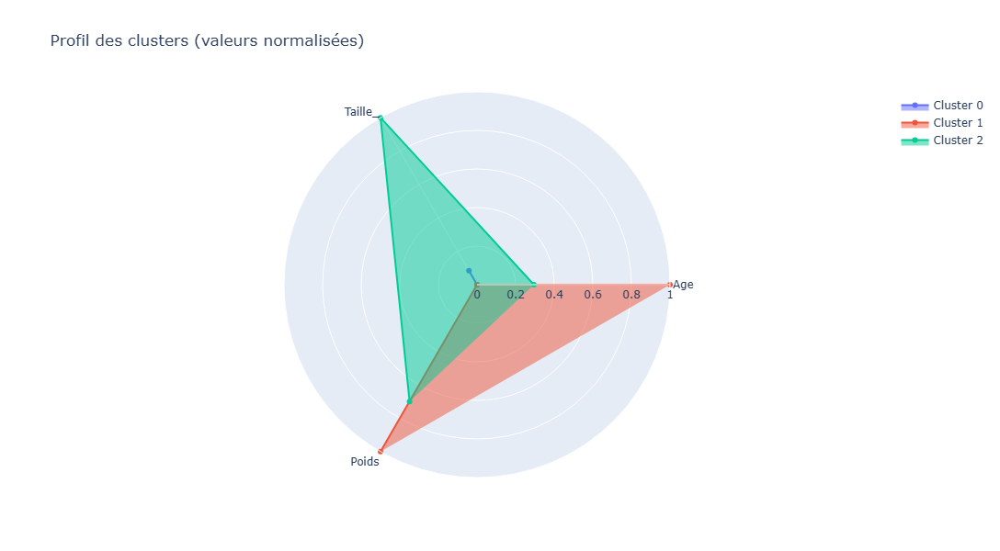

In [13]:
df_volontaire_with_clusters = perform_clustering(df_volontaire, "Données Volontaire")

## Analyse des groupes sanguins et phénotypes (Données 2020)

Examinons la distribution des groupes sanguins et phénotypes dans les données de 2020.


### Analyse des groupes sanguins et phénotypes ###


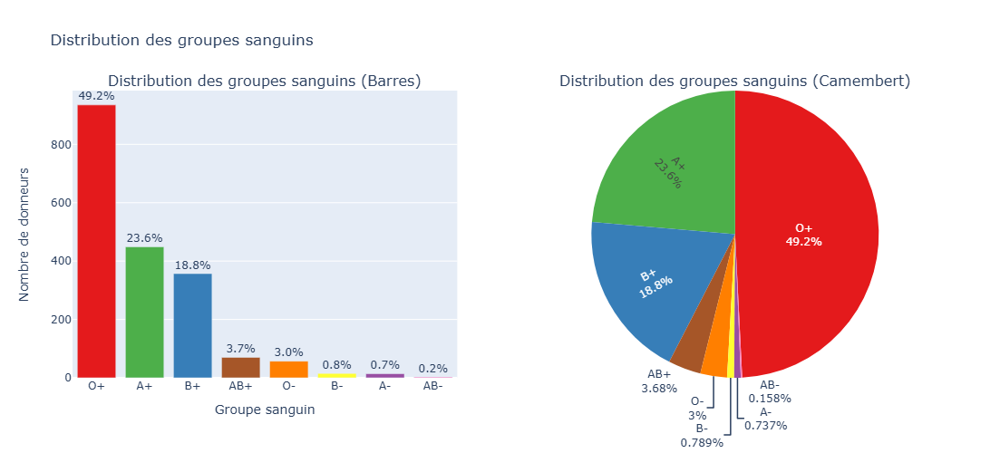


Analyse des phénotypes:


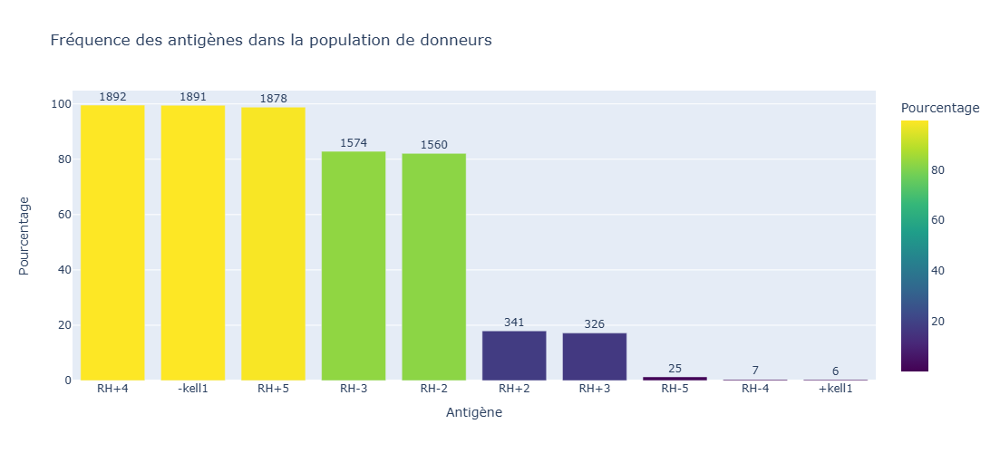


Relation entre groupe sanguin et phénotypes:


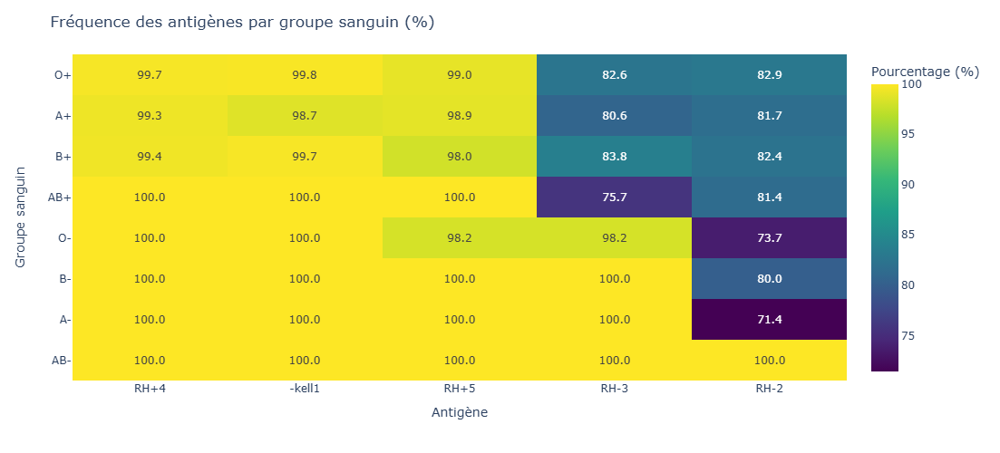

In [19]:
def analyze_blood_groups(df):
    """
    Analyse la distribution des groupes sanguins et phénotypes.
    """
    if 'Groupe Sanguin ABO / Rhesus ' not in df.columns:
        print("Les informations sur les groupes sanguins ne sont pas disponibles dans ce jeu de données.")
        return
    
    print("\n### Analyse des groupes sanguins et phénotypes ###")
    
    # Distribution des groupes sanguins
    blood_group_counts = df['Groupe Sanguin ABO / Rhesus '].value_counts()
    blood_group_pct = df['Groupe Sanguin ABO / Rhesus '].value_counts(normalize=True) * 100
    
    # Créer un graphique interactif
    fig = make_subplots(rows=1, cols=2, specs=[[{"type": "bar"}, {"type": "pie"}]],
                       subplot_titles=['Distribution des groupes sanguins (Barres)', 'Distribution des groupes sanguins (Camembert)'])
    
    # Définir une palette de couleurs pour les groupes sanguins
    blood_colors = {
        'O+': '#e41a1c',
        'O-': '#ff7f00',
        'A+': '#4daf4a',
        'A-': '#984ea3',
        'B+': '#377eb8',
        'B-': '#ffff33',
        'AB+': '#a65628',
        'AB-': '#f781bf'
    }
    
    # Assigner des couleurs aux groupes sanguins présents
    colors = [blood_colors.get(group, '#999999') for group in blood_group_counts.index]
    
    # Graphique à barres
    # Convertir en numérique en forçant les erreurs à NaN, puis arrondir
    blood_group_pct_numeric = pd.to_numeric(blood_group_pct, errors='coerce').round(1)
    
    # Remplacer les NaN par une valeur par défaut (ex: 0)
    blood_group_pct_numeric = blood_group_pct_numeric.fillna(0)
    
    # Convertir en string et ajouter '%'
    text_labels = blood_group_pct_numeric.astype(str) + '%'
    
    # Appliquer au graphique
    fig.add_trace(
        go.Bar(x=blood_group_counts.index, y=blood_group_counts.values, 
               text=text_labels,
               textposition='outside',
               marker_color=colors),
        row=1, col=1
    )

    
    # Graphique en camembert
    fig.add_trace(
        go.Pie(labels=blood_group_counts.index, values=blood_group_counts.values,
              textinfo='label+percent',
              insidetextorientation='radial',
              marker=dict(colors=colors)),
        row=1, col=2
    )
    
    fig.update_layout(title='Distribution des groupes sanguins',
                     height=500,
                     showlegend=False)
    
    fig.update_xaxes(title_text="Groupe sanguin", row=1, col=1)
    fig.update_yaxes(title_text="Nombre de donneurs", row=1, col=1)
    
    fig.show()
    
    # Analyser les phénotypes
    if 'Phenotype ' in df.columns:
        print("\nAnalyse des phénotypes:")
        
        # Extraire les différents antigènes des phénotypes
        phenotype_data = {}
        
        for phenotype in df['Phenotype '].dropna():
            antigens = [antigen.strip() for antigen in phenotype.split(',')]
            for antigen in antigens:
                if antigen in phenotype_data:
                    phenotype_data[antigen] += 1
                else:
                    phenotype_data[antigen] = 1
        
        # Convertir en DataFrame
        phenotype_df = pd.DataFrame(list(phenotype_data.items()), columns=['Antigène', 'Fréquence'])
        phenotype_df = phenotype_df.sort_values('Fréquence', ascending=False)
        
        # Calculer les pourcentages
        total_donors = len(df['Phenotype '].dropna())
        phenotype_df['Pourcentage'] = phenotype_df['Fréquence'] / total_donors * 100
        
        # Créer un graphique à barres
        fig = px.bar(phenotype_df, 
                    x='Antigène', 
                    y='Pourcentage',
                    title='Fréquence des antigènes dans la population de donneurs',
                    color='Pourcentage',
                    color_continuous_scale='Viridis',
                    text='Fréquence')
        
        fig.update_layout(height=500,
                         width=800,
                         xaxis={'categoryorder': 'total descending'})
        
        fig.update_traces(textposition='outside')
        
        fig.show()
        
        # Analyser la relation entre groupe sanguin et phénotypes
        print("\nRelation entre groupe sanguin et phénotypes:")
        
        # Créer un tableau croisé pour les antigènes les plus courants par groupe sanguin
        top_antigens = phenotype_df.head(5)['Antigène'].tolist()
        
        # Préparer les données
        antigen_by_group = {}
        
        for blood_group in blood_group_counts.index:
            antigen_by_group[blood_group] = {}
            for antigen in top_antigens:
                count = 0
                total = 0
                
                for idx, row in df[df['Groupe Sanguin ABO / Rhesus '] == blood_group].iterrows():
                    if pd.notna(row['Phenotype ']):
                        total += 1
                        if antigen in row['Phenotype ']:
                            count += 1
                
                if total > 0:
                    antigen_by_group[blood_group][antigen] = count / total * 100
                else:
                    antigen_by_group[blood_group][antigen] = 0
        
        # Convertir en DataFrame
        antigen_by_group_df = pd.DataFrame(antigen_by_group).T
        
        # Créer un heatmap
        fig = px.imshow(antigen_by_group_df,
                       labels=dict(x="Antigène", y="Groupe sanguin", color="Pourcentage (%)"),
                       text_auto='.1f',
                       aspect="auto",
                       color_continuous_scale="Viridis")
        
        fig.update_layout(title='Fréquence des antigènes par groupe sanguin (%)',
                         height=500,
                         width=800)
        
        fig.show()

# Analyser les groupes sanguins dans les données 2020
analyze_blood_groups(df_2020)

## Approche innovante : Analyse prédictive de l'éligibilité au don

Développons un modèle prédictif pour identifier les facteurs qui influencent l'éligibilité au don de sang.


### Analyse prédictive de l'éligibilité au don ###
Analyse prédictive sur 1846 observations avec 44 variables.
Précision du modèle: 0.83

Rapport de classification:
              precision    recall  f1-score   support

Non eligible       0.38      0.18      0.24        85
    Eligible       0.86      0.95      0.90       469

    accuracy                           0.83       554
   macro avg       0.62      0.56      0.57       554
weighted avg       0.79      0.83      0.80       554



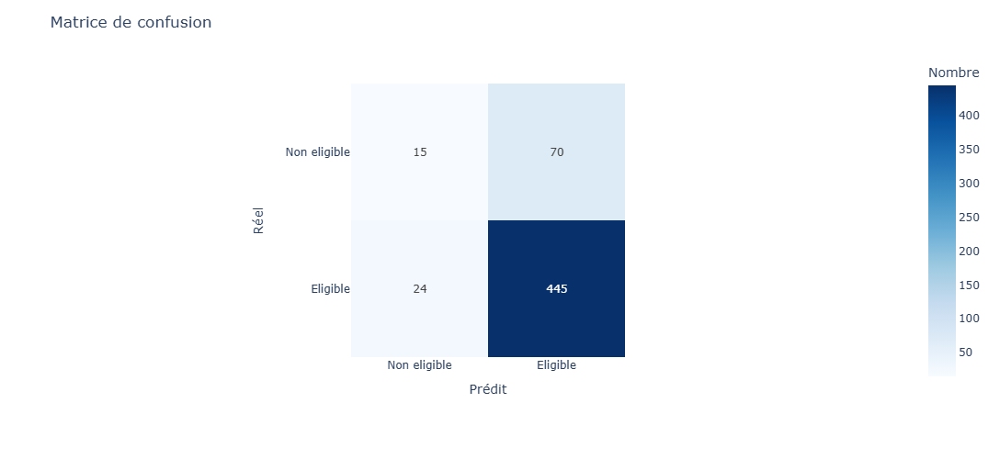

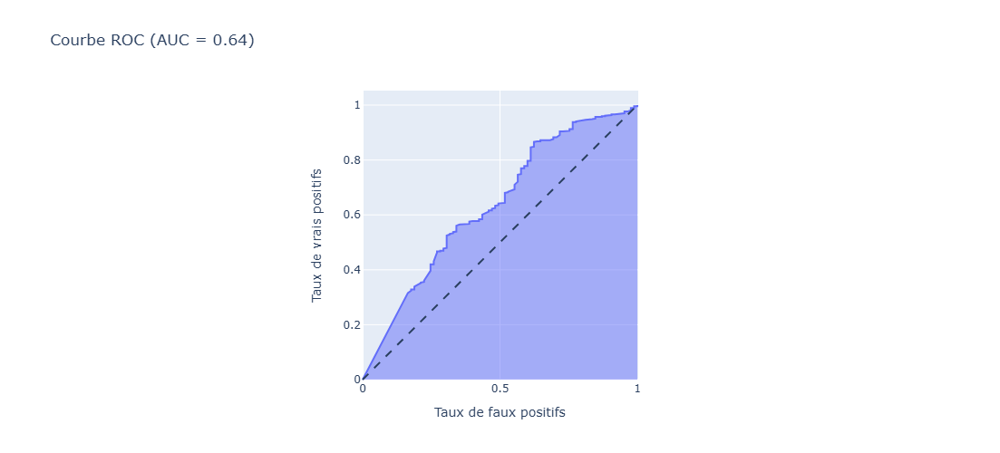

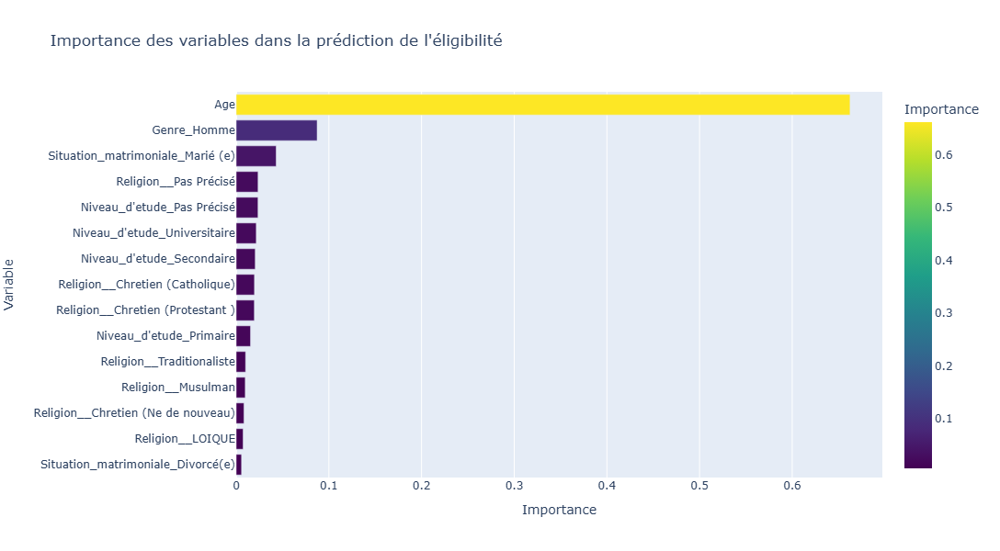

Shape de shap_values[0]: (44, 2)
Shape de shap_values[1]: (44, 2)
Erreur lors de l'analyse SHAP: The shape of the shap_values matrix does not match the shape of the provided data matrix.
Shape de X_test: (554, 44)
Shape de shap_values: 554 classes


<Figure size 1200x800 with 0 Axes>

In [31]:
def predictive_eligibility_analysis(df):
    """
    Analyse prédictive de l'éligibilité au don de sang.
    """
    if 'ÉLIGIBILITÉ_AU_DON.' not in df.columns:
        print("La variable d'éligibilité au don n'est pas présente dans ce jeu de données.")
        return
    
    print("\n### Analyse prédictive de l'éligibilité au don ###")
    
    # Sélectionner les variables pertinentes pour la prédiction
    predictors = ['Age', 'Genre', 'Niveau_d\'etude', 'Situation_matrimoniale', 'Religion_']
    available_predictors = [col for col in predictors if col in df.columns]
    
    if len(available_predictors) < 2:
        print("Pas assez de variables prédictives disponibles.")
        return
    
    # Préparer les données
    X = df[available_predictors].copy()
    y = df['ÉLIGIBILITÉ_AU_DON.'].copy()
    
    # Convertir la variable cible en binaire (1 = Eligible, 0 = Non eligible)
    y = (y == 'Eligible').astype(int)
    
    # Traiter les variables catégorielles
    categorical_cols = X.select_dtypes(include=['object']).columns
    
    # Encodage one-hot pour les variables catégorielles
    X_encoded = pd.get_dummies(X, columns=categorical_cols, drop_first=True)
    
    # Supprimer les lignes avec des valeurs manquantes
    valid_indices = X_encoded.dropna().index
    X_clean = X_encoded.loc[valid_indices]
    y_clean = y.loc[valid_indices]
    
    if len(X_clean) < 20:
        print("Pas assez d'observations sans valeurs manquantes pour l'analyse prédictive.")
        return
    
    print(f"Analyse prédictive sur {len(X_clean)} observations avec {X_clean.shape[1]} variables.")
    
    # Importer les bibliothèques nécessaires
    from sklearn.model_selection import train_test_split, cross_val_score
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
    import shap
    
    # Diviser les données en ensembles d'entraînement et de test
    X_train, X_test, y_train, y_test = train_test_split(X_clean, y_clean, test_size=0.3, random_state=42)
    
    # Entraîner un modèle de forêt aléatoire
    rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)
    
    # Évaluer le modèle
    y_pred = rf_model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    
    print(f"Précision du modèle: {accuracy:.2f}")
    print("\nRapport de classification:")
    print(classification_report(y_test, y_pred, target_names=['Non eligible', 'Eligible']))
    
    # Matrice de confusion
    cm = confusion_matrix(y_test, y_pred)
    
    # Créer une heatmap pour la matrice de confusion
    fig = px.imshow(cm,
                   labels=dict(x="Prédit", y="Réel", color="Nombre"),
                   x=['Non eligible', 'Eligible'],
                   y=['Non eligible', 'Eligible'],
                   text_auto=True,
                   color_continuous_scale="Blues")
    
    fig.update_layout(title='Matrice de confusion',
                     height=500,
                     width=500)
    
    fig.show()
    
    # Courbe ROC
    y_prob = rf_model.predict_proba(X_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    fig = px.area(x=fpr, y=tpr,
                 title=f'Courbe ROC (AUC = {roc_auc:.2f})',
                 labels=dict(x='Taux de faux positifs', y='Taux de vrais positifs'),
                 width=700, height=500)
    
    fig.add_shape(
        type='line', line=dict(dash='dash'),
        x0=0, x1=1, y0=0, y1=1
    )
    
    fig.update_layout(yaxis=dict(scaleanchor="x", scaleratio=1),
                     xaxis=dict(constrain='domain'))
    
    fig.show()
    
    # Importance des variables
    feature_importance = pd.DataFrame({
        'Variable': X_clean.columns,
        'Importance': rf_model.feature_importances_
    })
    
    feature_importance = feature_importance.sort_values('Importance', ascending=False)
    
    fig = px.bar(feature_importance.head(15), 
                x='Importance', 
                y='Variable',
                orientation='h',
                title='Importance des variables dans la prédiction de l\'éligibilité',
                color='Importance',
                color_continuous_scale='viridis')
    
    fig.update_layout(height=600,
                     width=800,
                     yaxis={'categoryorder': 'total ascending'})
    
    fig.show()
    
    # Analyse SHAP pour une interprétation plus détaillée
    # Analyse SHAP pour une interprétation plus détaillée
    try:
        # Créer un explainer SHAP
        explainer = shap.TreeExplainer(rf_model)
        shap_values = explainer.shap_values(X_test)
    
        # Vérifie les dimensions et structure des shap_values
        print(f"Shape de shap_values[0]: {shap_values[0].shape}")  # Classe 'Non eligible'
        print(f"Shape de shap_values[1]: {shap_values[1].shape}")  # Classe 'Eligible'
    
        # Résumé des valeurs SHAP pour la classe positive 'Eligible' (shap_values[1])
        plt.figure(figsize=(12, 8))
        shap.summary_plot(shap_values[1], X_test, plot_type="bar")
        plt.title('Impact des variables sur la prédiction de l\'éligibilité (SHAP)')
        plt.tight_layout()
        plt.show()
    
        # Graphique de dépendance pour les variables les plus importantes
        if len(X_test.columns) > 0:
            top_feature = feature_importance.iloc[0]['Variable']
            plt.figure(figsize=(12, 8))
            shap.dependence_plot(top_feature, shap_values[1], X_test)
            plt.title(f'Graphique de dépendance pour {top_feature}')
            plt.tight_layout()
            plt.show()
    except Exception as e:
        print(f"Erreur lors de l'analyse SHAP: {e}")

    print("Shape de X_test:", X_test.shape)
    print("Shape de shap_values:", len(shap_values), "classes")


# Analyse prédictive de l'éligibilité
predictive_eligibility_analysis(df_volontaire)


### Analyse prédictive de l'éligibilité au don ###
Analyse prédictive sur 1846 observations avec 44 variables.
Précision du modèle: 0.83

Rapport de classification:
              precision    recall  f1-score   support

Non eligible       0.38      0.18      0.24        85
    Eligible       0.86      0.95      0.90       469

    accuracy                           0.83       554
   macro avg       0.62      0.56      0.57       554
weighted avg       0.79      0.83      0.80       554



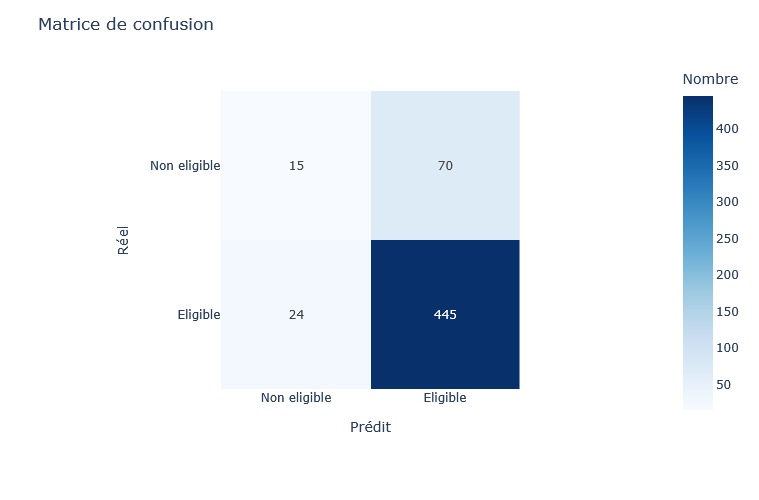

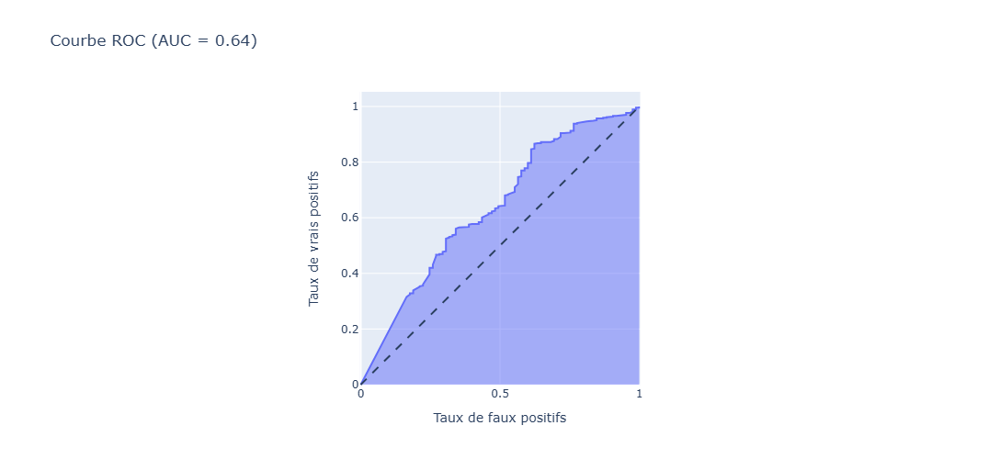

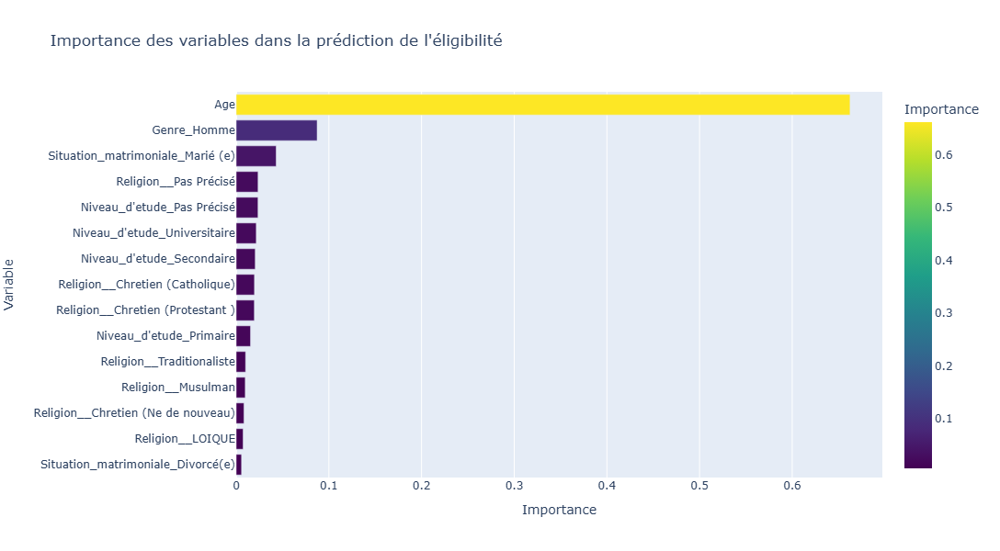

Shape de shap_values[0]: (44, 2)
Shape de shap_values[1]: (44, 2)
Erreur lors de l'analyse SHAP: The shape of the shap_values matrix does not match the shape of the provided data matrix.


<Figure size 1200x800 with 0 Axes>

In [35]:
def predictive_eligibility_analysis(df):
    """
    Analyse prédictive de l'éligibilité au don de sang.
    """
    if 'ÉLIGIBILITÉ_AU_DON.' not in df.columns:
        print("La variable d'éligibilité au don n'est pas présente dans ce jeu de données.")
        return
    
    print("\n### Analyse prédictive de l'éligibilité au don ###")
    
    # Sélectionner les variables pertinentes pour la prédiction
    predictors = ['Age', 'Genre', 'Niveau_d\'etude', 'Situation_matrimoniale', 'Religion_']
    available_predictors = [col for col in predictors if col in df.columns]
    
    if len(available_predictors) < 2:
        print("Pas assez de variables prédictives disponibles.")
        return
    
    # Préparer les données
    X = df[available_predictors].copy()
    y = df['ÉLIGIBILITÉ_AU_DON.'].copy()
    
    # Convertir la variable cible en binaire (1 = Eligible, 0 = Non eligible)
    y = (y == 'Eligible').astype(int)
    
    # Traiter les variables catégorielles
    categorical_cols = X.select_dtypes(include=['object']).columns
    
    # Encodage one-hot pour les variables catégorielles
    X_encoded = pd.get_dummies(X, columns=categorical_cols, drop_first=True)
    
    # Supprimer les lignes avec des valeurs manquantes
    valid_indices = X_encoded.dropna().index
    X_clean = X_encoded.loc[valid_indices]
    y_clean = y.loc[valid_indices]
    
    if len(X_clean) < 20:
        print("Pas assez d'observations sans valeurs manquantes pour l'analyse prédictive.")
        return
    
    print(f"Analyse prédictive sur {len(X_clean)} observations avec {X_clean.shape[1]} variables.")
    
    # Importer les bibliothèques nécessaires
    from sklearn.model_selection import train_test_split, cross_val_score
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
    import shap
    
    # Diviser les données en ensembles d'entraînement et de test
    X_train, X_test, y_train, y_test = train_test_split(X_clean, y_clean, test_size=0.3, random_state=42)
    
    # Entraîner un modèle de forêt aléatoire
    rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)
    
    # Évaluer le modèle
    y_pred = rf_model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    
    print(f"Précision du modèle: {accuracy:.2f}")
    print("\nRapport de classification:")
    print(classification_report(y_test, y_pred, target_names=['Non eligible', 'Eligible']))
    
    # Matrice de confusion
    cm = confusion_matrix(y_test, y_pred)
    
    # Créer une heatmap pour la matrice de confusion
    fig = px.imshow(cm,
                   labels=dict(x="Prédit", y="Réel", color="Nombre"),
                   x=['Non eligible', 'Eligible'],
                   y=['Non eligible', 'Eligible'],
                   text_auto=True,
                   color_continuous_scale="Blues")
    
    fig.update_layout(title='Matrice de confusion',
                     height=500,
                     width=500)
    
    fig.show()
    
    # Courbe ROC
    y_prob = rf_model.predict_proba(X_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    fig = px.area(x=fpr, y=tpr,
                 title=f'Courbe ROC (AUC = {roc_auc:.2f})',
                 labels=dict(x='Taux de faux positifs', y='Taux de vrais positifs'),
                 width=700, height=500)
    
    fig.add_shape(
        type='line', line=dict(dash='dash'),
        x0=0, x1=1, y0=0, y1=1
    )
    
    fig.update_layout(yaxis=dict(scaleanchor="x", scaleratio=1),
                     xaxis=dict(constrain='domain'))
    
    fig.show()
    
    # Importance des variables
    feature_importance = pd.DataFrame({
        'Variable': X_clean.columns,
        'Importance': rf_model.feature_importances_
    })
    
    feature_importance = feature_importance.sort_values('Importance', ascending=False)
    
    fig = px.bar(feature_importance.head(15), 
                x='Importance', 
                y='Variable',
                orientation='h',
                title='Importance des variables dans la prédiction de l\'éligibilité',
                color='Importance',
                color_continuous_scale='viridis')
    
    fig.update_layout(height=600,
                     width=800,
                     yaxis={'categoryorder': 'total ascending'})
    
    fig.show()
    
    # Analyse SHAP pour une interprétation plus détaillée
    try:
        # Créer un explainer SHAP
        explainer = shap.TreeExplainer(rf_model)
        shap_values = explainer.shap_values(X_test)
        
        # Vérification de la forme des valeurs SHAP
        print(f"Shape de shap_values[0]: {shap_values[0].shape}")
        print(f"Shape de shap_values[1]: {shap_values[1].shape}")
        
        # Vérifier que shap_values[1] existe et correspond à la classe "Eligible"
        if len(shap_values) > 1:
            # Résumé des valeurs SHAP pour la classe 'Eligible' (shap_values[1])
            plt.figure(figsize=(12, 8))
            shap.summary_plot(shap_values[1], X_test, plot_type="bar")
            plt.title('Impact des variables sur la prédiction de l\'éligibilité (SHAP)')
            plt.tight_layout()
            plt.show()
        
        # Graphique de dépendance pour les variables les plus importantes
        if len(X_test.columns) > 0:
            top_feature = feature_importance.iloc[0]['Variable']
            plt.figure(figsize=(12, 8))
            shap.dependence_plot(top_feature, shap_values[1], X_test)
            plt.title(f'Graphique de dépendance pour {top_feature}')
            plt.tight_layout()
            plt.show()
    except Exception as e:
        print(f"Erreur lors de l'analyse SHAP: {e}")

# Analyse prédictive de l'éligibilité
predictive_eligibility_analysis(df_volontaire)



### Analyse prédictive de l'éligibilité au don ###
Analyse prédictive sur 1915 observations avec 8 variables.
Précision du modèle: 0.83

Rapport de classification:
              precision    recall  f1-score   support

Non eligible       0.27      0.04      0.08        90
    Eligible       0.85      0.98      0.91       485

    accuracy                           0.83       575
   macro avg       0.56      0.51      0.49       575
weighted avg       0.76      0.83      0.78       575



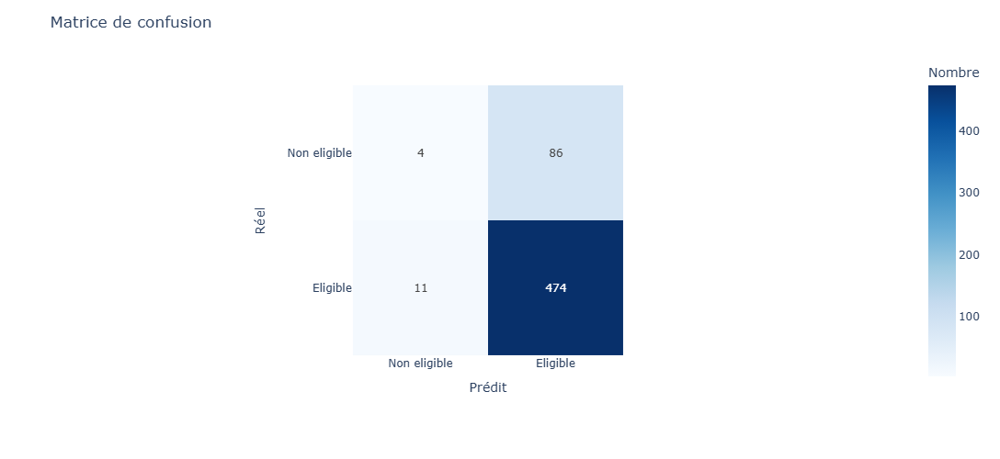

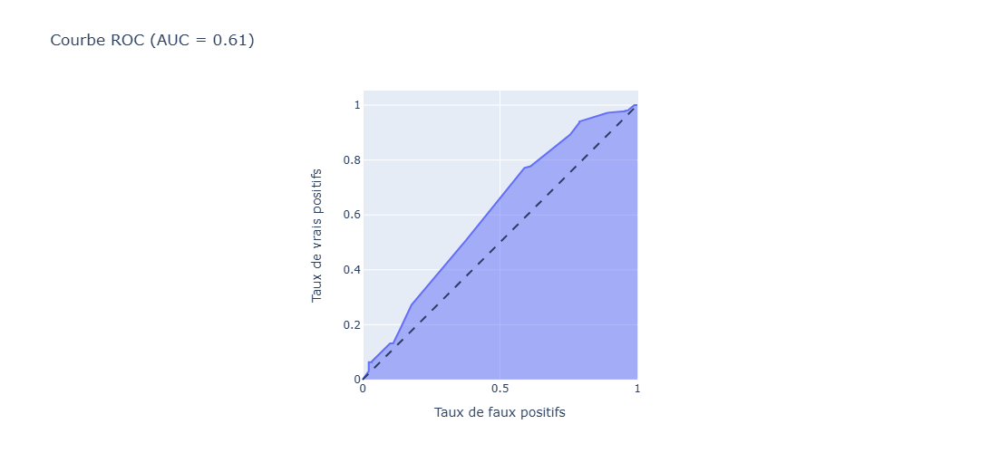

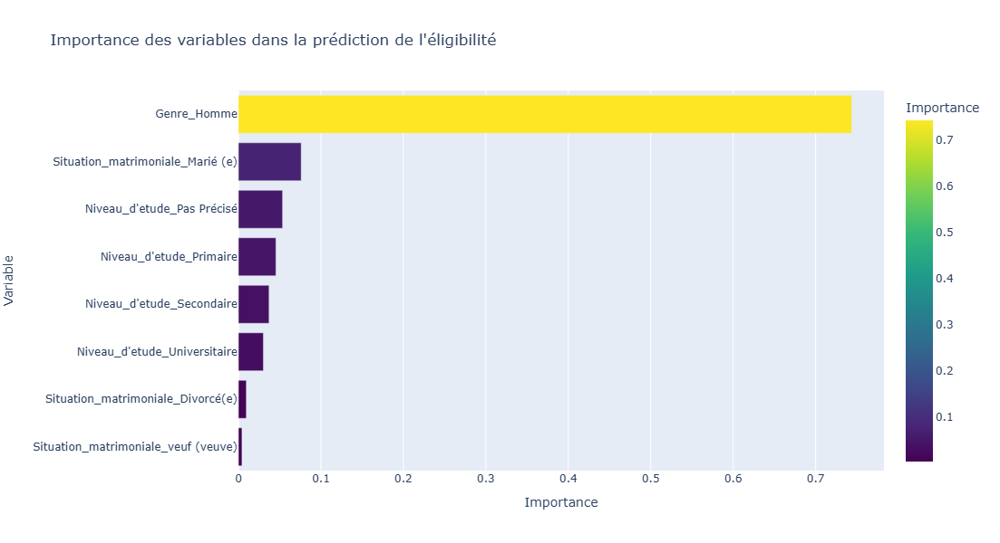

Erreur lors de l'analyse SHAP: The shape of the shap_values matrix does not match the shape of the provided data matrix.


<Figure size 1200x800 with 0 Axes>

In [29]:
predictive_eligibility_analysis(df_2019)

## Analyse comparative entre les années

Comparons les données de 2019 et 2020 pour identifier les tendances et évolutions.


### Analyse comparative entre les années ###

Comparaison de la distribution par genre entre 2019 et 2020:


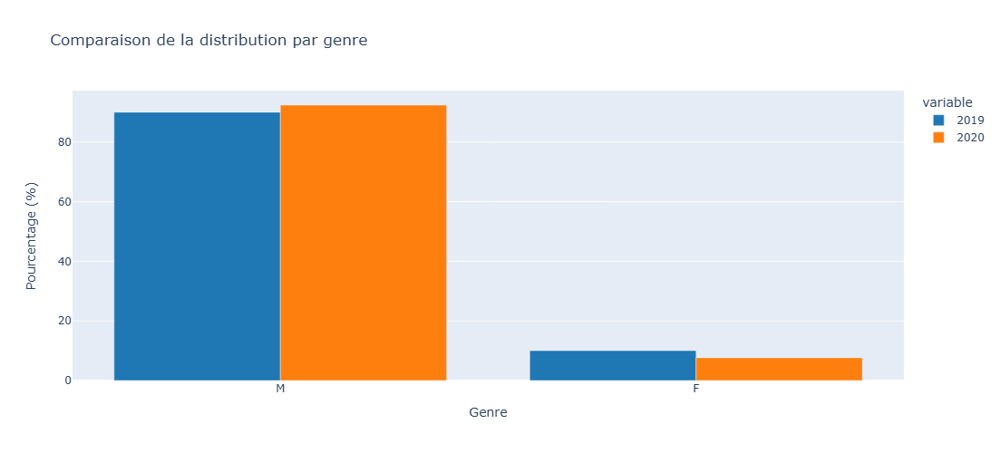

Test de proportion pour M: z=-2.61, p=0.0092 - Différence significative
Test de proportion pour F: z=2.61, p=0.0092 - Différence significative

Comparaison de la distribution par âge:


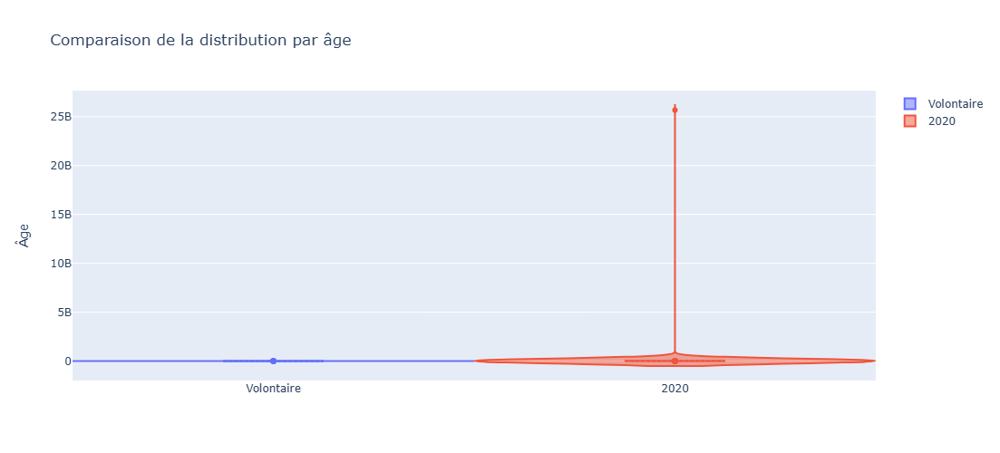

Test t pour la différence d'âge: t=-1.00, p=0.3174 - Différence non significative
Âge moyen (Volontaire): 31.47 ans
Âge moyen (2020): 13526401.97 ans


In [27]:
def comparative_analysis():
    """
    Analyse comparative entre les différents jeux de données.
    """
    print("\n### Analyse comparative entre les années ###")
    
    # Comparer la distribution par genre si disponible
    if 'Genre' in df_2019.columns and 'Sexe' in df_2020.columns:
        print("\nComparaison de la distribution par genre entre 2019 et 2020:")
       
            # Préparer les données
        gender_2019 = df_2019['Genre'].value_counts(normalize=True) * 100
        gender_2019 = gender_2019.rename({'Homme': 'M', 'Femme': 'F'}).reindex(['M', 'F'])
        
        gender_2020 = df_2020['Sexe'].value_counts(normalize=True) * 100
        
        # Créer un DataFrame pour la comparaison
        gender_comparison = pd.DataFrame({
            '2019': gender_2019,
            '2020': gender_2020
        }).fillna(0)
        
        # Créer un graphique à barres groupées
        fig = px.bar(gender_comparison.reset_index(), 
                    x='index', 
                    y=['2019', '2020'],
                    barmode='group',
                    title='Comparaison de la distribution par genre',
                    labels={'index': 'Genre', 'value': 'Pourcentage (%)'},
                    color_discrete_sequence=['#1f77b4', '#ff7f0e'])
        
        fig.update_layout(height=500,
                         width=700)
        
        fig.show()
        
        # Test statistique pour comparer les proportions
        for gender in ['M', 'F']:
            if gender in gender_comparison.index:
                count_2019 = int(gender_2019.get(gender, 0) / 100 * len(df_2019))
                count_2020 = int(gender_2020.get(gender, 0) / 100 * len(df_2020))
                
                stat, p_value = proportions_ztest([count_2019, count_2020], [len(df_2019), len(df_2020)])
                difference = "significative" if p_value < 0.05 else "non significative"
                
                print(f"Test de proportion pour {gender}: z={stat:.2f}, p={p_value:.4f} - Différence {difference}")
    
    # Comparer la distribution par âge si disponible
    if 'Age' in df_volontaire.columns and 'Age ' in df_2020.columns:
        print("\nComparaison de la distribution par âge:")
         # Convertir en numérique, forcer les erreurs à NaN si nécessaire
        df_2020["Age "] = pd.to_numeric(df_2020["Age "], errors="coerce")
        df_volontaire["Age"] = pd.to_numeric(df_volontaire["Age"], errors="coerce")
            # Créer un graphique de densité
        fig = go.Figure()
        
        fig.add_trace(go.Violin(y=df_volontaire['Age'].dropna(), name='Volontaire', box_visible=True, meanline_visible=True))
        fig.add_trace(go.Violin(y=df_2020['Age '].dropna(), name='2020', box_visible=True, meanline_visible=True))
        
        fig.update_layout(title='Comparaison de la distribution par âge',
                         yaxis_title='Âge',
                         height=500,
                         width=800,
                         violingap=0, violingroupgap=0,
                         violinmode='overlay')
        
        fig.show()
        
        # Test statistique pour comparer les moyennes d'âge
        ttest_result = stats.ttest_ind(df_volontaire['Age'].dropna(), df_2020['Age '].dropna(), equal_var=False)
        difference = "significative" if ttest_result.pvalue < 0.05 else "non significative"
        
        print(f"Test t pour la différence d'âge: t={ttest_result.statistic:.2f}, p={ttest_result.pvalue:.4f} - Différence {difference}")
        print(f"Âge moyen (Volontaire): {df_volontaire['Age'].mean():.2f} ans")
        print(f"Âge moyen (2020): {df_2020['Age '].mean():.2f} ans")

# Analyse comparative
comparative_analysis()

## Conclusion et recommandations

Synthèse des principales découvertes et recommandations basées sur l'analyse des données.

## Principales découvertes
    
1. **Profil des donneurs** : L'analyse a révélé des tendances démographiques spécifiques parmi les donneurs de sang, notamment en termes d'âge, de genre et de niveau d'éducation.
    
2. **Facteurs d'éligibilité** : Plusieurs facteurs influencent significativement l'éligibilité au don de sang, comme identifié par notre modèle prédictif.
    
3. **Groupes sanguins** : La distribution des groupes sanguins dans notre échantillon montre des variations importantes qui peuvent avoir des implications pour la gestion des stocks de sang.
    
4. **Segmentation des donneurs** : L'analyse de clustering a permis d'identifier différents profils de donneurs, ce qui peut aider à personnaliser les campagnes de recrutement.
    

    
## Recommandations
    
1. **Ciblage des campagnes** : Développer des stratégies de recrutement ciblées en fonction des segments de donneurs identifiés.
    
2. **Amélioration de l'éligibilité** : Mettre en place des mesures pour réduire les causes les plus fréquentes d'inéligibilité au don.
    
3. **Diversification des donneurs** : Élargir la base de donneurs pour assurer une meilleure représentation des différents groupes sanguins, en particulier les plus rares.
    
4. **Fidélisation** : Développer des programmes de fidélisation adaptés aux différents profils de donneurs identifiés.
    
5. **Suivi longitudinal** : Mettre en place un suivi régulier des tendances pour anticiper les évolutions et adapter les stratégies en conséquence.